In [1]:
import matplotlib.pyplot as plt
import seaborn as sns 
import pandas as pd 
import numpy as np

from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import re


sns.set(rc={'figure.figsize': [14, 7]}, font_scale=1.2)
np.seterr(divide='ignore', invalid='ignore', over='ignore')
pd.set_option('display.max_columns', None)

import warnings 
warnings.filterwarnings("ignore")

%matplotlib inline

# EDA

In [2]:
df = pd.read_csv("data/train.csv",low_memory=False)

In [3]:
target = "Credit_Score"

In [4]:
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,_,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5,4,6.27,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6,NaN,11.27,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [5]:
df.sample(5)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
22929,0x9c5b,CUS_0x73c0,February,Daniel Flynnz,43,798-34-9453,Writer,77004.92,NaN,10,5,22,6,"Personal Loan, Credit-Builder Loan, Credit-Bui...",43,14,31.82,9.0,Bad,2511.6,36.960924,1 Years and 5 Months,Yes,370.647122,108.06094786686887,High_spent_Large_value_payments,384.59959651852273,Poor
94582,0x24030,CUS_0xb125,July,Vidyaq,-500,744-83-0776,Media_Manager,98175.72,7729.695181,5,6,12,2,"Mortgage Loan, and Payday Loan",16,20,17.78,8.0,Standard,439.88,34.937117,17 Years and 3 Months,Yes,828.667038,199.48441598192073,High_spent_Large_value_payments,747.7943649362927,Standard
51582,0x1443c,CUS_0xb4c2,July,Mutikanii,28,#F%$D@*&8,Musician,33787.3,2956.608333,7,5,34,6,"Mortgage Loan, Auto Loan, Auto Loan, Credit-Bu...",49,15,0.72,11.0,Bad,2813.15,23.498962,NaN,Yes,101.553158,384.2749570573246,Low_spent_Small_value_payments,99.83271856995606,Standard
39219,0xfbcd,CUS_0x5ba1,April,Spetalnickj,31,803-91-4307,Scientist,45472.95,3676.412500,9,6,18,5,"Debt Consolidation Loan, Payday Loan, Personal...",50,17,8.69,9.0,Bad,1814.78,39.028478,16 Years and 6 Months,Yes,119.625748,113.25647357424471,High_spent_Medium_value_payments,384.7590288209252,Poor
43407,0x11455,CUS_0x8bcd,August,Kentaro Sugiyamae,34,948-09-0109,Teacher,50778.48,4501.540000,6,6,18,7,"Personal Loan, Not Specified, Mortgage Loan, P...",25,16,13.52,6.0,Standard,1554.93,37.098618,17 Years and 6 Months,Yes,152.957046,309.06742410824864,Low_spent_Medium_value_payments,268.12953021625117,Poor


In [6]:
df.tail()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",23,7,11.5,3.0,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.86622816574095,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",18,7,11.5,3.0,_,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.651610435322,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,5729,2,"Auto Loan, and Student Loan",27,6,11.5,3.0,Good,502.38,41.255522,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.8090832742814,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",20,NaN,11.5,3.0,Good,502.38,33.638208,31 Years and 9 Months,No,35.104023,251.67258219721603,Low_spent_Large_value_payments,319.1649785257098,Standard
99999,0x25fed,CUS_0x942c,August,Nicks,25,078-73-5990,Mechanic,39628.99_,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",18,6,11.5,3.0,Good,502.38,34.192463,31 Years and 10 Months,No,35.104023,167.1638651610451,!@9#%8,393.6736955618808,Poor


In [7]:
df.shape

(100000, 28)

In [8]:
df.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Monthly_Inhand_Salary,84998.0,4194.170850,3183.686167,303.645417,1625.568229,3093.745000,5957.448333,15204.633333
Num_Bank_Accounts,100000.0,17.091280,117.404834,-1.000000,3.000000,6.000000,7.000000,1798.000000
Num_Credit_Card,100000.0,22.474430,129.057410,0.000000,4.000000,5.000000,7.000000,1499.000000
Interest_Rate,100000.0,72.466040,466.422621,1.000000,8.000000,13.000000,20.000000,5797.000000
Delay_from_due_date,100000.0,21.068780,14.860104,-5.000000,10.000000,18.000000,28.000000,67.000000
Num_Credit_Inquiries,98035.0,27.754251,193.177339,0.000000,3.000000,6.000000,9.000000,2597.000000
Credit_Utilization_Ratio,100000.0,32.285173,5.116875,20.000000,28.052567,32.305784,36.496663,50.000000
Total_EMI_per_month,100000.0,1403.118217,8306.041270,0.000000,30.306660,69.249473,161.224249,82331.000000


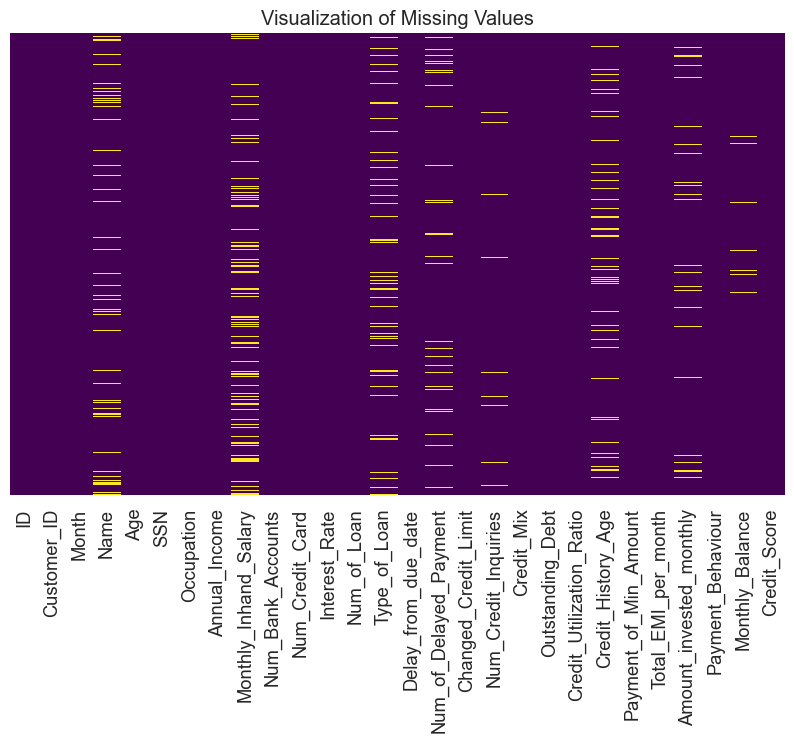

In [11]:
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, yticklabels=False, cmap='viridis')

plt.title('Visualization of Missing Values')
plt.show()

# EDA: Features

In [12]:
def bar_plot(variable, df):
    print(df[variable].value_counts(normalize=True))

    plt.figure(figsize = (18,6))

    ax = sns.countplot(x=df[variable], data=df)
    ax.bar_label(ax.containers[0])
    plt.xticks(rotation=30)

    plt.title(variable)
    plt.ylabel("Frequency")


In [13]:
def plot_hist(variable, df):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))
    sns.histplot(df[variable], color='deepskyblue', fill=True, ax=ax[0], bins=100)
    sns.boxplot(y=df[variable], color='deepskyblue', width=0.6, linewidth=1, ax=ax[1])

    plt.ylabel("Frequency")
    plt.title("{} distribution".format(variable))


In [14]:
def target_bar_plot(variable, df, target=target):
    plt.figure(figsize = (18,6))

    ax = sns.countplot(x=df[variable], data=df, hue=target)
    for container in ax.containers:
        ax.bar_label(container, label_type='edge')
    plt.xticks(rotation=30)

    plt.title(variable)
    plt.ylabel("Frequency")


In [15]:
def target_hist(variable, df, target=target):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))
    sns.histplot(data=df, x=variable, color='dodgerblue', fill=True, ax=ax[0], bins=100, hue=target, palette='colorblind')
    sns.boxplot(data=df, y=variable, color='deepskyblue', width=0.6, linewidth=1, ax=ax[1], hue=target)

    plt.ylabel("Frequency")
    plt.title("{} distribution".format(variable))

In [16]:
def fit_remove_outliers(df_train, column_name, threshold=3):
    df_filtered = df_train.copy()

    col_mean = df_filtered[column_name].mean()
    col_std = df_filtered[column_name].std()

    df_filtered['z_score'] = (df_filtered[column_name] - col_mean) / col_std

    df_filtered = df_filtered[np.abs(df_filtered['z_score']) <= threshold]
    df_filtered = df_filtered.drop(columns=['z_score'])

    return df_filtered, col_mean, col_std

In [17]:
def transform_remove_outliers(df_test, column_name, col_mean, col_std, threshold=3):
    df_filtered = df_test.copy()

    df_filtered['z_score'] = (df_filtered[column_name] - col_mean) / col_std

    df_filtered = df_filtered[np.abs(df_filtered['z_score']) <= threshold]
    df_filtered = df_filtered.drop(columns=['z_score'])

    return df_filtered

## 'ID', 'Customer_ID', 'Name', 'SSN'

In [18]:
df.drop(['ID', 'Customer_ID', 'Name', 'SSN'], axis=1, inplace=True)

In [19]:
df.duplicated().sum()

np.int64(0)

In [20]:
# First split: 80% train+val, 20% test
X = df.drop(target, axis=1)
y = df[target]

X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Second split: 80% train, 20% val (from the 80% we kept)
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=42, stratify=y_temp  # 0.25 of 0.8 = 0.2 of total
)

train_df = X_train.copy()
train_df[target] = y_train

val_df = X_val.copy()
val_df[target] = y_val

test_df = X_test.copy()
test_df[target] = y_test

print(f"Train set size: {len(train_df)} ({len(train_df)/len(df)*100:.1f}%)")
print(f"Val set size: {len(val_df)} ({len(val_df)/len(df)*100:.1f}%)")
print(f"Test set size: {len(test_df)} ({len(test_df)/len(df)*100:.1f}%)")
print(f"\nTrain target distribution:\n{train_df[target].value_counts(normalize=True)}")
print(f"\nVal target distribution:\n{val_df[target].value_counts(normalize=True)}")
print(f"\nTest target distribution:\n{test_df[target].value_counts(normalize=True)}")


Train set size: 60000 (60.0%)
Val set size: 20000 (20.0%)
Test set size: 20000 (20.0%)

Train target distribution:
Credit_Score
Standard    0.531733
Poor        0.289983
Good        0.178283
Name: proportion, dtype: float64

Val target distribution:
Credit_Score
Standard    0.53175
Poor        0.29000
Good        0.17825
Name: proportion, dtype: float64

Test target distribution:
Credit_Score
Standard    0.53175
Poor        0.28995
Good        0.17830
Name: proportion, dtype: float64


## Month

In [21]:
train_df.Month

89385    February
96742        July
97250       March
40519      August
34351      August
           ...   
36412         May
44639      August
42917        June
56594       March
51461        June
Name: Month, Length: 60000, dtype: object

Month
July        0.126317
February    0.125633
June        0.125167
April       0.125150
January     0.125117
March       0.125017
May         0.124083
August      0.123517
Name: proportion, dtype: float64


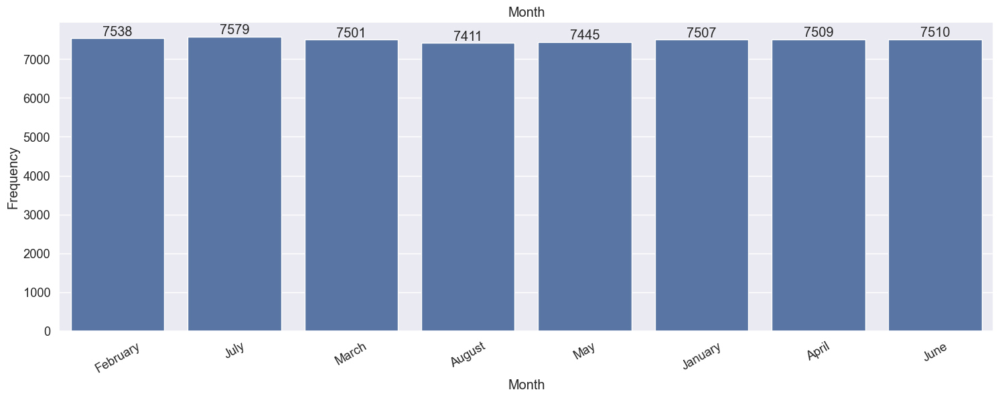

In [22]:
bar_plot("Month", train_df)

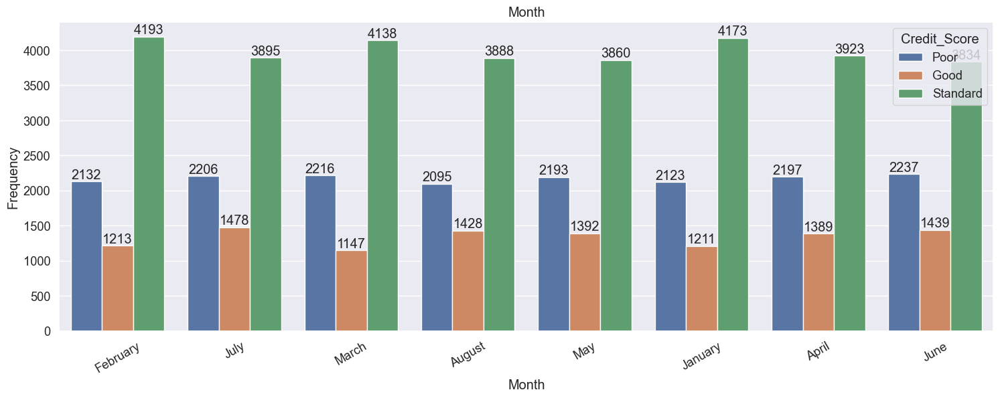

In [23]:
target_bar_plot("Month", train_df)

## Age

In [24]:
train_df.Age.unique()

array(['14', '44', '21_', ..., '2313', '3337', '2812_'],
      shape=(1183,), dtype=object)

In [25]:
def convert_age(age):
    try:
        return int(age.replace('_', '').strip())
    except:
        return np.nan

In [26]:
# Apply Age transformation to all splits
train_df.Age = train_df.Age.apply(convert_age)
val_df.Age = val_df.Age.apply(convert_age)
test_df.Age = test_df.Age.apply(convert_age)

In [27]:
train_df.Age.unique()

array([  14,   44,   21, ..., 2313, 3337, 2812], shape=(1132,))

In [28]:
train_df.Age.describe()

count    60000.000000
mean       113.335600
std        700.617331
min       -500.000000
25%         24.000000
50%         33.000000
75%         42.000000
max       8697.000000
Name: Age, dtype: float64

In [29]:
train_df[(train_df.Age >= 0) & (train_df.Age <= 130)].Age.describe()

count    58304.000000
mean        33.347403
std         10.830543
min         14.000000
25%         24.000000
50%         33.000000
75%         42.000000
max        126.000000
Name: Age, dtype: float64

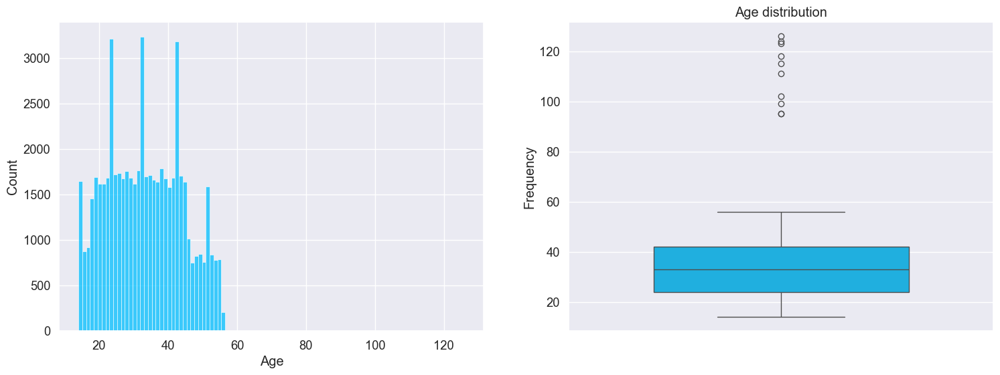

In [30]:
plot_hist("Age", train_df[(train_df.Age >= 0) & (train_df.Age <= 130)])

In [31]:
# Apply filtering and outlier removal to all splits
train_df, col_mean, col_std = fit_remove_outliers(train_df[(train_df.Age >= 0) & (train_df.Age <= 130)], "Age", 3)

val_df = transform_remove_outliers(val_df[(val_df.Age >= 0) & (val_df.Age <= 130)], "Age", 3, col_mean, col_std)
test_df = transform_remove_outliers(test_df[(test_df.Age >= 0) & (test_df.Age <= 130)], "Age", 3, col_mean, col_std)

In [32]:
train_df.Age.describe()

count    58294.000000
mean        33.334117
std         10.782789
min         14.000000
25%         24.000000
50%         33.000000
75%         42.000000
max         56.000000
Name: Age, dtype: float64

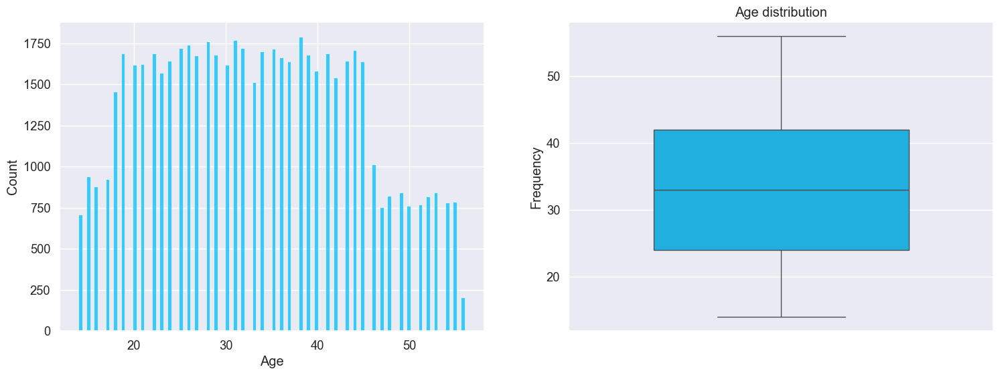

In [33]:
plot_hist("Age", train_df)

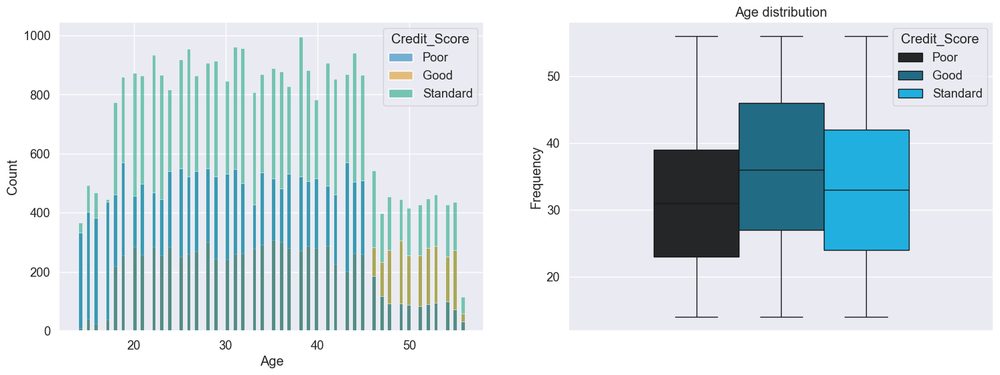

In [34]:
target_hist("Age", train_df)

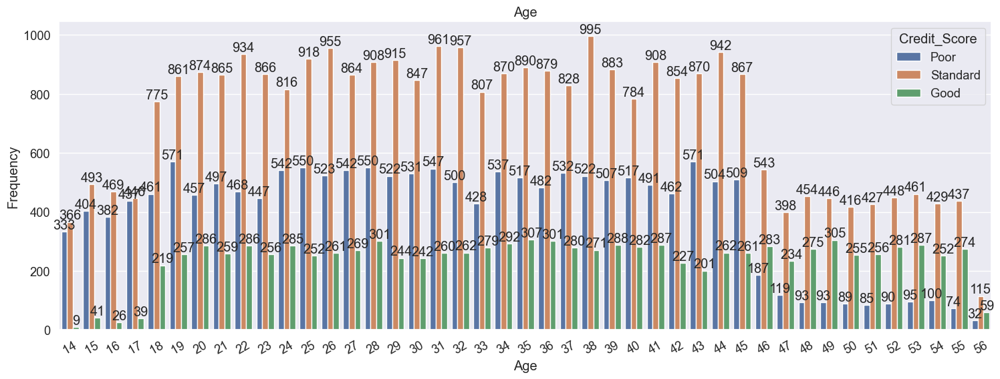

In [35]:
target_bar_plot("Age", train_df)

In [36]:
df_temp = train_df.copy()

In [37]:
df_temp["Good_or_Standard"] = df_temp.Credit_Score.apply(lambda x: x != "Poor")

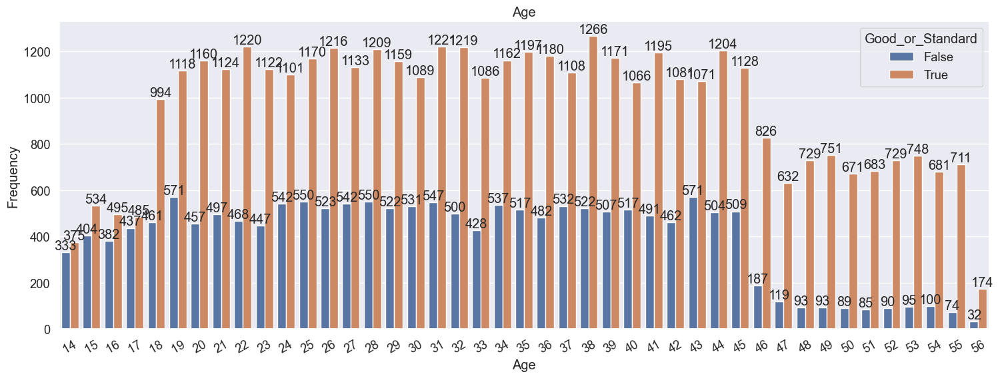

In [38]:
target_bar_plot("Age", df_temp, "Good_or_Standard")

## Occupation

In [39]:
train_df.Occupation.unique()

array(['Entrepreneur', 'Lawyer', 'Scientist', 'Doctor', 'Engineer',
       'Teacher', 'Architect', '_______', 'Developer', 'Manager',
       'Musician', 'Mechanic', 'Journalist', 'Writer', 'Media_Manager',
       'Accountant'], dtype=object)

Occupation
_______          0.072495
Lawyer           0.065890
Mechanic         0.064106
Architect        0.063969
Engineer         0.063746
Teacher          0.062648
Media_Manager    0.062082
Scientist        0.062065
Accountant       0.061790
Developer        0.061790
Journalist       0.061379
Entrepreneur     0.060761
Doctor           0.060384
Manager          0.059200
Writer           0.059148
Musician         0.058548
Name: proportion, dtype: float64


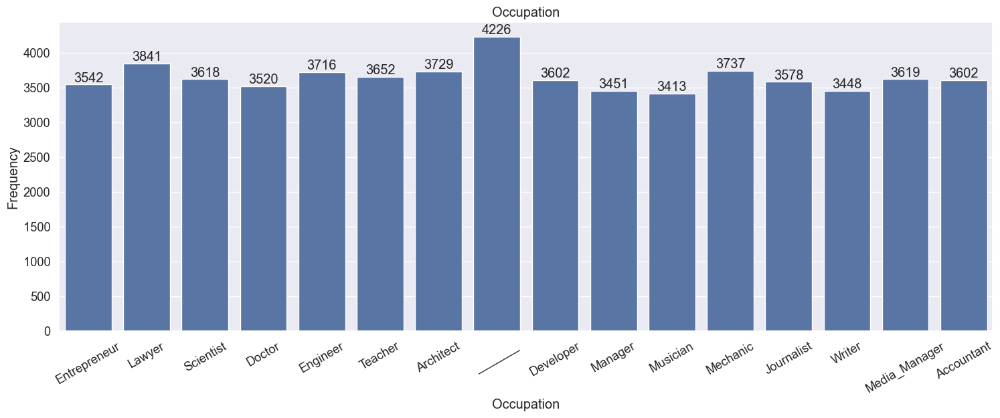

In [40]:
bar_plot("Occupation", train_df)

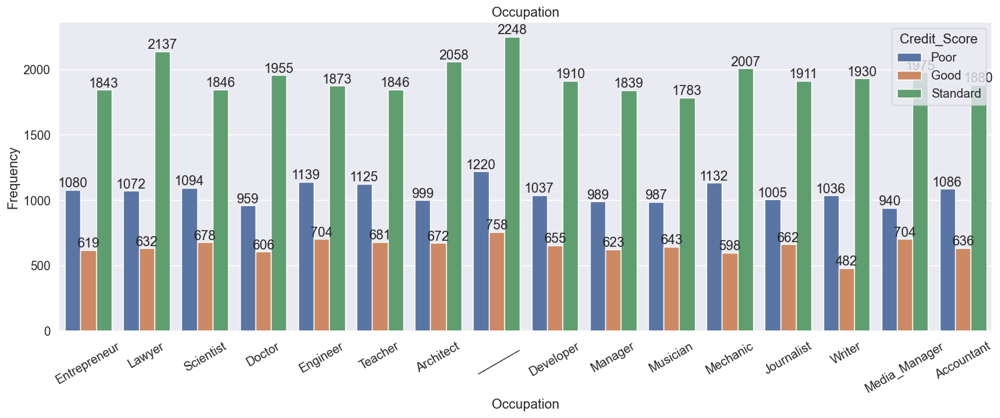

In [41]:
target_bar_plot("Occupation", train_df)

## Annual_Income

In [42]:
def convert_annual_income(annual_income):
    try:
        return annual_income.replace('_', '').strip()
    except:
        return np.nan

In [43]:
# Apply Annual_Income transformation to all splits
train_df.Annual_Income = train_df.Annual_Income.apply(convert_annual_income).astype("float")
val_df.Annual_Income = val_df.Annual_Income.apply(convert_annual_income).astype("float")
test_df.Annual_Income = test_df.Annual_Income.apply(convert_annual_income).astype("float")

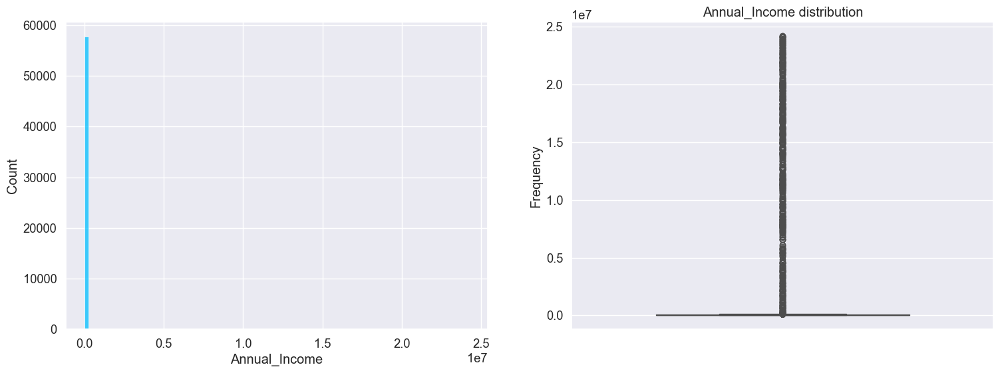

In [44]:
plot_hist("Annual_Income", train_df)

In [45]:
# Apply log transformation to all splits
train_df['Annual_Income_log'] = np.log1p(train_df.Annual_Income)
val_df['Annual_Income_log'] = np.log1p(val_df.Annual_Income)
test_df['Annual_Income_log'] = np.log1p(test_df.Annual_Income)

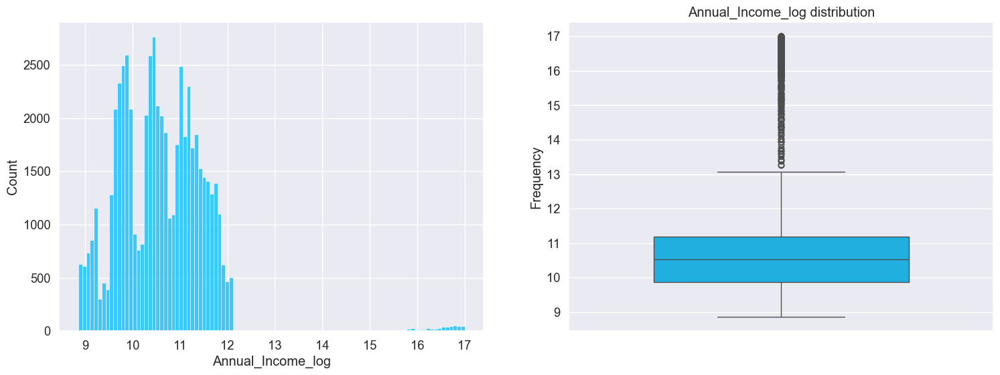

In [46]:
plot_hist("Annual_Income_log", train_df)

In [47]:
# Calculate 99th percentile on train set only
p_99 = train_df['Annual_Income_log'].quantile(0.99)
print(f"percentile: {p_99}")

percentile: 12.526030895747336


In [48]:
# Apply clipping to all splits using train set percentile
train_df['Annual_Income_log'] = train_df['Annual_Income_log'].clip(upper=p_99)
val_df['Annual_Income_log'] = val_df['Annual_Income_log'].clip(upper=p_99)
test_df['Annual_Income_log'] = test_df['Annual_Income_log'].clip(upper=p_99)

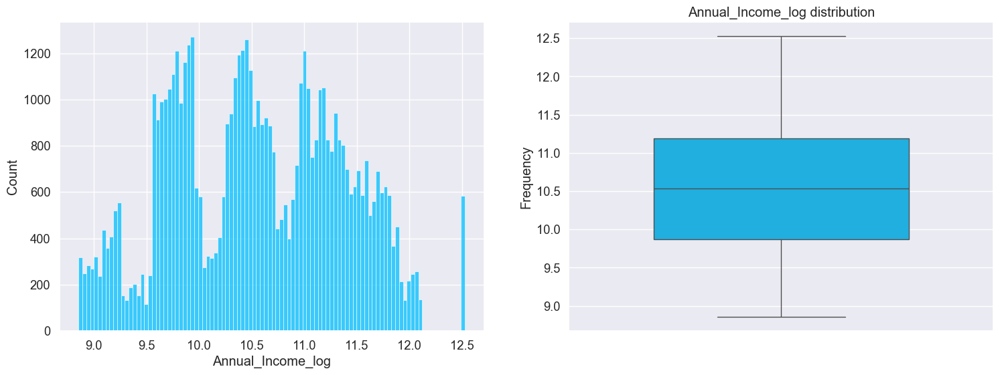

In [49]:
plot_hist("Annual_Income_log", train_df)

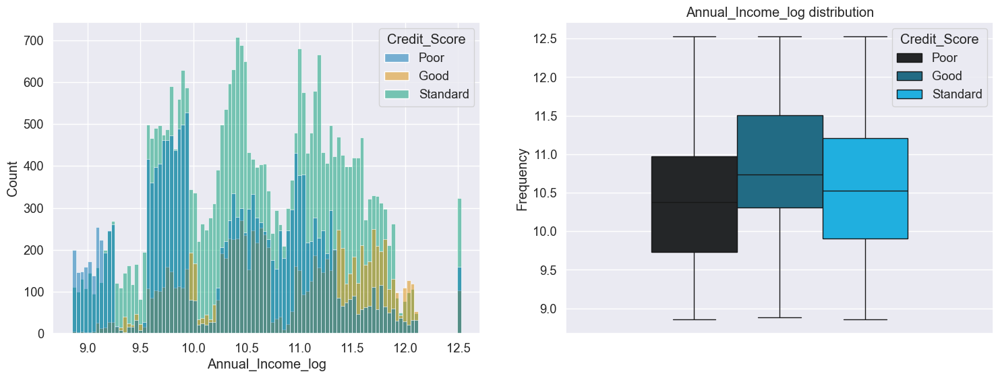

In [50]:
target_hist("Annual_Income_log", train_df)

In [51]:
# Drop Annual_Income from all splits
train_df = train_df.drop('Annual_Income', axis=1)
val_df = val_df.drop('Annual_Income', axis=1)
test_df = test_df.drop('Annual_Income', axis=1)

## Monthly_Inhand_Salary

In [52]:
train_df.Monthly_Inhand_Salary

89385     3473.685000
96742             NaN
97250     3142.505000
40519     2796.533333
34351     1591.418333
             ...     
36412     3602.763333
44639     1378.364167
42917     1399.525006
56594     5046.453333
51461    10373.013333
Name: Monthly_Inhand_Salary, Length: 58294, dtype: float64

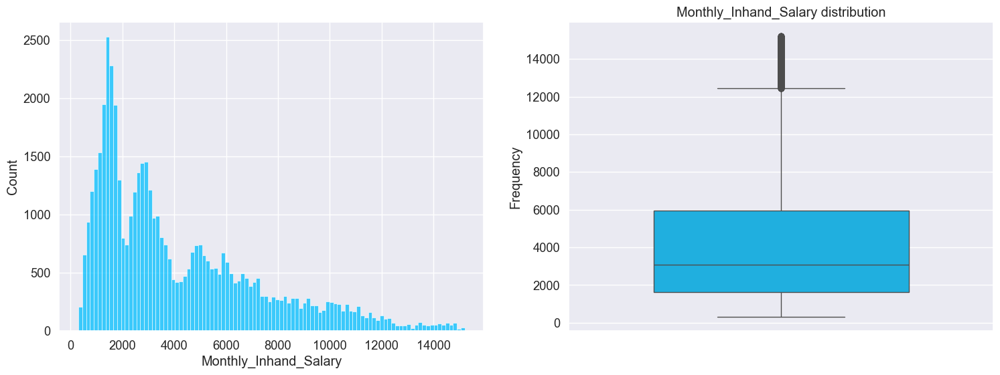

In [53]:
plot_hist('Monthly_Inhand_Salary', train_df)

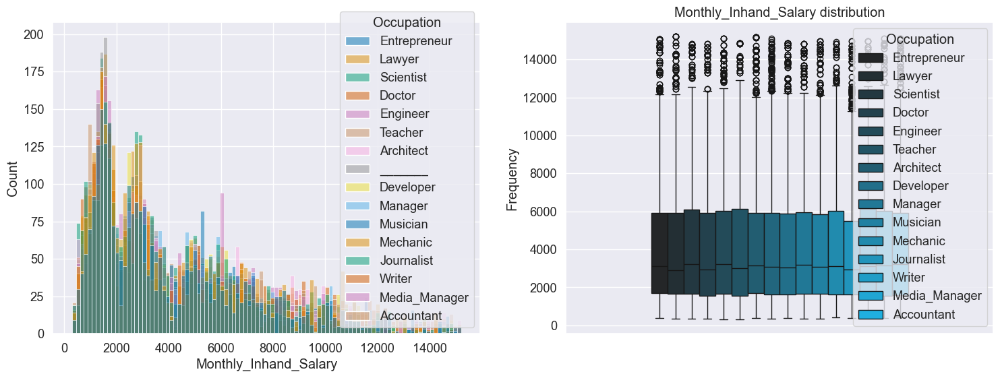

In [54]:
target_hist('Monthly_Inhand_Salary', train_df, "Occupation")

In [55]:
train_df.Monthly_Inhand_Salary.isna().sum()

np.int64(8725)

In [56]:
# Calculate median grouped by Occupation on train set only
occupation_medians = train_df.groupby('Occupation')['Monthly_Inhand_Salary'].median()

# Apply to train, val, and test sets
train_df['Monthly_Inhand_Salary'] = train_df['Monthly_Inhand_Salary'].fillna(
    train_df['Occupation'].map(occupation_medians)
)
val_df['Monthly_Inhand_Salary'] = val_df['Monthly_Inhand_Salary'].fillna(
    val_df['Occupation'].map(occupation_medians)
)
test_df['Monthly_Inhand_Salary'] = test_df['Monthly_Inhand_Salary'].fillna(
    test_df['Occupation'].map(occupation_medians)
)

# If any Occupation is missing from train set, use global median from train set
global_median = train_df['Monthly_Inhand_Salary'].median()
train_df['Monthly_Inhand_Salary'] = train_df['Monthly_Inhand_Salary'].fillna(global_median)
val_df['Monthly_Inhand_Salary'] = val_df['Monthly_Inhand_Salary'].fillna(global_median)
test_df['Monthly_Inhand_Salary'] = test_df['Monthly_Inhand_Salary'].fillna(global_median)

## Num_Bank_Accounts

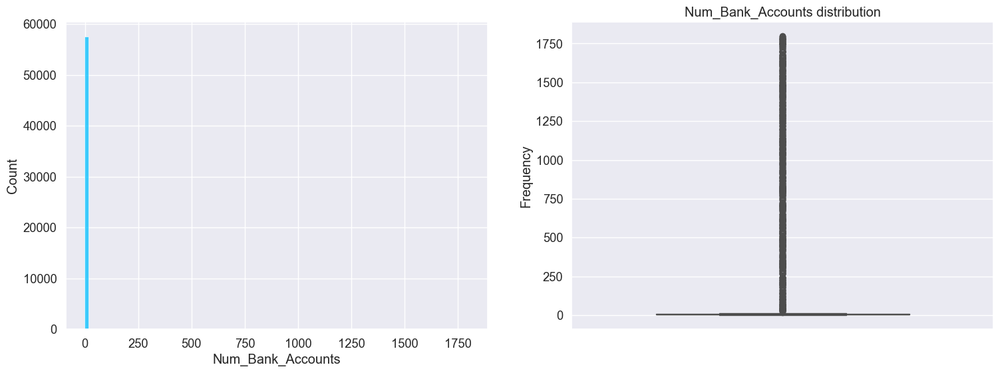

In [57]:
plot_hist('Num_Bank_Accounts', train_df)

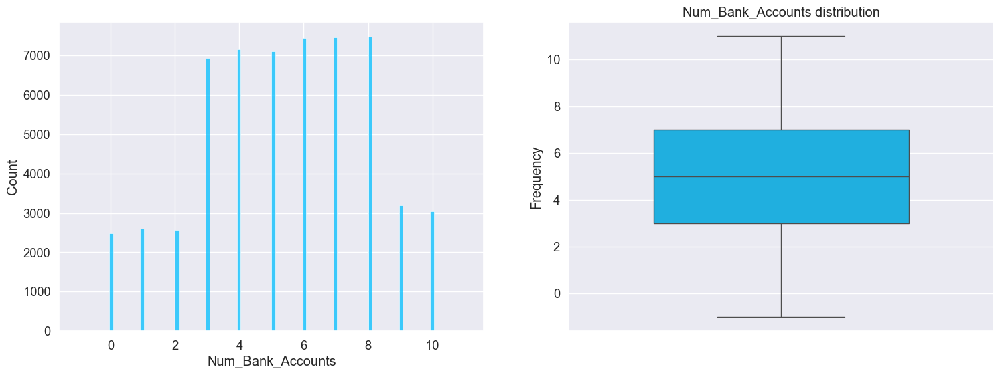

In [58]:
plot_hist('Num_Bank_Accounts', train_df[train_df.Num_Bank_Accounts < 15])

In [59]:
bins = [-np.inf, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, np.inf]

In [60]:
labels = [
    '0_accounts',
    '1_account',
    '2_accounts',
    '3_accounts',
    '4_accounts',
    '5_accounts',
    '6_accounts',
    '7_accounts',
    '8_accounts',
    '9_accounts',
    '10_accounts',
    '11+_accounts'
]

In [61]:
# Apply binning to all splits
train_df['Num_Bank_Accounts_Bin'] = pd.cut(
    train_df['Num_Bank_Accounts'],
    bins=bins,
    labels=labels,
    right=True
)
val_df['Num_Bank_Accounts_Bin'] = pd.cut(
    val_df['Num_Bank_Accounts'],
    bins=bins,
    labels=labels,
    right=True
)
test_df['Num_Bank_Accounts_Bin'] = pd.cut(
    test_df['Num_Bank_Accounts'],
    bins=bins,
    labels=labels,
    right=True
)

Num_Bank_Accounts_Bin
8_accounts      0.128195
7_accounts      0.128058
6_accounts      0.127749
4_accounts      0.122860
5_accounts      0.121951
3_accounts      0.119035
9_accounts      0.054791
10_accounts     0.052287
1_account       0.044516
2_accounts      0.043950
0_accounts      0.042852
11+_accounts    0.013758
Name: proportion, dtype: float64


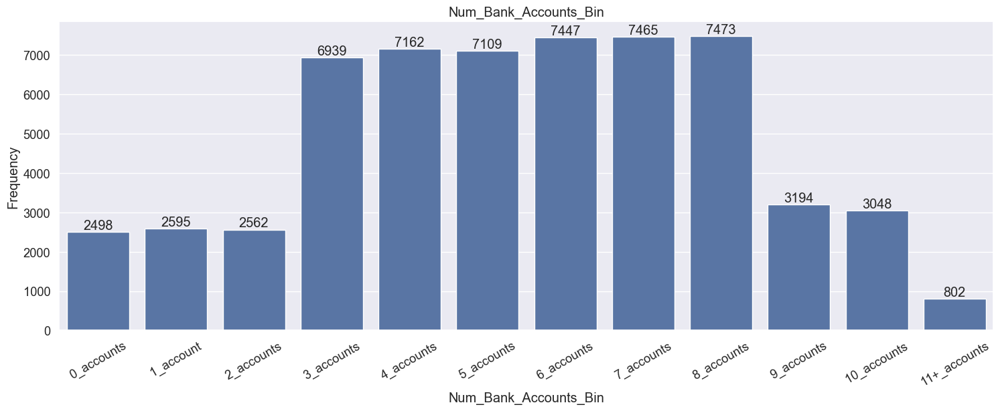

In [62]:
bar_plot("Num_Bank_Accounts_Bin", train_df)

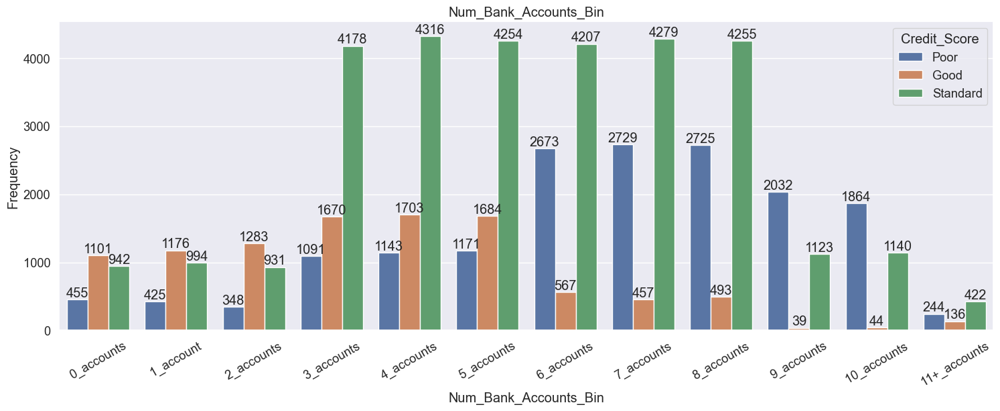

In [63]:
target_bar_plot("Num_Bank_Accounts_Bin", train_df)

In [64]:
# Drop Num_Bank_Accounts from all splits
train_df = train_df.drop("Num_Bank_Accounts", axis=1)
val_df = val_df.drop("Num_Bank_Accounts", axis=1)
test_df = test_df.drop("Num_Bank_Accounts", axis=1)

## Num_Credit_Card

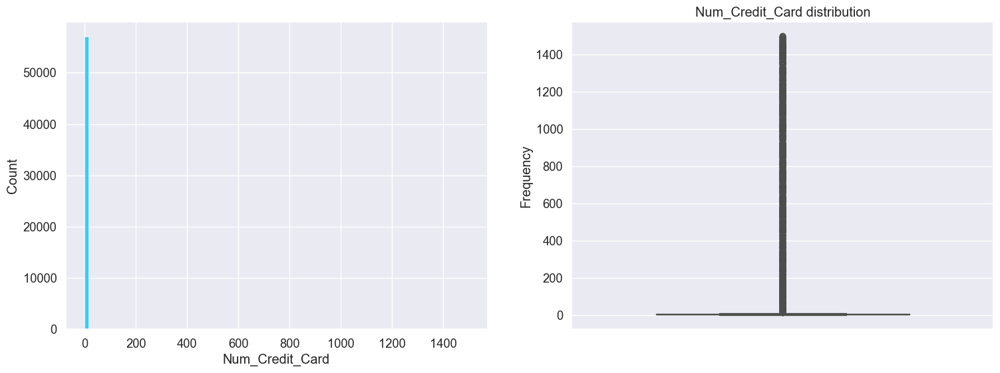

In [65]:
plot_hist("Num_Credit_Card", train_df)

In [66]:
train_df.Num_Credit_Card.unique()

array([   8,    1,   10,    5,    3,    6,    4,    7,    9,    2, 1103,
         11,  511,  792,   97,  538,  563, 1346,  462,  902,  201,  298,
        472,  757,  104,  533,  182,  509, 1097,  558,  980,  799, 1043,
        328, 1116,  233,  170, 1321,  619,  372,  913,   67,  859,  294,
       1072,   73, 1311,  988, 1178, 1136, 1046,  421, 1479,  363,  512,
        891,  288,  889,  446, 1055, 1007, 1385, 1490,  458, 1108, 1168,
        849,  180,  238, 1156,   29, 1391,  856,  126, 1357,  323, 1289,
        218, 1238, 1181,  433,  731, 1171, 1084,  982,  160,  689,   15,
       1087, 1399, 1305,  331,  345, 1439, 1440,   49, 1328,  953,  611,
        985,   82, 1207, 1237,  445,  176,  132,  120,   54,  184,  102,
       1080, 1112,  957,  251, 1223,  826,   87,  105, 1242,  106,  539,
       1201,  451, 1022, 1374,  929, 1287, 1291,  531, 1407, 1216,  536,
        807,  868,  344,  209, 1444,  798,  399, 1000,  667,  213, 1015,
        195,   96,  637, 1459,  263,  602,  177,  5

In [67]:
train_df.Num_Credit_Card.describe()

count    58294.000000
mean        22.115449
std        127.976285
min          0.000000
25%          4.000000
50%          5.000000
75%          7.000000
max       1498.000000
Name: Num_Credit_Card, dtype: float64

In [68]:
print(train_df[train_df.Num_Credit_Card < 50].Num_Credit_Card.value_counts())

Num_Credit_Card
5     10702
7      9734
6      9660
4      8161
3      7796
8      2903
10     2836
9      2656
2      1275
1      1251
11       24
0         7
25        4
43        3
28        3
15        2
48        2
36        2
37        2
29        1
49        1
41        1
22        1
39        1
33        1
21        1
27        1
26        1
34        1
44        1
35        1
16        1
20        1
Name: count, dtype: int64


In [69]:
bins = [-np.inf, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, np.inf]

In [70]:
labels = [
    '0_cards',
    "1_card",
    '2_cards',
    '3_cards',
    '4_cards',
    '5_cards',
    '6_cards',
    '7_cards',
    '8_cards',
    '9_cards',
    '10_cards',
    '11+_cards'
]

In [71]:
# Apply binning to all splits
train_df['Num_Credit_Card_Bin'] = pd.cut(
    train_df['Num_Credit_Card'],
    bins=bins,
    labels=labels,
    right=True
)
val_df['Num_Credit_Card_Bin'] = pd.cut(
    val_df['Num_Credit_Card'],
    bins=bins,
    labels=labels,
    right=True
)
test_df['Num_Credit_Card_Bin'] = pd.cut(
    test_df['Num_Credit_Card'],
    bins=bins,
    labels=labels,
    right=True
)

Num_Credit_Card_Bin
5_cards      0.183587
7_cards      0.166981
6_cards      0.165712
4_cards      0.139997
3_cards      0.133736
8_cards      0.049799
10_cards     0.048650
9_cards      0.045562
11+_cards    0.022524
2_cards      0.021872
1_card       0.021460
0_cards      0.000120
Name: proportion, dtype: float64


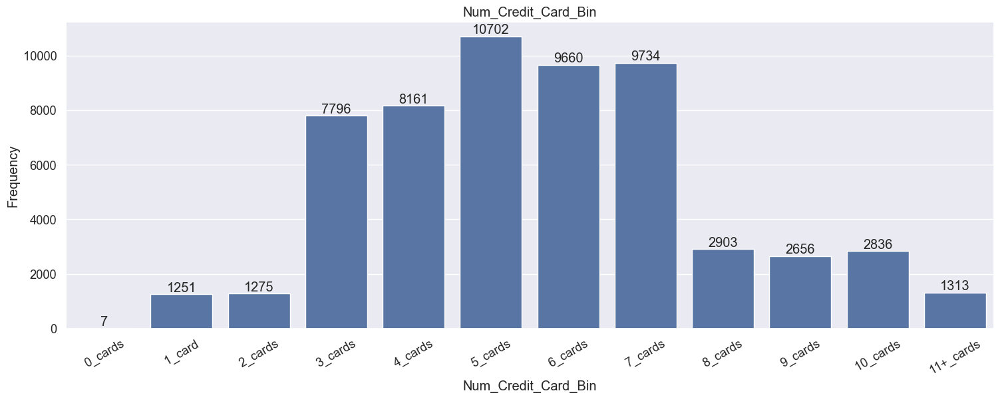

In [72]:
bar_plot("Num_Credit_Card_Bin", train_df)

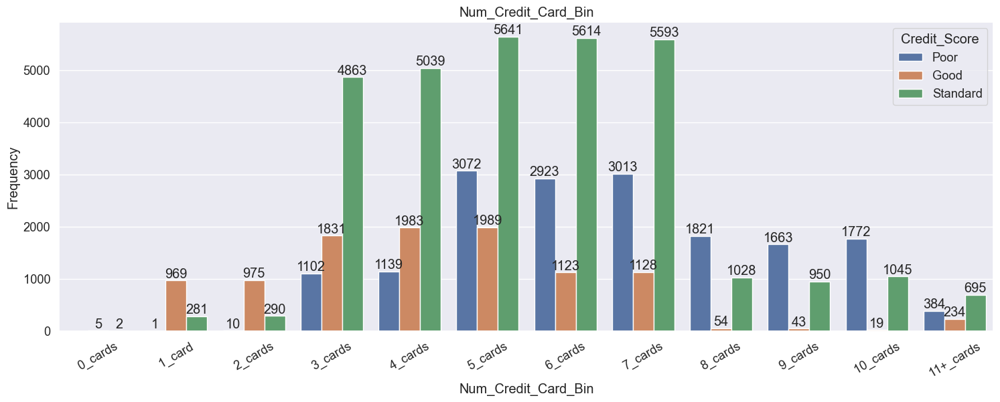

In [73]:
target_bar_plot("Num_Credit_Card_Bin", train_df)

In [74]:
# Drop Num_Credit_Card from all splits
train_df = train_df.drop("Num_Credit_Card", axis=1)
val_df = val_df.drop("Num_Credit_Card", axis=1)
test_df = test_df.drop("Num_Credit_Card", axis=1)

## Interest_Rate

In [75]:
train_df.Interest_Rate.unique()

array([   5,   10,   29, ..., 1165, 1319, 2060], shape=(1092,))

In [76]:
train_df.Interest_Rate.value_counts()

Interest_Rate
8       2969
5       2891
6       2760
12      2642
9       2634
        ... 
5532       1
2937       1
5199       1
732        1
2189       1
Name: count, Length: 1092, dtype: int64

In [77]:
train_df[train_df.Interest_Rate > 50].count()

Month                       1178
Age                         1178
Occupation                  1178
Monthly_Inhand_Salary       1178
Interest_Rate               1178
Num_of_Loan                 1178
Type_of_Loan                1054
Delay_from_due_date         1178
Num_of_Delayed_Payment      1107
Changed_Credit_Limit        1178
Num_Credit_Inquiries        1159
Credit_Mix                  1178
Outstanding_Debt            1178
Credit_Utilization_Ratio    1178
Credit_History_Age          1072
Payment_of_Min_Amount       1178
Total_EMI_per_month         1178
Amount_invested_monthly     1119
Payment_Behaviour           1178
Monthly_Balance             1165
Credit_Score                1178
Annual_Income_log           1178
Num_Bank_Accounts_Bin       1178
Num_Credit_Card_Bin         1178
dtype: int64

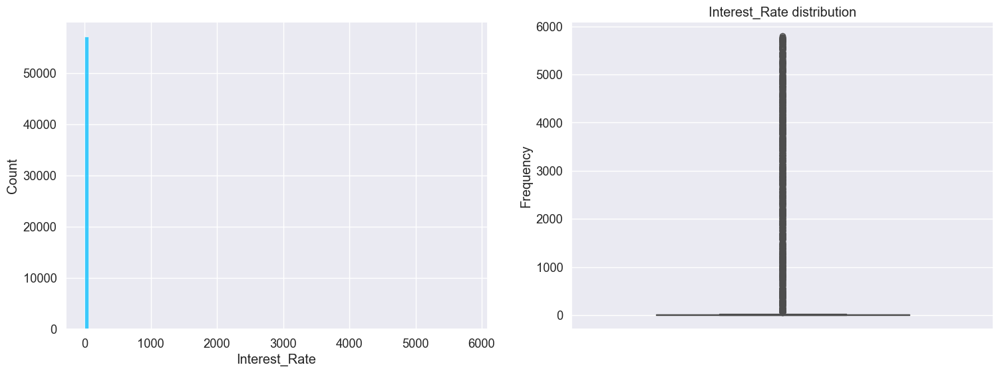

In [78]:
plot_hist("Interest_Rate", train_df)

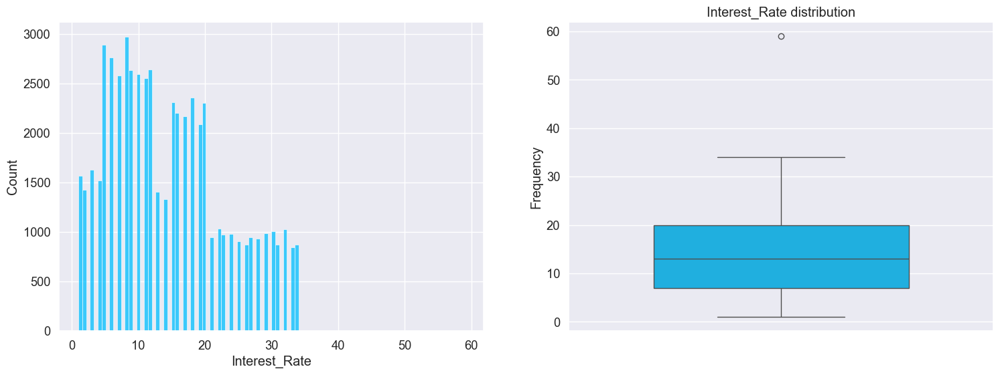

In [79]:
plot_hist("Interest_Rate", train_df[train_df.Interest_Rate < 60])

In [80]:
# Apply log transformation to all splits
train_df['Interest_Rate_log'] = np.log1p(train_df.Interest_Rate)
val_df['Interest_Rate_log'] = np.log1p(val_df.Interest_Rate)
test_df['Interest_Rate_log'] = np.log1p(test_df.Interest_Rate)

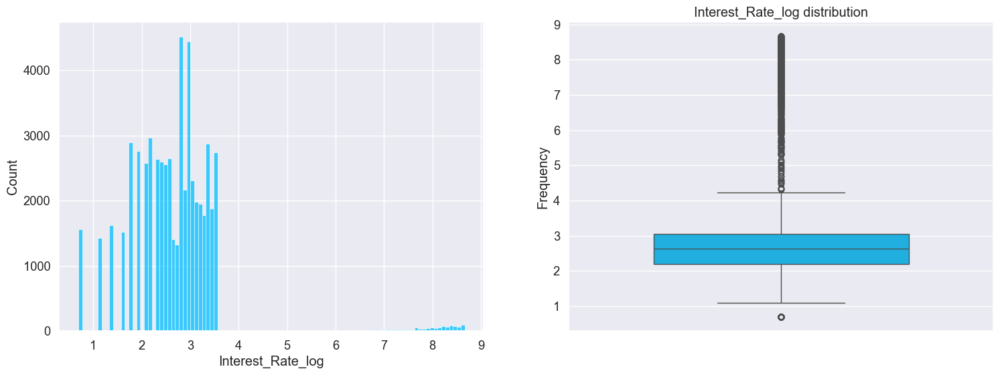

In [81]:
plot_hist("Interest_Rate_log", train_df)

In [82]:
# Calculate 97th percentile on train set only
p_97 = train_df['Interest_Rate_log'].quantile(0.97)
print(f"percentile: {p_97}")

percentile: 3.5553480614894135


In [83]:
# Apply clipping to all splits
train_df['Interest_Rate_log'] = train_df['Interest_Rate_log'].clip(upper=4)
val_df['Interest_Rate_log'] = val_df['Interest_Rate_log'].clip(upper=4)
test_df['Interest_Rate_log'] = test_df['Interest_Rate_log'].clip(upper=4)

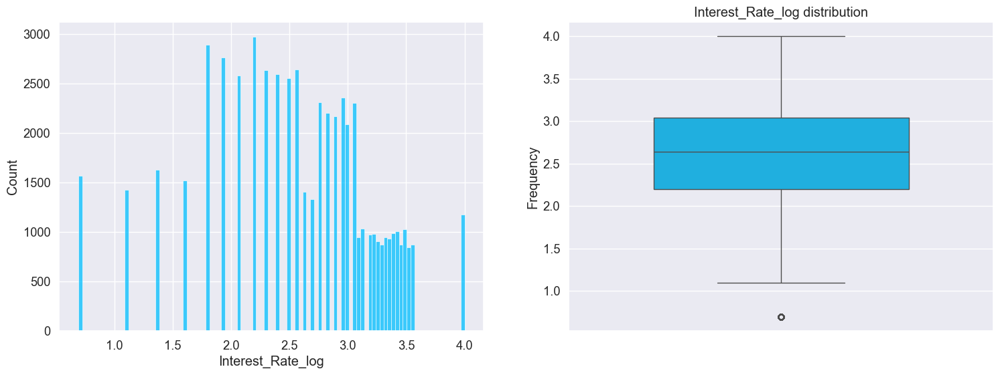

In [84]:
plot_hist("Interest_Rate_log", train_df)

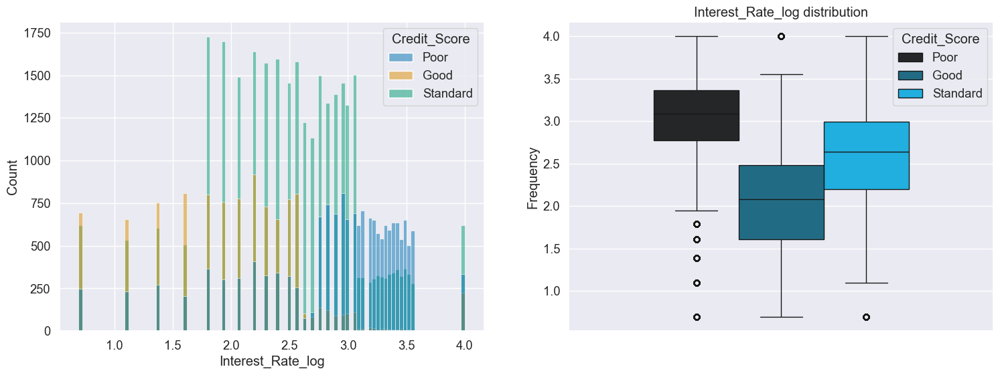

In [85]:
target_hist("Interest_Rate_log", train_df)

In [86]:
# Drop Interest_Rate from all splits
train_df = train_df.drop('Interest_Rate', axis=1)
val_df = val_df.drop('Interest_Rate', axis=1)
test_df = test_df.drop('Interest_Rate', axis=1)

## Num_of_Loan

In [87]:
def convert_num_of_loan(num_of_loan):
    try:
        return int(num_of_loan.replace('_', '').strip())
    except:
        return np.nan

In [88]:
# Apply Num_of_Loan transformation to all splits
train_df.Num_of_Loan = train_df.Num_of_Loan.apply(convert_num_of_loan)
val_df.Num_of_Loan = val_df.Num_of_Loan.apply(convert_num_of_loan)
test_df.Num_of_Loan = test_df.Num_of_Loan.apply(convert_num_of_loan)

In [89]:
train_df.Num_of_Loan.unique()

array([   3,    4,    5,    6,    7,    9,    2,    1, -100,    8,    0,
       1015,  628,  350, 1461,  936, 1182, 1447, 1463,  686,  387, 1127,
        590,  538,  365,  629, 1406,  313, 1036,  581,  238, 1298,  657,
        606, 1345,  733,  172,  186,  955, 1465, 1236,   33, 1070,  881,
        447, 1365, 1027,  926, 1482,  300,  841,  529,  466, 1296, 1470,
         50,  860,  653, 1202,  288,  282,   89,  492,  103,  728, 1496,
        891, 1040, 1484, 1384,  323,  497,  146, 1289,  284,  515,  235,
         49,  848,  292, 1391, 1209, 1228, 1257,  192,  574,  242, 1319,
       1017,  701, 1074,  621,  416,  430,  507,   78,  931,  898, 1088,
        940,  290,  148,  123,  280,  332,  579,   87, 1464,  996,  359,
         52, 1419, 1259,   83,  215, 1154,  217,  504, 1046,  562,  341,
        404,   31,  464, 1196,  785,   58, 1318, 1135, 1348, 1353, 1313,
       1416, 1085, 1189, 1444,  855,  208,  630,  802,  449,  153,  228,
        819, 1019, 1210,  164, 1035, 1014,  911,  1

In [90]:
train_df[train_df.Num_of_Loan==-100]

,Month,Age,Occupation,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Annual_Income_log,Num_Bank_Accounts_Bin,Num_Credit_Card_Bin,Interest_Rate_log
85723,April,18,Journalist,5046.010000,-100,NaN,16,19,11.2,0.0,Standard,1075.84,31.631351,33 Years and 4 Months,No,0.000000,249.12443966744087,Low_spent_Small_value_payments,545.4765603325592,Standard,10.971041,6_accounts,7_cards,1.791759
27220,May,26,Media_Manager,6091.607500,-100,"Personal Loan, Student Loan, Mortgage Loan, Au...",13,19,12.81,9.0,Standard,686.85,31.892619,19 Years and 3 Months,Yes,268.672953,155.34379031071694,High_spent_Large_value_payments,425.1440066677903,Standard,11.158709,3_accounts,7_cards,2.639057
33998,July,24,Scientist,589.001250,-100,"Personal Loan, Mortgage Loan, Not Specified, A...",11,18,12.24,9.0,_,1276.4,37.390042,20 Years and 3 Months,Yes,17.852927,21.371508515379624,High_spent_Small_value_payments,279.6756895323956,Poor,8.927581,4_accounts,6_cards,3.258097
53051,April,36,Lawyer,3525.993333,-100,"Payday Loan, Not Specified, Home Equity Loan, ...",59,24,4.01,11.0,Bad,1831.87,26.979535,15 Years and 6 Months,NM,131.528154,NaN,Low_spent_Medium_value_payments,207.74895498626,Poor,10.618517,6_accounts,11+_cards,2.772589
89747,April,55,Journalist,1049.834167,-100,NaN,13,6,2.32,3.0,Good,1173.38,25.635408,31 Years and 11 Months,No,0.000000,97.62089546016074,Low_spent_Large_value_payments,277.362521206506,Poor,9.672501,1_account,3_cards,1.791759
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73452,May,18,Architect,1462.832500,-100,"Student Loan, Not Specified, Not Specified, Pa...",17,13,12.97,12.0,Standard,2500.42,34.898156,17 Years and 11 Months,NM,52.129422,__10000__,Low_spent_Medium_value_payments,313.26794371743284,Standard,9.597980,10_accounts,8_cards,3.367296
50429,June,28,Lawyer,945.202083,-100,Student Loan,5,16,6.98,5.0,Standard,1154.58,23.078979,18 Years and 0 Months,Yes,8.996502,39.802496779023365,High_spent_Medium_value_payments,295.7212092148039,Standard,9.363527,3_accounts,4_cards,2.197225
45122,March,31,Accountant,2213.068333,-100,"Not Specified, Credit-Builder Loan, Payday Loa...",10,12,15.4,12.0,Standard,1395.17,26.084195,5 Years and 9 Months,Yes,80.477692,61.030841404679975,High_spent_Medium_value_payments,329.79830028664287,Poor,10.309013,8_accounts,7_cards,3.496508
33052,May,35,Developer,4619.370000,-100,"Not Specified, Payday Loan, Personal Loan, Not...",57,19,28.23,16.0,Bad,3334.81,32.420546,5 Years and 11 Months,NM,204.304865,267.1913674190569,Low_spent_Medium_value_payments,270.44076725511485,Poor,10.971528,9_accounts,8_cards,3.465736


In [91]:
def count_loans(loan_string):
    try:
      return loan_string.lower().count("loan") + loan_string.lower().count("not specified")
    except:
        return 0

In [92]:
# Fix Num_of_Loan == -100 for all splits
for split_df in [train_df, val_df, test_df]:
    mask = (split_df['Num_of_Loan'] == -100)
    new_values = split_df.loc[mask, 'Type_of_Loan'].apply(count_loans)
    split_df.loc[mask, 'Num_of_Loan'] = new_values

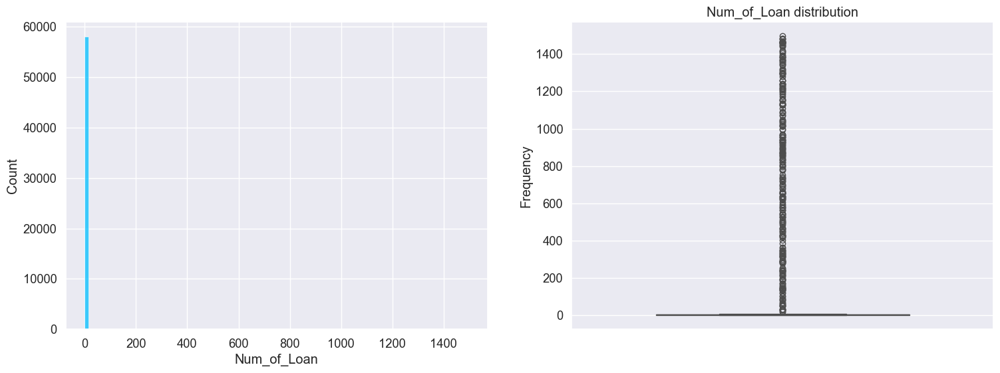

In [93]:
plot_hist("Num_of_Loan", train_df)

In [94]:
bins = [-np.inf, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, np.inf]

In [95]:
labels = [
    '0_loans',
    '1_loan',
    '2_loans',
    '3_loans',
    '4_loans',
    '5_loans',
    '6_loans',
    '7_loans',
    '8_loans',
    '9_loans',
    '10+_loans'
]

In [96]:
# Apply binning to all splits
train_df['Num_of_Loan_Bin'] = pd.cut(
    train_df['Num_of_Loan'],
    bins=bins,
    labels=labels,
    right=True
)
val_df['Num_of_Loan_Bin'] = pd.cut(
    val_df['Num_of_Loan'],
    bins=bins,
    labels=labels,
    right=True
)
test_df['Num_of_Loan_Bin'] = pd.cut(
    test_df['Num_of_Loan'],
    bins=bins,
    labels=labels,
    right=True
)

Num_of_Loan_Bin
2_loans      0.157066
3_loans      0.156860
4_loans      0.152743
0_loans      0.113322
1_loan       0.110835
6_loans      0.080969
7_loans      0.076646
5_loans      0.075068
9_loans      0.038443
8_loans      0.033177
10+_loans    0.004872
Name: proportion, dtype: float64


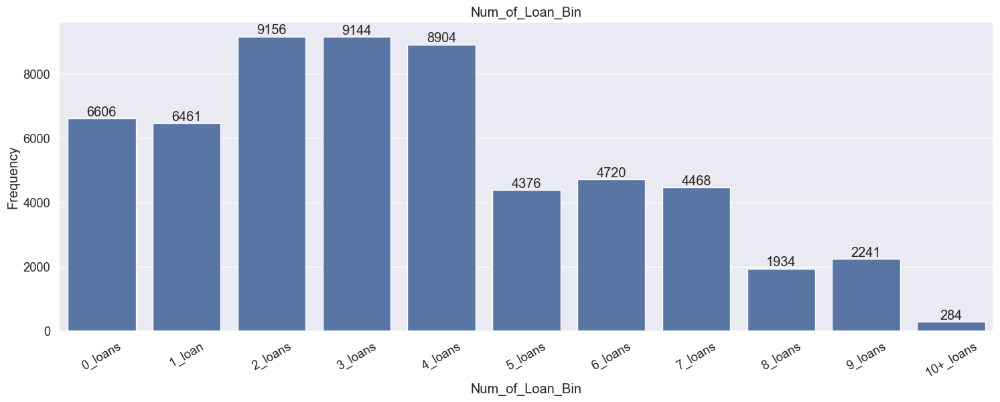

In [97]:
bar_plot("Num_of_Loan_Bin", train_df)

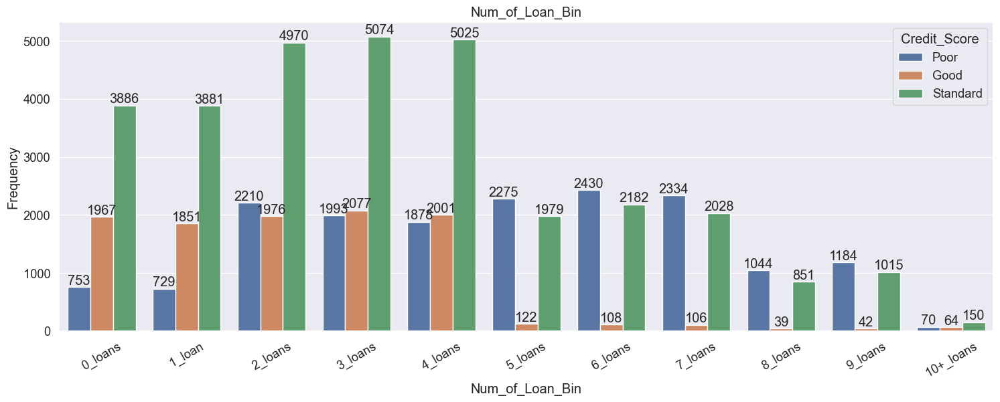

In [98]:
target_bar_plot("Num_of_Loan_Bin", train_df)

In [99]:
train_df = train_df.drop('Num_of_Loan_Bin', axis=1)
val_df = val_df.drop('Num_of_Loan_Bin', axis=1)
test_df = test_df.drop('Num_of_Loan_Bin', axis=1)

## Type_of_Loan

In [100]:
train_df.Type_of_Loan.unique()

array(['Payday Loan, Home Equity Loan, and Student Loan',
       'Personal Loan, Debt Consolidation Loan, Not Specified, and Student Loan',
       'Auto Loan, Home Equity Loan, Home Equity Loan, Student Loan, and Payday Loan',
       ...,
       'Payday Loan, Home Equity Loan, Debt Consolidation Loan, Auto Loan, Home Equity Loan, and Mortgage Loan',
       'Personal Loan, Auto Loan, Student Loan, Debt Consolidation Loan, and Debt Consolidation Loan',
       'Debt Consolidation Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan, Auto Loan, Credit-Builder Loan, Personal Loan, Payday Loan, and Payday Loan'],
      shape=(6253,), dtype=object)

In [101]:
all_loans_series = df['Type_of_Loan'].fillna('').str.lower().str.split(', |and ').explode()

all_loans_series = all_loans_series.str.strip()

all_loans_series = all_loans_series[all_loans_series != '']

In [102]:
all_loans_series.value_counts()

Type_of_Loan
payday loan                40568
credit-builder loan        40440
not specified              39616
home equity loan           39104
student loan               38968
mortgage loan              38936
personal loan              38888
debt consolidation loan    38776
auto loan                  37992
Name: count, dtype: int64

In [103]:
loan_types = [
    'payday loan',
    'credit-builder loan',
    'not specified',
    'home equity loan',
    'student loan',
    'mortgage loan',
    'personal loan',
    'debt consolidation loan',
    'auto loan'
]

In [104]:
# Apply Type_of_Loan transformation to all splits
train_df['Type_of_Loan'] = train_df['Type_of_Loan'].fillna('').str.lower()
val_df['Type_of_Loan'] = val_df['Type_of_Loan'].fillna('').str.lower()
test_df['Type_of_Loan'] = test_df['Type_of_Loan'].fillna('').str.lower()

In [105]:
# Create one-hot encoding columns for all splits
loan_columns = []
for loan_type in loan_types:
    new_col_name = f'has_{loan_type.replace(" ", "_").replace("-", "_")}'
    loan_columns.append(new_col_name)
    train_df[new_col_name] = train_df['Type_of_Loan'].str.contains(loan_type, case=False).astype(int)
    val_df[new_col_name] = val_df['Type_of_Loan'].str.contains(loan_type, case=False).astype(int)
    test_df[new_col_name] = test_df['Type_of_Loan'].str.contains(loan_type, case=False).astype(int)

has_payday_loan
0    0.681717
1    0.318283
Name: proportion, dtype: float64
has_credit_builder_loan
0    0.684582
1    0.315418
Name: proportion, dtype: float64
has_not_specified
0    0.682454
1    0.317546
Name: proportion, dtype: float64
has_home_equity_loan
0    0.684736
1    0.315264
Name: proportion, dtype: float64
has_student_loan
0    0.688047
1    0.311953
Name: proportion, dtype: float64
has_mortgage_loan
0    0.685148
1    0.314852
Name: proportion, dtype: float64
has_personal_loan
0    0.690345
1    0.309655
Name: proportion, dtype: float64
has_debt_consolidation_loan
0    0.690037
1    0.309963
Name: proportion, dtype: float64
has_auto_loan
0    0.696195
1    0.303805
Name: proportion, dtype: float64


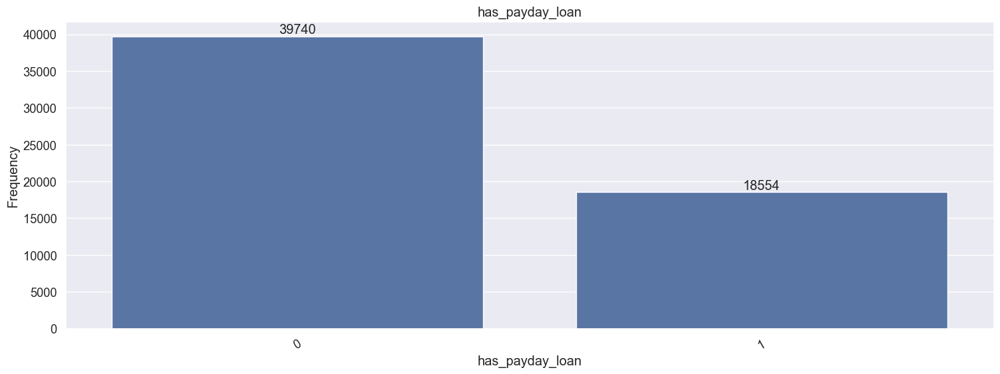

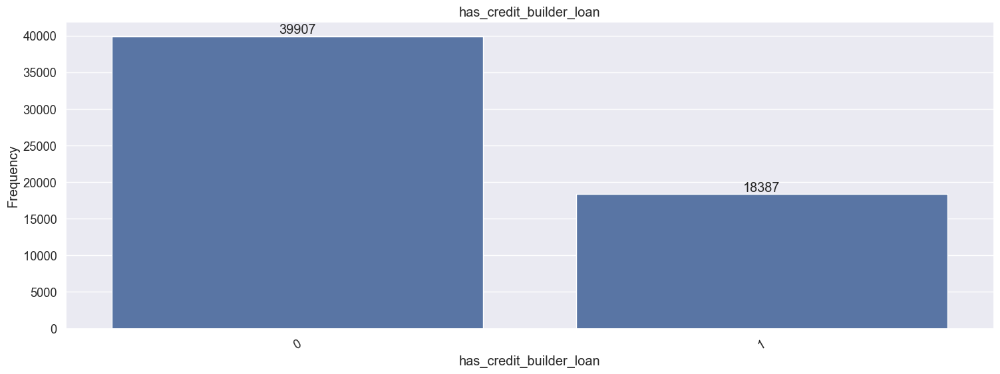

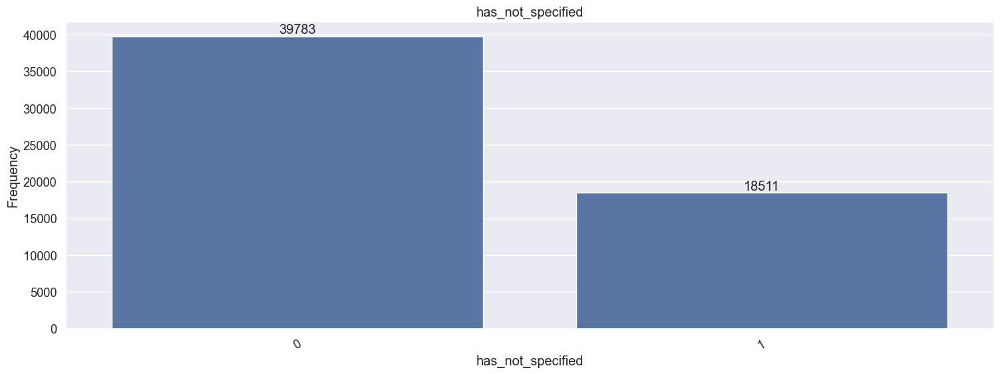

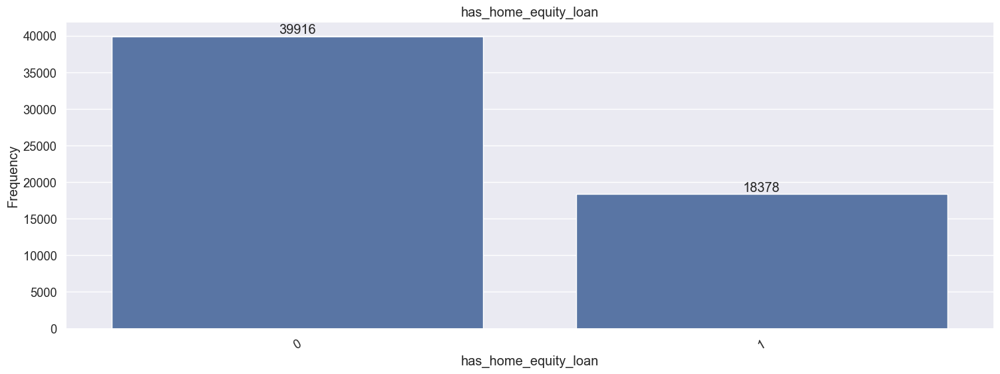

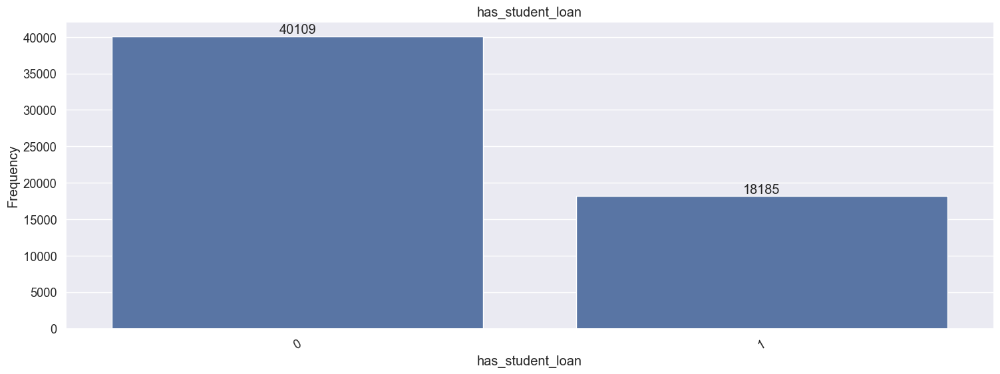

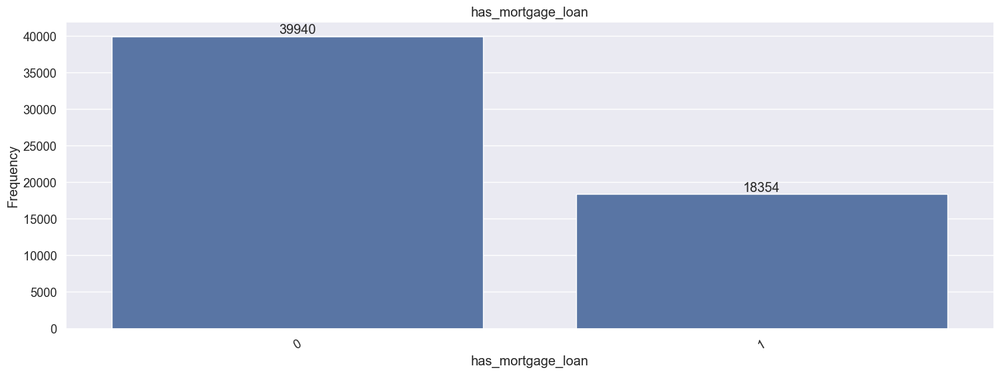

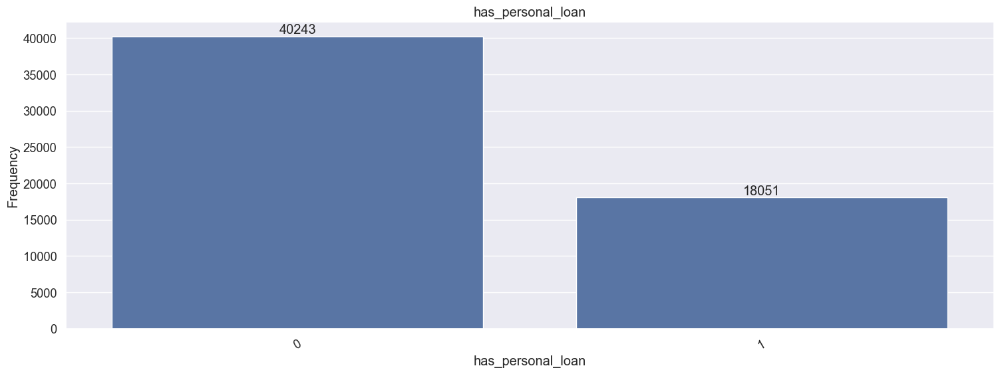

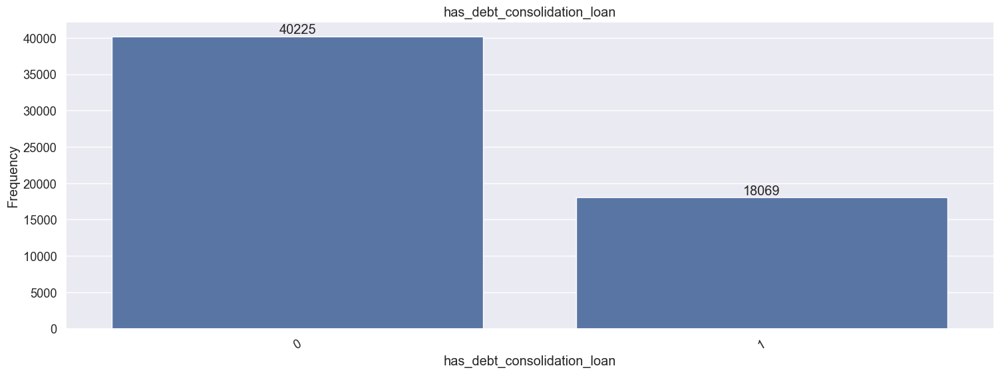

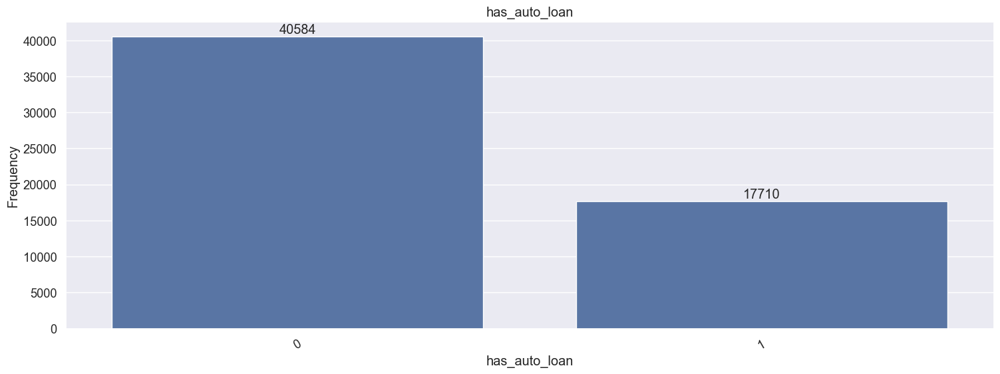

In [106]:
for c in loan_columns:
    bar_plot(c, train_df)

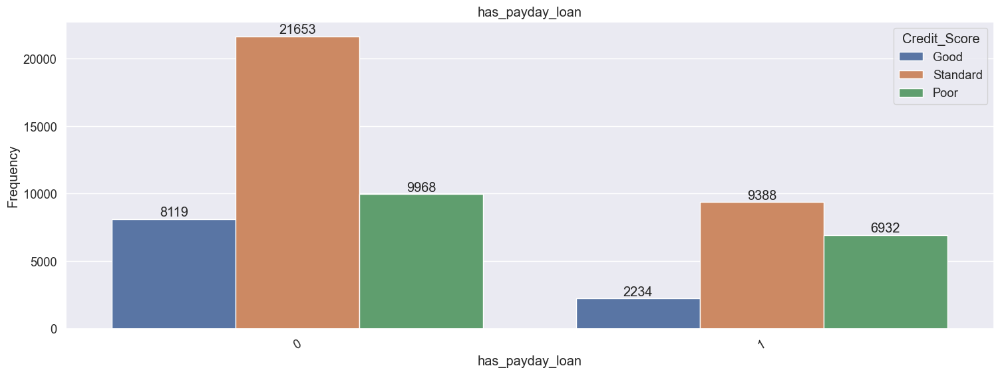

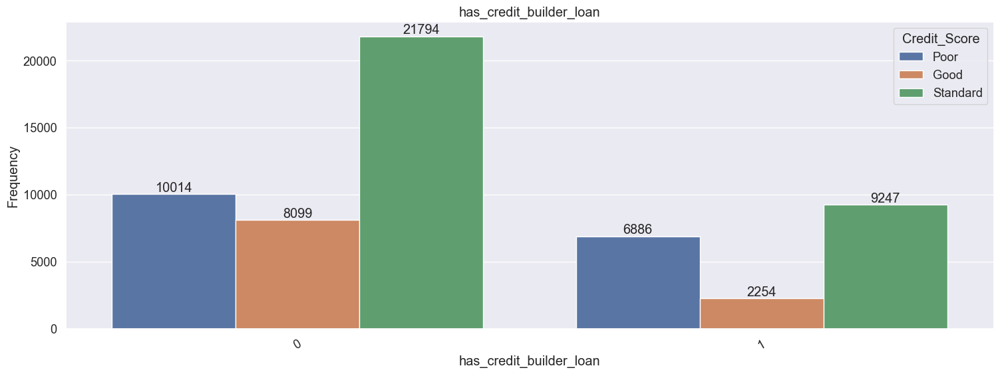

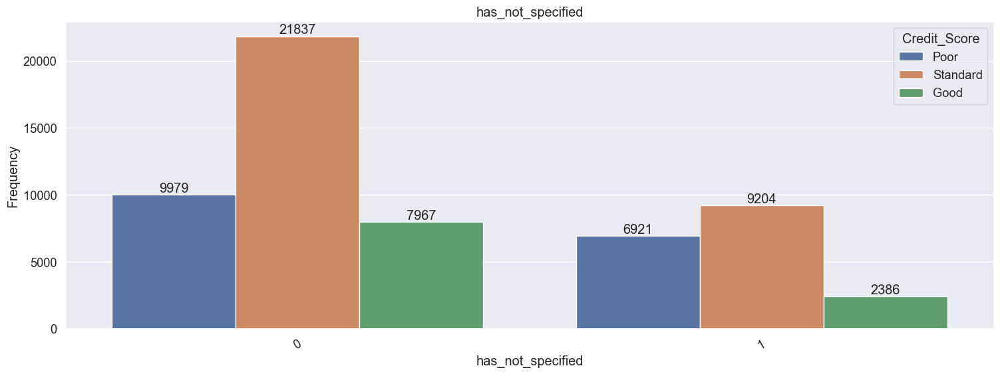

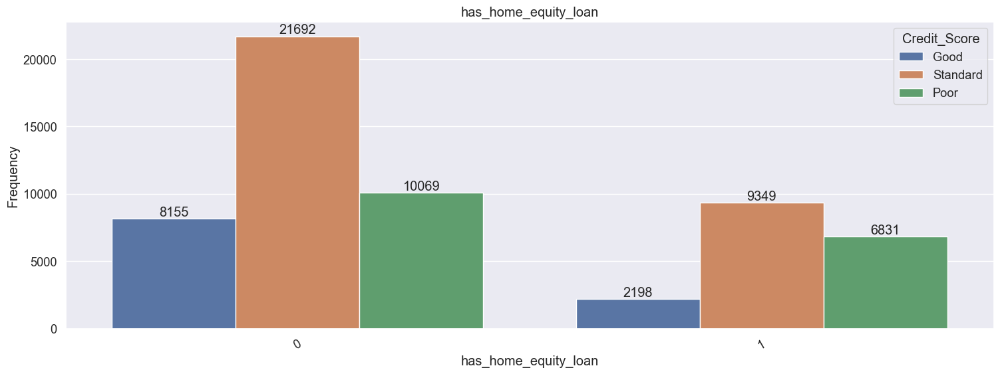

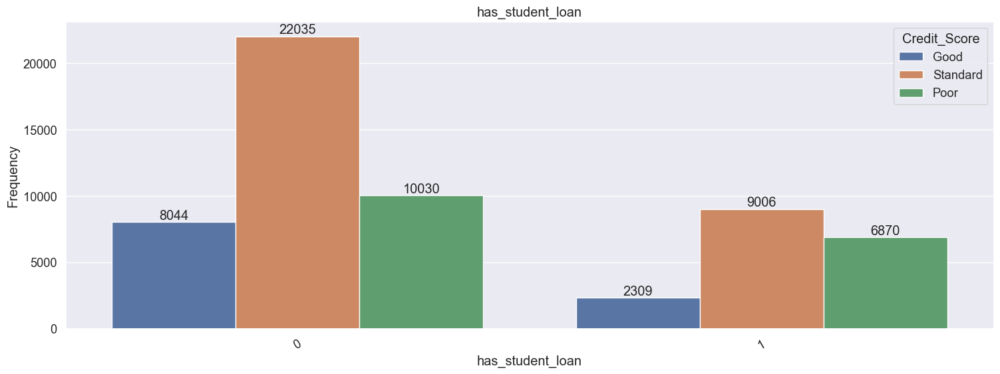

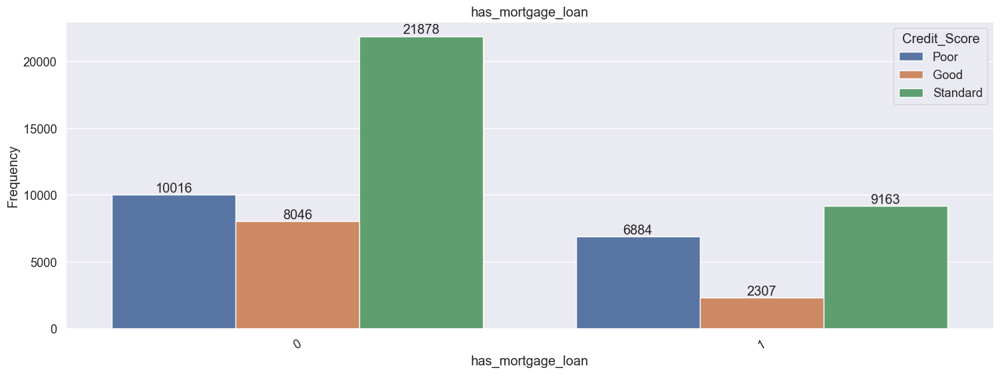

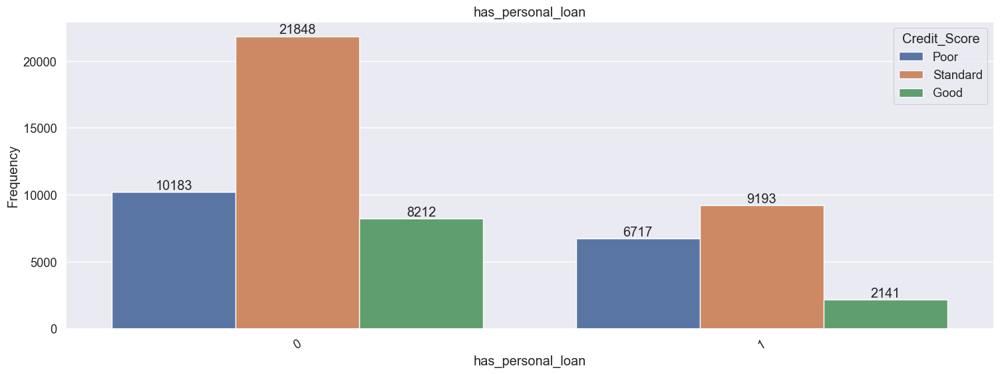

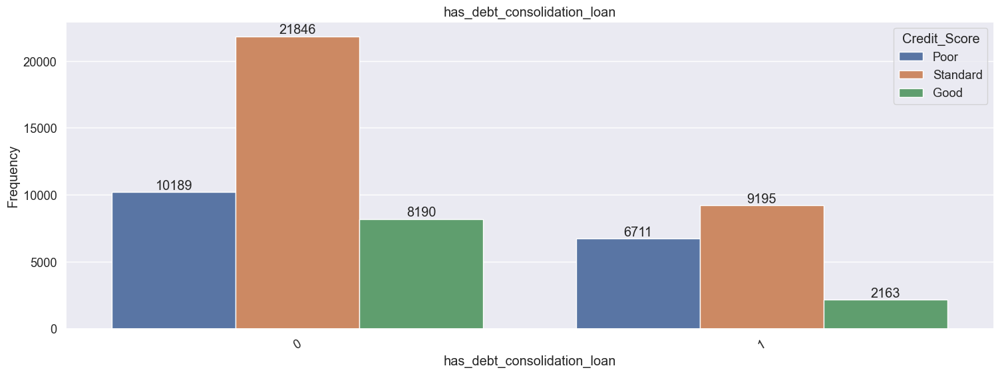

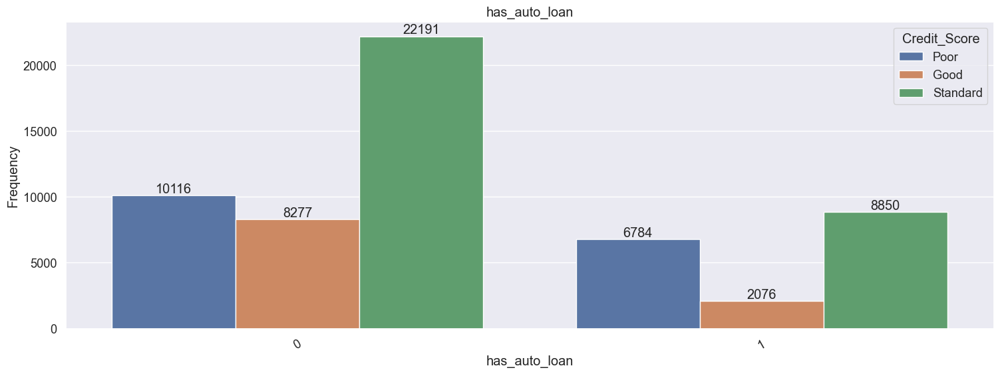

In [107]:
for c in loan_columns:
    target_bar_plot(c, train_df)

In [108]:
# Drop Type_of_Loan from all splits
train_df = train_df.drop("Type_of_Loan", axis=1)
val_df = val_df.drop("Type_of_Loan", axis=1)
test_df = test_df.drop("Type_of_Loan", axis=1)

## Delay_from_due_date

In [109]:
train_df.Delay_from_due_date.unique()

array([25,  6, 22, 12, 21, 10, 29, 27, 32, 23,  8,  2, 15, 13,  7,  9, 20,
       26, 16, 35,  0,  5, 41, 30, 17, 14, 11,  4, 33, 19,  3, 55, 24, 58,
       37, 53, 43, 44, 50, 59,  1, 60, 57, 31, 47, 40, 28, 45, 18, -2, 36,
       54, -1, 49, 48, 42, 52, 38, 34, 56, 61, 46, 51, 39, -3, 64, 62, -5,
       63, 65, 66, -4, 67])

In [110]:
train_df.Delay_from_due_date.value_counts()

Delay_from_due_date
 15    2096
 13    2003
 14    1929
 7     1919
 10    1914
       ... 
-4       40
 65      31
 66      22
-5       17
 67      12
Name: count, Length: 73, dtype: int64

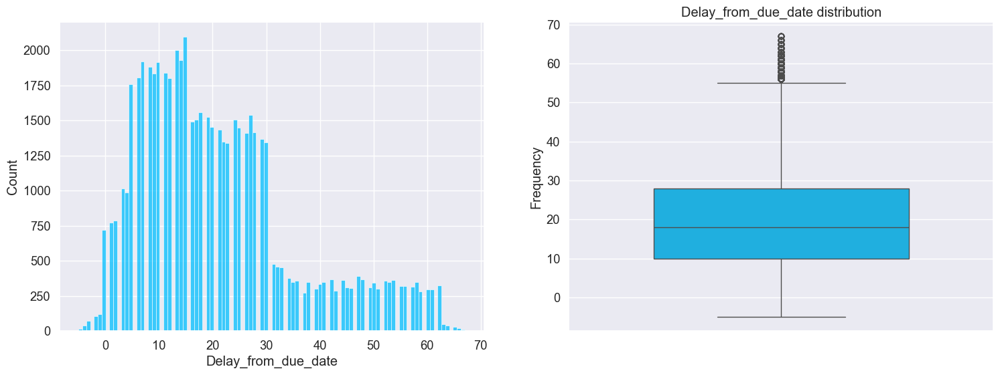

In [111]:
plot_hist("Delay_from_due_date", train_df)

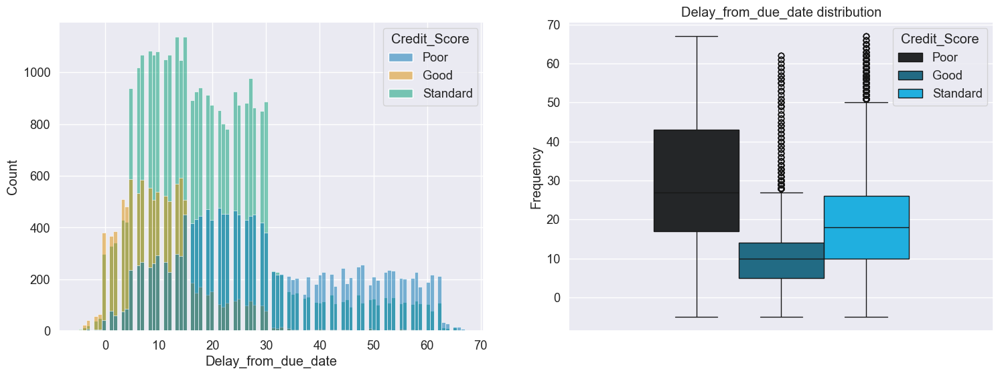

In [112]:
target_hist("Delay_from_due_date", train_df)

## Num_of_Delayed_Payment

In [113]:
def convert_num_of_delayed_payment(num_of_delayed_payment):
    try:
        return num_of_delayed_payment.replace('_', '').strip()
    except:
        return np.nan

In [114]:
# Apply Num_of_Delayed_Payment transformation to all splits
train_df.Num_of_Delayed_Payment = train_df.Num_of_Delayed_Payment.apply(convert_num_of_delayed_payment).astype("float")
val_df.Num_of_Delayed_Payment = val_df.Num_of_Delayed_Payment.apply(convert_num_of_delayed_payment).astype("float")
test_df.Num_of_Delayed_Payment = test_df.Num_of_Delayed_Payment.apply(convert_num_of_delayed_payment).astype("float")

In [115]:
# Apply abs transformation to all splits
train_df.Num_of_Delayed_Payment = train_df.Num_of_Delayed_Payment.apply(abs)
val_df.Num_of_Delayed_Payment = val_df.Num_of_Delayed_Payment.apply(abs)
test_df.Num_of_Delayed_Payment = test_df.Num_of_Delayed_Payment.apply(abs)

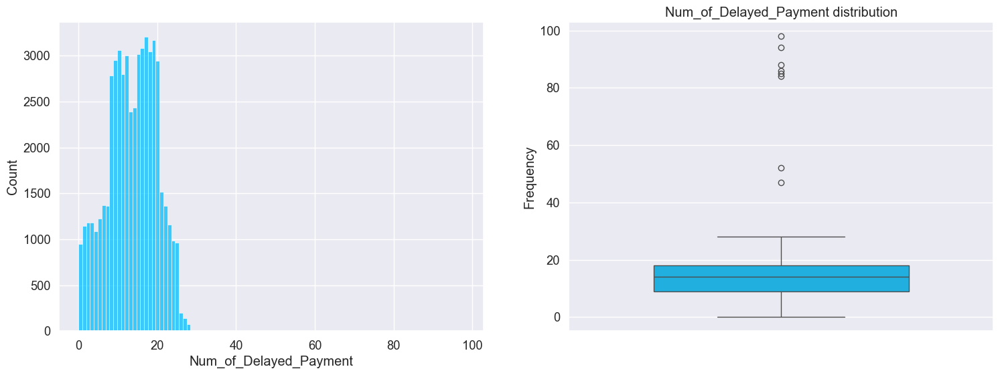

In [116]:
plot_hist('Num_of_Delayed_Payment', train_df[train_df.Num_of_Delayed_Payment<100])

In [117]:
# Apply log transformation to all splits
train_df['Num_of_Delayed_Payment_log'] = np.log1p(train_df.Num_of_Delayed_Payment)
val_df['Num_of_Delayed_Payment_log'] = np.log1p(val_df.Num_of_Delayed_Payment)
test_df['Num_of_Delayed_Payment_log'] = np.log1p(test_df.Num_of_Delayed_Payment)

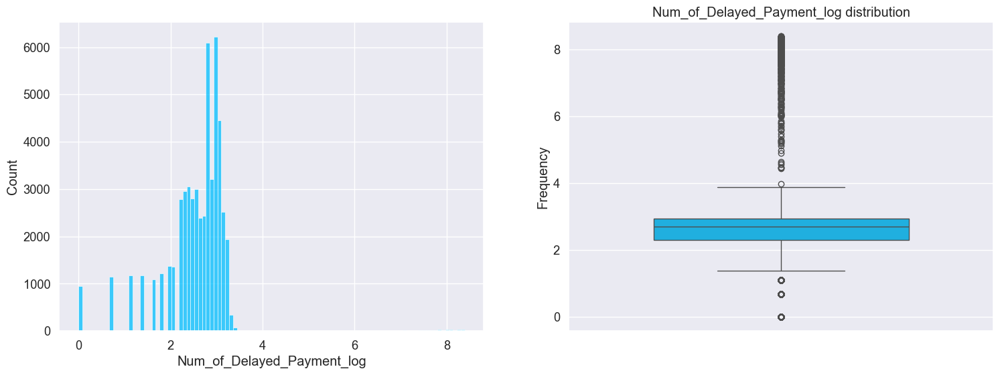

In [118]:
plot_hist("Num_of_Delayed_Payment_log", train_df)

In [119]:
# Calculate 99th percentile on train set only
p_99 = train_df['Num_of_Delayed_Payment_log'].quantile(0.99)
print(f"percentile: {p_99}")

percentile: 3.332204510175204


In [120]:
# Apply clipping to all splits using train set percentile
train_df['Num_of_Delayed_Payment_log'] = train_df['Num_of_Delayed_Payment_log'].clip(upper=p_99)
val_df['Num_of_Delayed_Payment_log'] = val_df['Num_of_Delayed_Payment_log'].clip(upper=p_99)
test_df['Num_of_Delayed_Payment_log'] = test_df['Num_of_Delayed_Payment_log'].clip(upper=p_99)

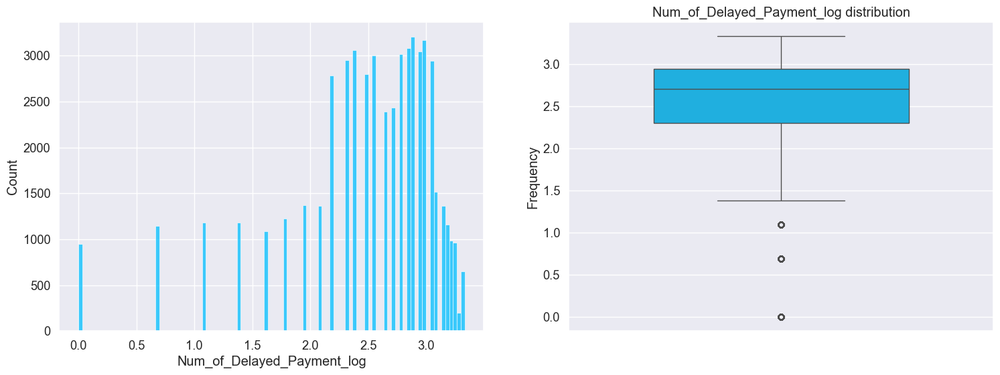

In [121]:
plot_hist("Num_of_Delayed_Payment_log", train_df)

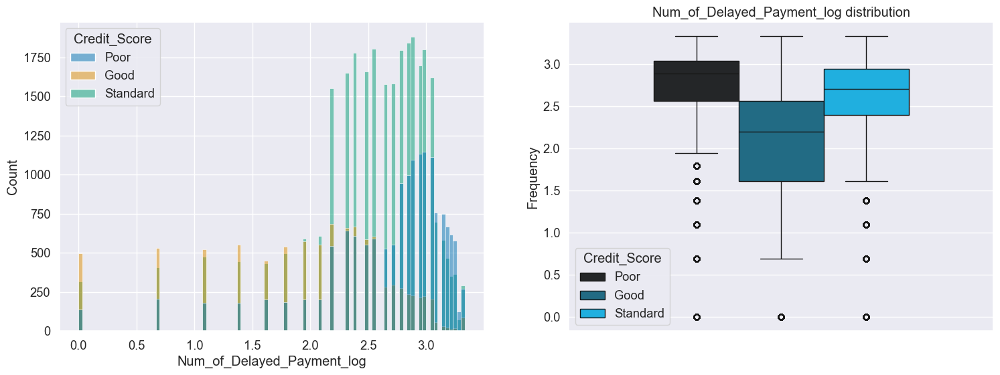

In [122]:
target_hist("Num_of_Delayed_Payment_log", train_df)

In [123]:
# Calculate median on train set only
median_value = train_df['Num_of_Delayed_Payment_log'].median()

In [124]:
# Apply median to train, val, and test sets
train_df['Num_of_Delayed_Payment_log'].fillna(median_value, inplace=True)
val_df['Num_of_Delayed_Payment_log'].fillna(median_value, inplace=True)
test_df['Num_of_Delayed_Payment_log'].fillna(median_value, inplace=True)

In [125]:
# Drop Num_of_Delayed_Payment from all splits
train_df = train_df.drop('Num_of_Delayed_Payment', axis=1)
val_df = val_df.drop('Num_of_Delayed_Payment', axis=1)
test_df = test_df.drop('Num_of_Delayed_Payment', axis=1)

## Changed_Credit_Limit

In [126]:
def convert_changed_credit_limit(changed_credit_limit):
    try:
        res =  changed_credit_limit.replace('_', '').strip()
        if len(res) == 0:
            res = 0
        return res
    except:
        return np.nan

In [127]:
# Apply Changed_Credit_Limit transformation to all splits
train_df.Changed_Credit_Limit = train_df.Changed_Credit_Limit.apply(convert_changed_credit_limit).astype("float")
val_df.Changed_Credit_Limit = val_df.Changed_Credit_Limit.apply(convert_changed_credit_limit).astype("float")
test_df.Changed_Credit_Limit = test_df.Changed_Credit_Limit.apply(convert_changed_credit_limit).astype("float")

In [128]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 58294 entries, 89385 to 51461
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   Month                        58294 non-null  object  
 1   Age                          58294 non-null  int64   
 2   Occupation                   58294 non-null  object  
 3   Monthly_Inhand_Salary        58294 non-null  float64 
 4   Num_of_Loan                  58294 non-null  int64   
 5   Delay_from_due_date          58294 non-null  int64   
 6   Changed_Credit_Limit         58294 non-null  float64 
 7   Num_Credit_Inquiries         57155 non-null  float64 
 8   Credit_Mix                   58294 non-null  object  
 9   Outstanding_Debt             58294 non-null  object  
 10  Credit_Utilization_Ratio     58294 non-null  float64 
 11  Credit_History_Age           53042 non-null  object  
 12  Payment_of_Min_Amount        58294 non-null  object  
 13  To

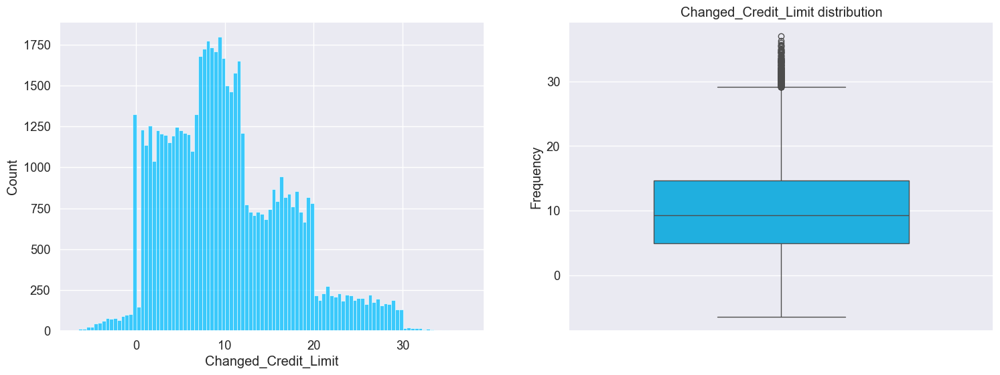

In [129]:
plot_hist('Changed_Credit_Limit', train_df)

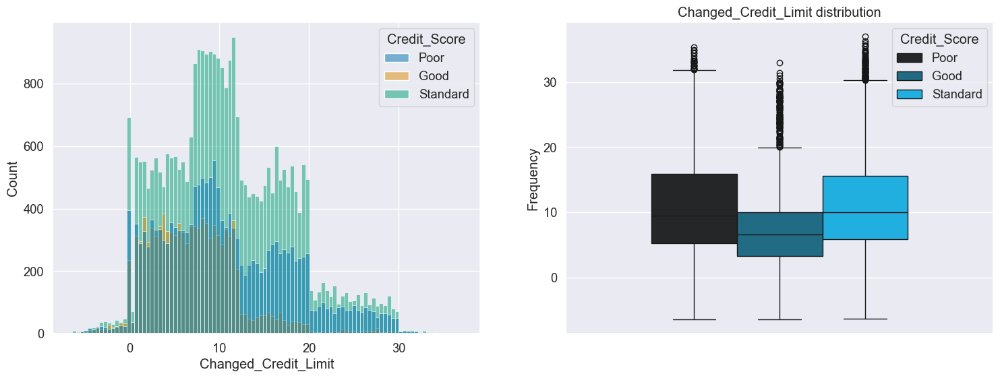

In [130]:
target_hist('Changed_Credit_Limit', train_df)

## Num_Credit_Inquiries

In [131]:
train_df.Num_Credit_Inquiries.isna().sum()

np.int64(1139)

In [132]:
# Calculate mode on train set only
mode_value = train_df['Num_Credit_Inquiries'].mode().iloc[0]

# Apply mode to train, val, and test sets
train_df['Num_Credit_Inquiries'].fillna(mode_value, inplace=True)
val_df['Num_Credit_Inquiries'].fillna(mode_value, inplace=True)
test_df['Num_Credit_Inquiries'].fillna(mode_value, inplace=True)

In [133]:
# Apply astype to all splits
train_df.Num_Credit_Inquiries = train_df.Num_Credit_Inquiries.astype('int')
val_df.Num_Credit_Inquiries = val_df.Num_Credit_Inquiries.astype('int')
test_df.Num_Credit_Inquiries = test_df.Num_Credit_Inquiries.astype('int')

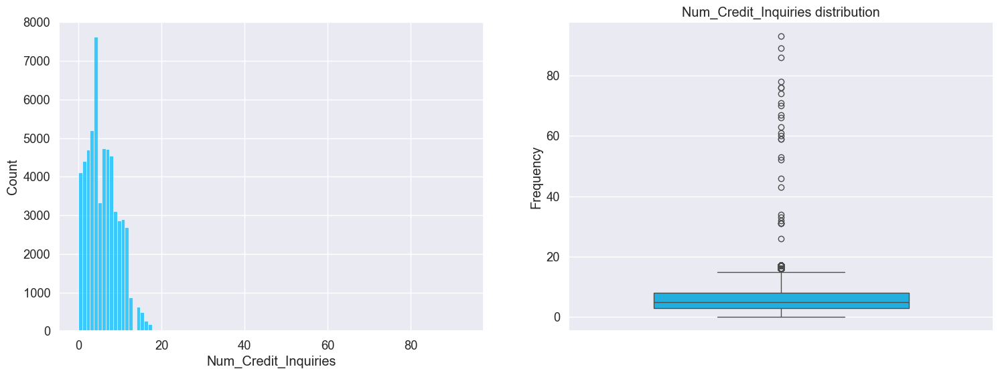

In [134]:
plot_hist("Num_Credit_Inquiries", train_df[train_df.Num_Credit_Inquiries<100])

In [135]:
# Apply log transformation to all splits
train_df['Num_Credit_Inquiries_log'] = np.log1p(train_df.Num_Credit_Inquiries)
val_df['Num_Credit_Inquiries_log'] = np.log1p(val_df.Num_Credit_Inquiries)
test_df['Num_Credit_Inquiries_log'] = np.log1p(test_df.Num_Credit_Inquiries)

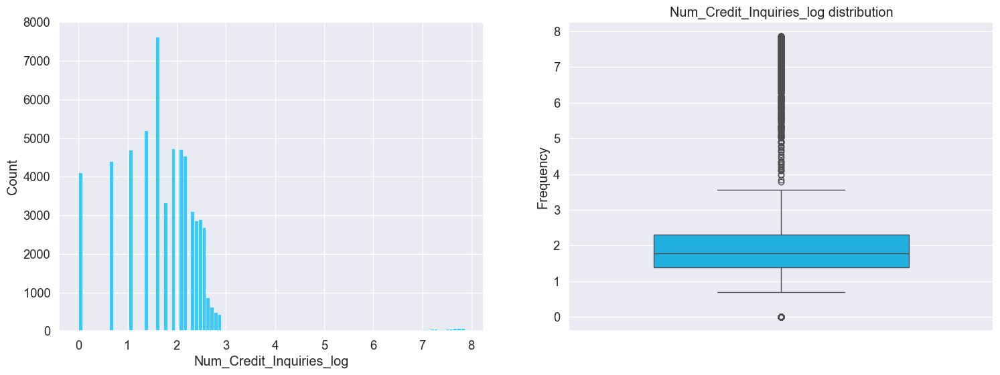

In [136]:
plot_hist("Num_Credit_Inquiries_log", train_df)

In [137]:
# Calculate 98th percentile on train set only
p_98 = train_df['Num_Credit_Inquiries_log'].quantile(0.98)
print(f"percentile: {p_98}")

percentile: 2.833213344056216


In [138]:
# Apply clipping to all splits using train set percentile
train_df['Num_Credit_Inquiries_log'] = train_df['Num_Credit_Inquiries_log'].clip(upper=p_98)
val_df['Num_Credit_Inquiries_log'] = val_df['Num_Credit_Inquiries_log'].clip(upper=p_98)
test_df['Num_Credit_Inquiries_log'] = test_df['Num_Credit_Inquiries_log'].clip(upper=p_98)

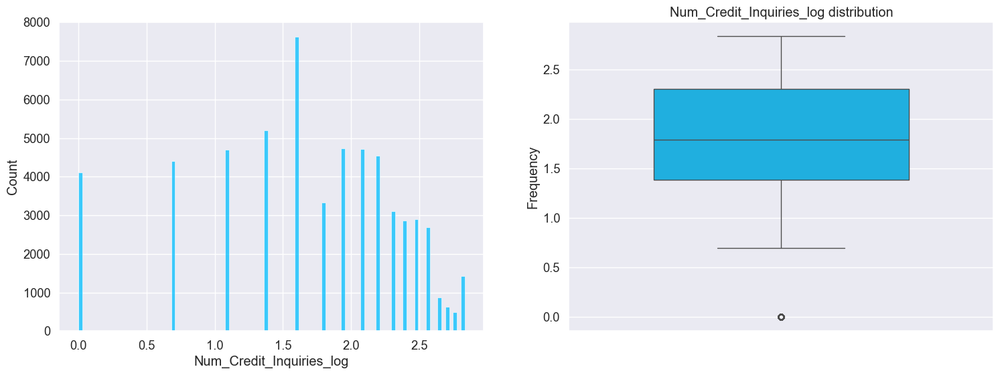

In [139]:
plot_hist("Num_Credit_Inquiries_log", train_df)

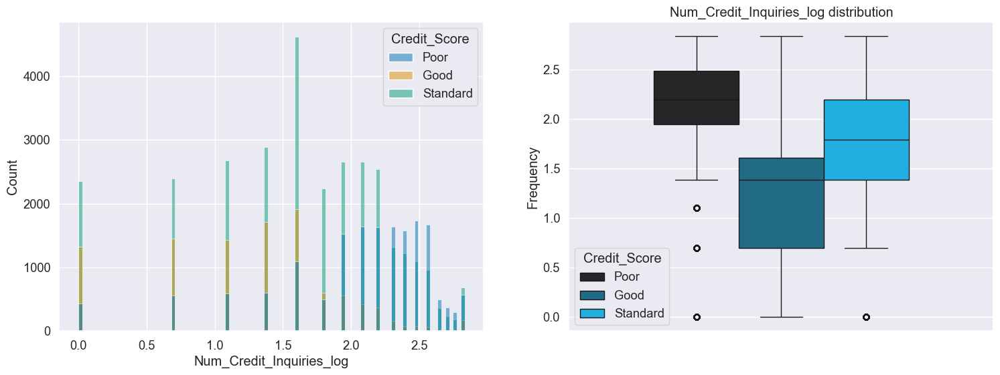

In [140]:
target_hist("Num_Credit_Inquiries_log", train_df)

In [141]:
# Drop Num_Credit_Inquiries from all splits
train_df = train_df.drop('Num_Credit_Inquiries', axis=1)
val_df = val_df.drop('Num_Credit_Inquiries', axis=1)
test_df = test_df.drop('Num_Credit_Inquiries', axis=1)

## Credit_Mix

In [142]:
train_df.Credit_Mix.unique()

array(['Standard', 'Good', 'Bad', '_'], dtype=object)

Credit_Mix
Standard    0.365406
Good        0.242701
_           0.200947
Bad         0.190946
Name: proportion, dtype: float64


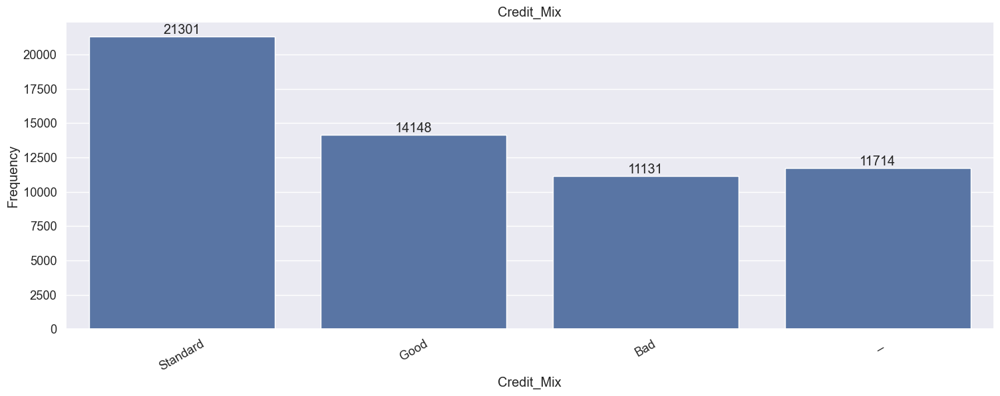

In [143]:
bar_plot('Credit_Mix', train_df)

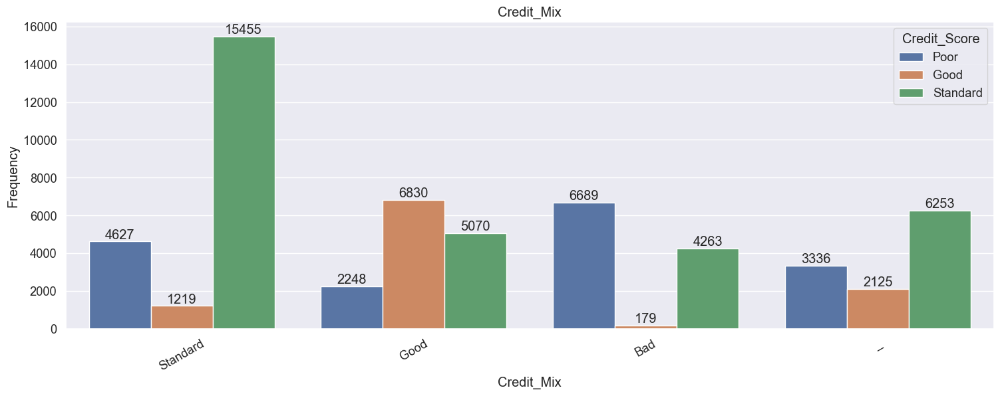

In [144]:
target_bar_plot('Credit_Mix', train_df)

## Outstanding_Debt

In [145]:
def convert_outstanding_debt(outstanding_debt):
    try:
        return outstanding_debt.replace('_', '').strip()
    except:
        return np.nan

In [146]:
# Apply Outstanding_Debt transformation to all splits
train_df.Outstanding_Debt = train_df.Outstanding_Debt.apply(convert_outstanding_debt)
val_df.Outstanding_Debt = val_df.Outstanding_Debt.apply(convert_outstanding_debt)
test_df.Outstanding_Debt = test_df.Outstanding_Debt.apply(convert_outstanding_debt)

In [147]:
# Apply astype to all splits
train_df.Outstanding_Debt = train_df.Outstanding_Debt.astype('float')
val_df.Outstanding_Debt = val_df.Outstanding_Debt.astype('float')
test_df.Outstanding_Debt = test_df.Outstanding_Debt.astype('float')

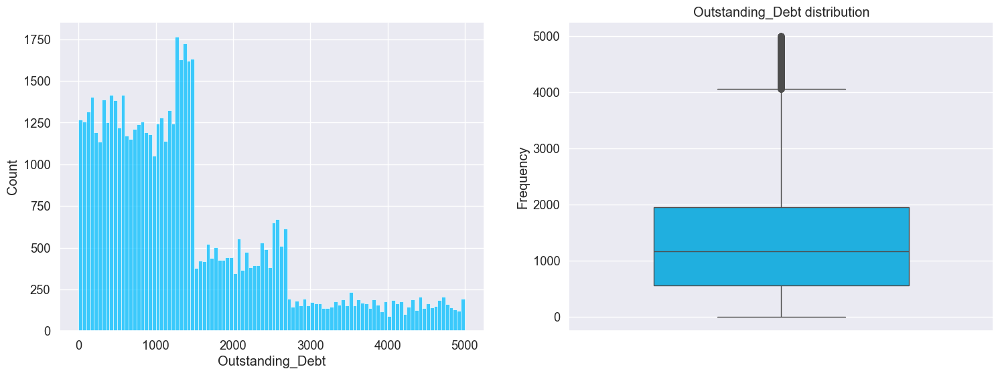

In [148]:
plot_hist('Outstanding_Debt', train_df)

In [149]:
train_df.Outstanding_Debt.describe()

count    58294.000000
mean      1425.124667
std       1156.878986
min          0.230000
25%        559.350000
50%       1164.700000
75%       1958.280000
max       4998.070000
Name: Outstanding_Debt, dtype: float64

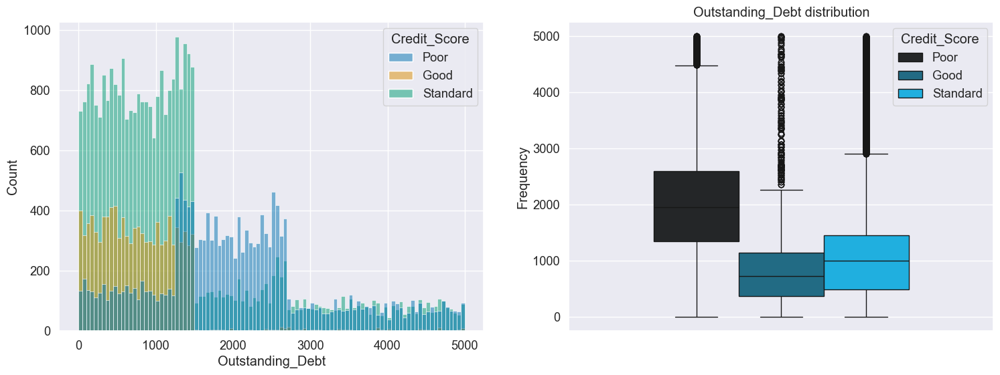

In [150]:
target_hist('Outstanding_Debt', train_df)

## Credit_Utilization_Ratio

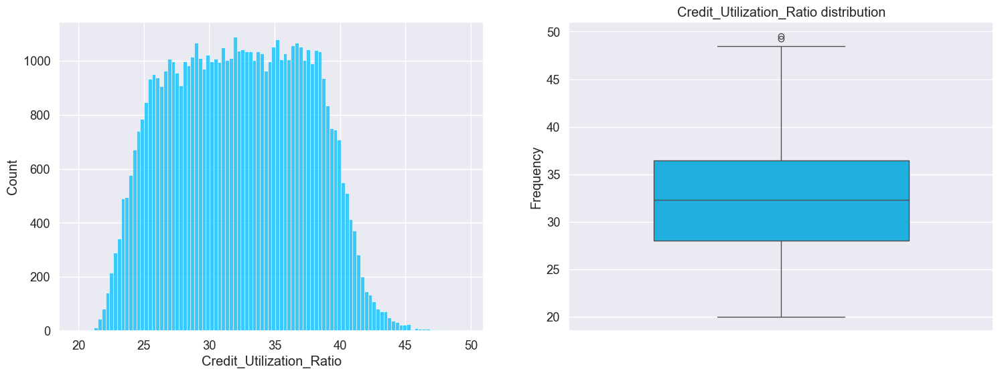

In [151]:
plot_hist('Credit_Utilization_Ratio', train_df)

In [152]:
train_df.Credit_Utilization_Ratio.describe()

count    58294.000000
mean        32.274406
std          5.117086
min         20.000000
25%         28.055272
50%         32.284639
75%         36.485582
max         49.522324
Name: Credit_Utilization_Ratio, dtype: float64

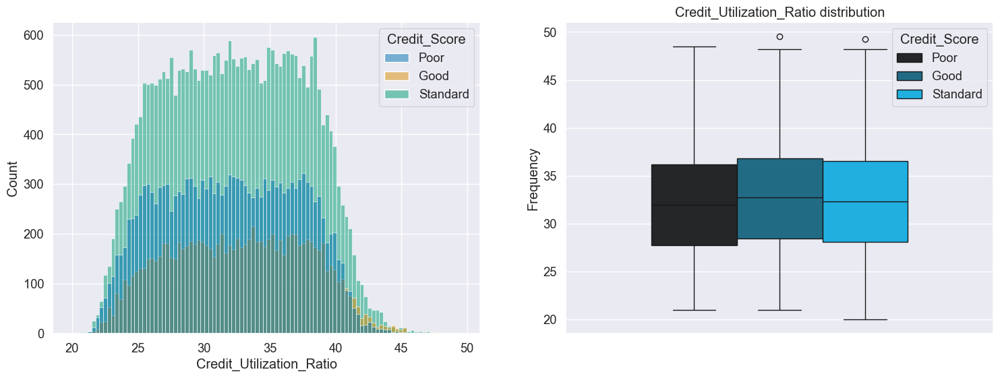

In [153]:
target_hist('Credit_Utilization_Ratio', train_df)

## Credit_History_Age

In [154]:
df.Credit_History_Age.head()

0    22 Years and 1 Months
1                      NaN
2    22 Years and 3 Months
3    22 Years and 4 Months
4    22 Years and 5 Months
Name: Credit_History_Age, dtype: object

In [155]:
df.Credit_History_Age.isna().sum() / 97219

np.float64(0.09288307841059876)

In [156]:
def convert_credit_history_age(credit_history_age):
    try:
        years = re.search(r'(\d+)\s*Year', credit_history_age)
        months = re.search(r'(\d+)\s*Month', credit_history_age)

        total_months = 0
        if years:
            total_months += int(years.group(1)) * 12
        if months:
            total_months += int(months.group(1))

        return total_months
    except:
        return np.nan

In [157]:
# Apply Credit_History_Age transformation to all splits
train_df.Credit_History_Age = train_df.Credit_History_Age.apply(convert_credit_history_age)
val_df.Credit_History_Age = val_df.Credit_History_Age.apply(convert_credit_history_age)
test_df.Credit_History_Age = test_df.Credit_History_Age.apply(convert_credit_history_age)

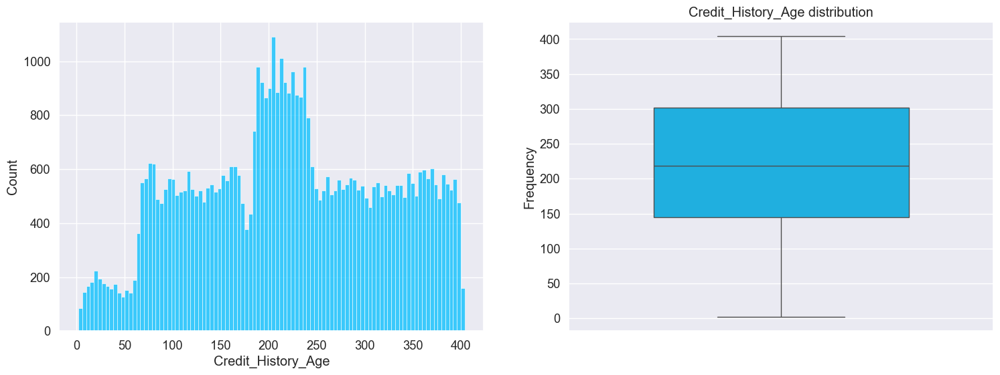

In [158]:
plot_hist('Credit_History_Age', train_df)

In [159]:
train_df.Credit_History_Age.describe()

count    53042.000000
mean       221.231477
std         99.493237
min          2.000000
25%        145.000000
50%        219.000000
75%        302.000000
max        404.000000
Name: Credit_History_Age, dtype: float64

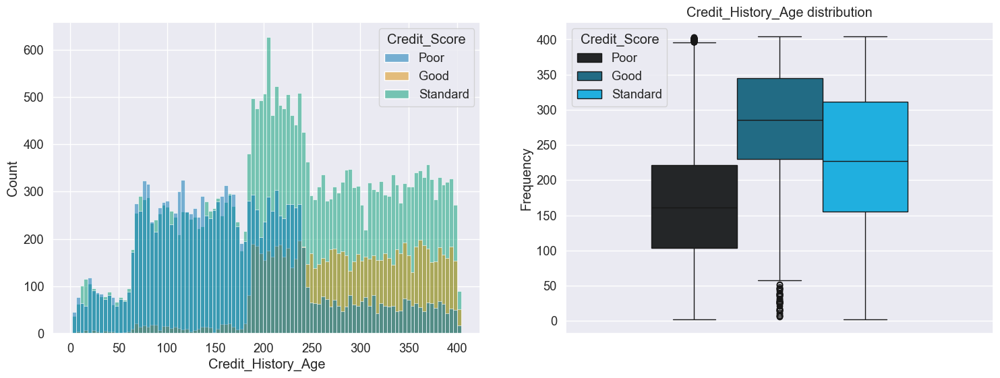

In [160]:
target_hist('Credit_History_Age', train_df)

In [161]:
# Calculate median grouped by Age on train set only
age_medians = train_df.groupby('Age')['Credit_History_Age'].median()

# Apply to train, val, and test sets
train_df['Credit_History_Age'] = train_df['Credit_History_Age'].fillna(
    train_df['Age'].map(age_medians)
)
val_df['Credit_History_Age'] = val_df['Credit_History_Age'].fillna(
    val_df['Age'].map(age_medians)
)
test_df['Credit_History_Age'] = test_df['Credit_History_Age'].fillna(
    test_df['Age'].map(age_medians)
)

# If any Age is missing from train set, use global median from train set
global_median = train_df['Credit_History_Age'].median()
train_df['Credit_History_Age'] = train_df['Credit_History_Age'].fillna(global_median)
val_df['Credit_History_Age'] = val_df['Credit_History_Age'].fillna(global_median)
test_df['Credit_History_Age'] = test_df['Credit_History_Age'].fillna(global_median)

# Update df for EDA (combine all sets)
df = pd.concat([train_df, val_df, test_df], ignore_index=True)

## Payment_of_Min_Amount

Payment_of_Min_Amount
Yes    0.523210
No     0.356795
NM     0.119995
Name: proportion, dtype: float64


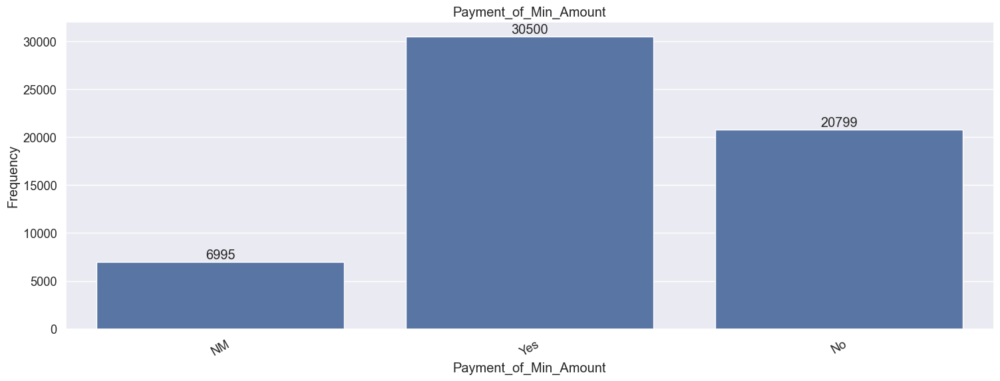

In [162]:
bar_plot("Payment_of_Min_Amount", train_df)

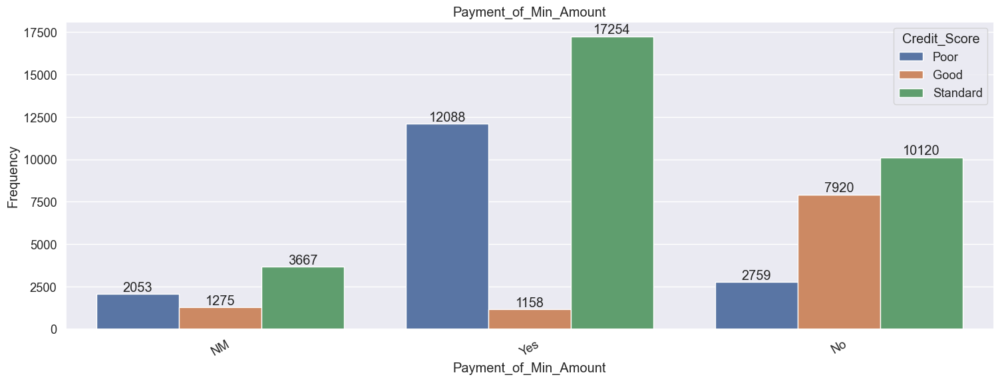

In [163]:
target_bar_plot("Payment_of_Min_Amount", train_df)

## Total_EMI_per_month

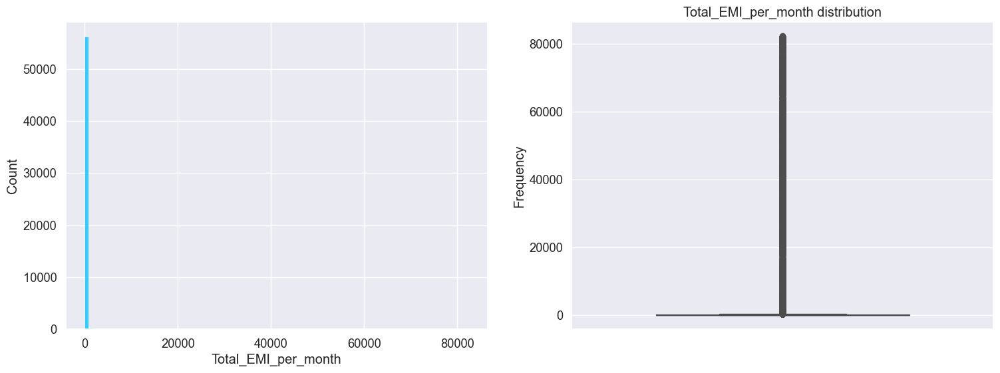

In [164]:
plot_hist('Total_EMI_per_month', train_df)

In [165]:
# Apply log transformation to all splits
train_df['Total_EMI_per_month_log'] = np.log1p(train_df.Total_EMI_per_month)
val_df['Total_EMI_per_month_log'] = np.log1p(val_df.Total_EMI_per_month)
test_df['Total_EMI_per_month_log'] = np.log1p(test_df.Total_EMI_per_month)

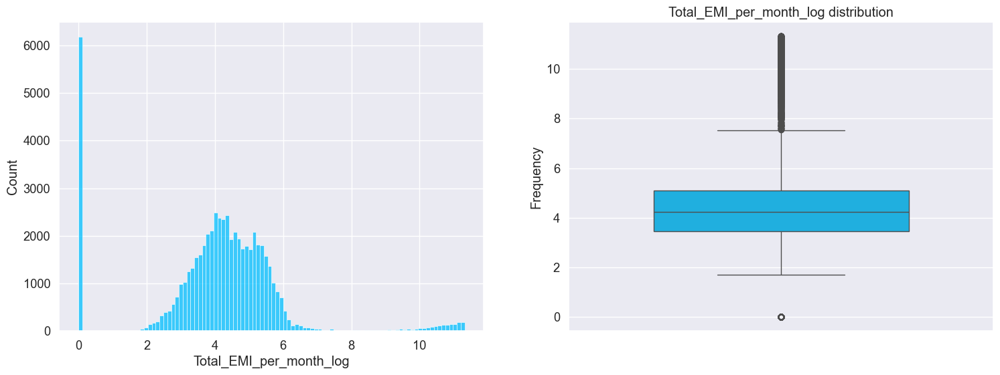

In [166]:
plot_hist("Total_EMI_per_month_log", train_df)

In [167]:
# Calculate 96th percentile on train set only
p_96 = train_df['Total_EMI_per_month_log'].quantile(0.96)
print(f"percentile: {p_96}")

percentile: 6.476822724635331


In [168]:
# Apply clipping to all splits using train set percentile
train_df['Total_EMI_per_month_log'] = train_df['Total_EMI_per_month_log'].clip(upper=p_96)
val_df['Total_EMI_per_month_log'] = val_df['Total_EMI_per_month_log'].clip(upper=p_96)
test_df['Total_EMI_per_month_log'] = test_df['Total_EMI_per_month_log'].clip(upper=p_96)

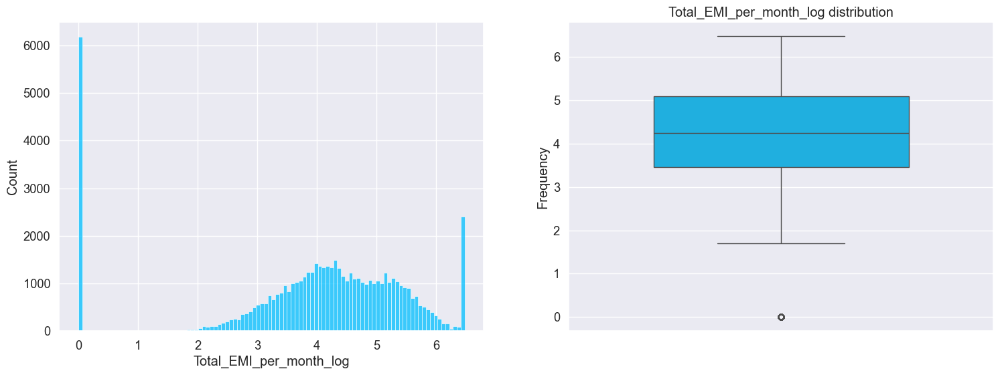

In [169]:
plot_hist("Total_EMI_per_month_log", train_df)

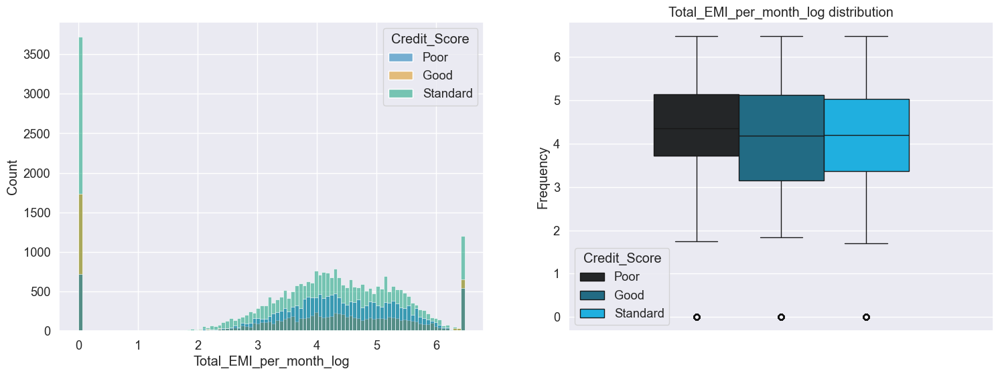

In [170]:
target_hist("Total_EMI_per_month_log", train_df)

In [171]:
train_df['has_EMI'] = (train_df['Total_EMI_per_month_log'] > 0).astype(int)
val_df['has_EMI'] = (val_df['Total_EMI_per_month_log'] > 0).astype(int)
test_df['has_EMI'] = (test_df['Total_EMI_per_month_log'] > 0).astype(int)

has_EMI
1    0.894037
0    0.105963
Name: proportion, dtype: float64


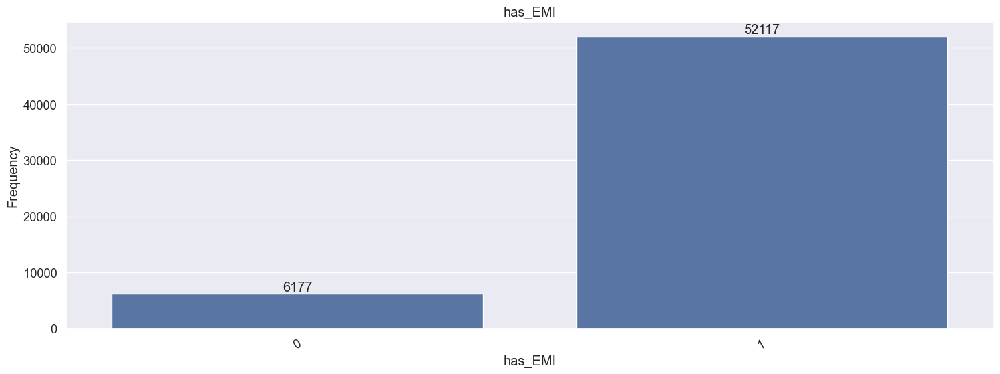

In [172]:
bar_plot('has_EMI', train_df)

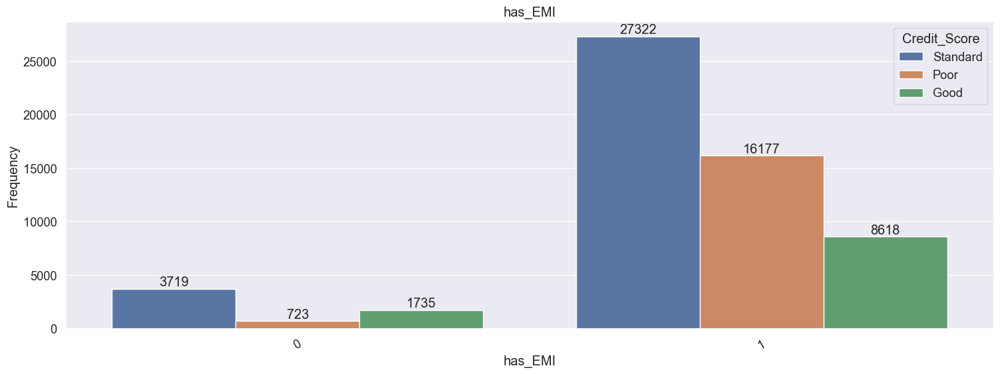

In [173]:
target_bar_plot('has_EMI', train_df)

In [174]:
# Drop Total_EMI_per_month from all splits
train_df = train_df.drop('Total_EMI_per_month', axis=1)
val_df = val_df.drop('Total_EMI_per_month', axis=1)
test_df = test_df.drop('Total_EMI_per_month', axis=1)

## Amount_invested_monthly

In [175]:
train_df.Amount_invested_monthly.value_counts()

Amount_invested_monthly
__10000__             2579
0.0                    102
79.76935023888275        1
233.06947487569684       1
161.55748370879118       1
                      ... 
125.40087360213896       1
19.151365592795194       1
140.34577502360509       1
118.37413816523001       1
370.0771014954325        1
Name: count, Length: 52995, dtype: int64

In [176]:
train_df['Investor_10000'] = train_df.Amount_invested_monthly == '__10000__'
val_df['Investor_10000'] = val_df.Amount_invested_monthly == '__10000__'
test_df['Investor_10000'] = test_df.Amount_invested_monthly == '__10000__'

Investor_10000
False    0.955759
True     0.044241
Name: proportion, dtype: float64


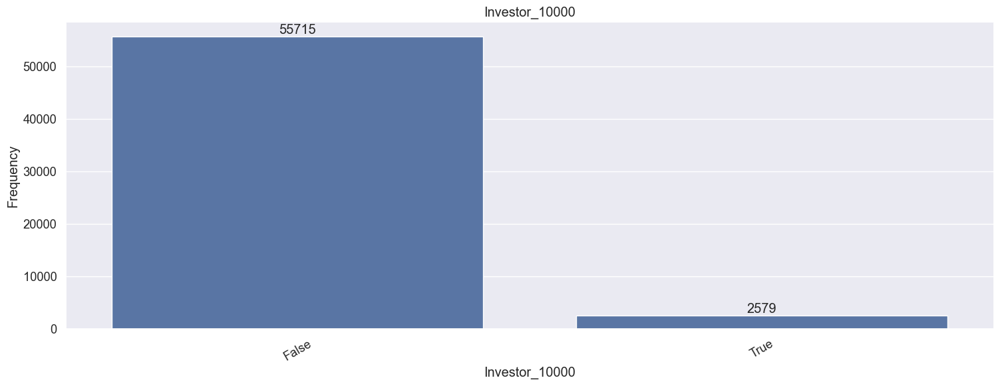

In [177]:
bar_plot('Investor_10000', train_df)

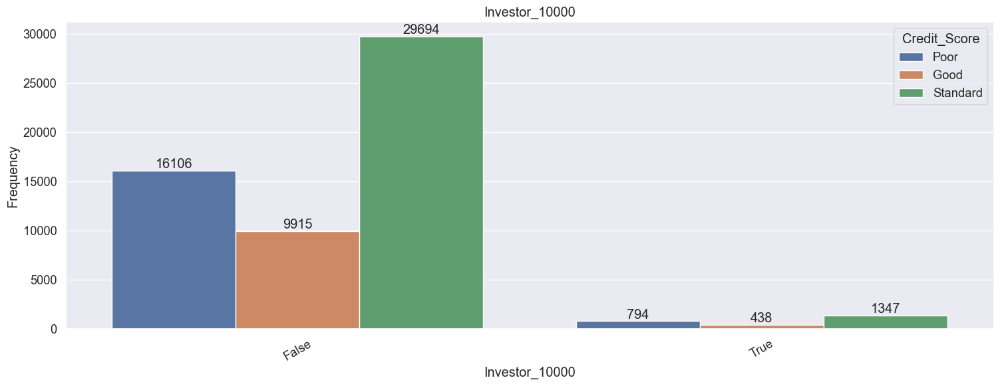

In [178]:
target_bar_plot('Investor_10000', train_df)

In [179]:
# Replace __10000__ with NaN for all splits
train_df.Amount_invested_monthly = train_df.Amount_invested_monthly.replace('__10000__', np.nan)
val_df.Amount_invested_monthly = val_df.Amount_invested_monthly.replace('__10000__', np.nan)
test_df.Amount_invested_monthly = test_df.Amount_invested_monthly.replace('__10000__', np.nan)

In [180]:
# Apply astype to all splits
train_df.Amount_invested_monthly = train_df.Amount_invested_monthly.astype('float')
val_df.Amount_invested_monthly = val_df.Amount_invested_monthly.astype('float')
test_df.Amount_invested_monthly = test_df.Amount_invested_monthly.astype('float')

In [181]:
# Calculate median grouped by Annual_Income_log on train set only
income_medians = train_df.groupby('Annual_Income_log')['Amount_invested_monthly'].median()

In [182]:
# Apply grouped median to train, val, and test sets
train_df['Amount_invested_monthly'] = train_df['Amount_invested_monthly'].fillna(
    train_df['Annual_Income_log'].map(income_medians)
)
val_df['Amount_invested_monthly'] = val_df['Amount_invested_monthly'].fillna(
    val_df['Annual_Income_log'].map(income_medians)
)
test_df['Amount_invested_monthly'] = test_df['Amount_invested_monthly'].fillna(
    test_df['Annual_Income_log'].map(income_medians)
)

In [183]:
# Calculate global median on train set only and apply to remaining missing values
global_median = train_df['Amount_invested_monthly'].median()
train_df['Amount_invested_monthly'].fillna(global_median, inplace=True)
val_df['Amount_invested_monthly'].fillna(global_median, inplace=True)
test_df['Amount_invested_monthly'].fillna(global_median, inplace=True)

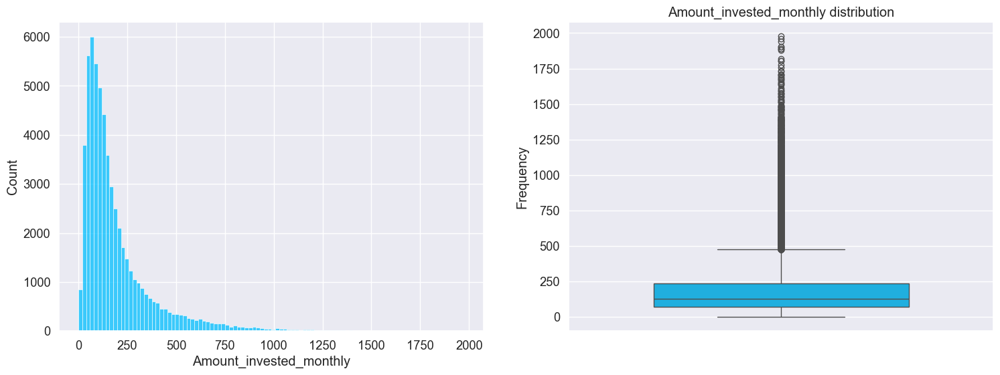

In [184]:
plot_hist('Amount_invested_monthly', train_df)

In [185]:
# Apply log transformation to all splits
train_df['Amount_invested_monthly_log'] = np.log1p(train_df.Amount_invested_monthly)
val_df['Amount_invested_monthly_log'] = np.log1p(val_df.Amount_invested_monthly)
test_df['Amount_invested_monthly_log'] = np.log1p(test_df.Amount_invested_monthly)

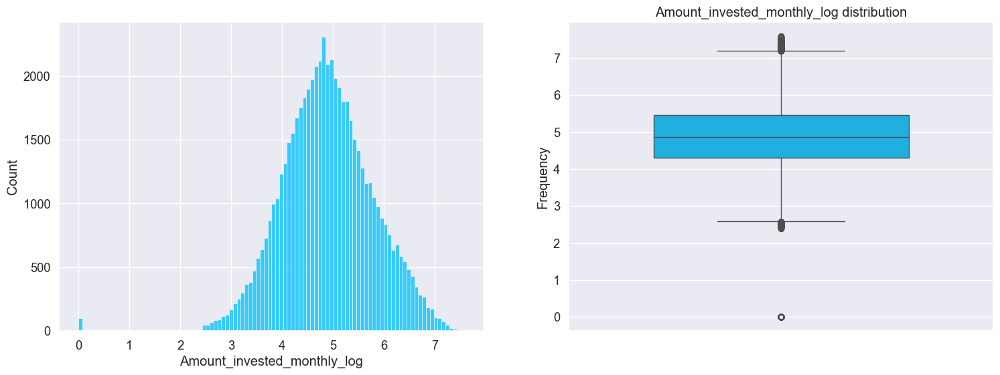

In [186]:
plot_hist('Amount_invested_monthly_log', train_df)

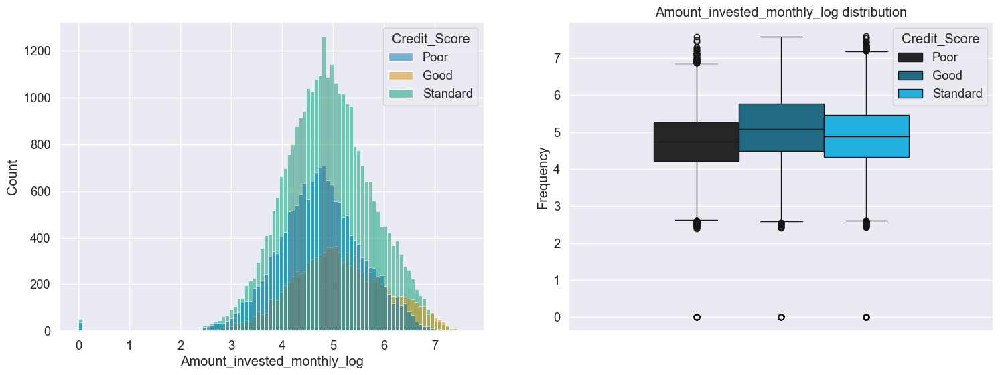

In [187]:
target_hist('Amount_invested_monthly_log', train_df)

In [188]:
# Create Invested_Flag for all splits
train_df['Invested_Flag'] = (train_df['Amount_invested_monthly_log'] > 0).astype(int)
val_df['Invested_Flag'] = (val_df['Amount_invested_monthly_log'] > 0).astype(int)
test_df['Invested_Flag'] = (test_df['Amount_invested_monthly_log'] > 0).astype(int)

Invested_Flag
1    0.99825
0    0.00175
Name: proportion, dtype: float64


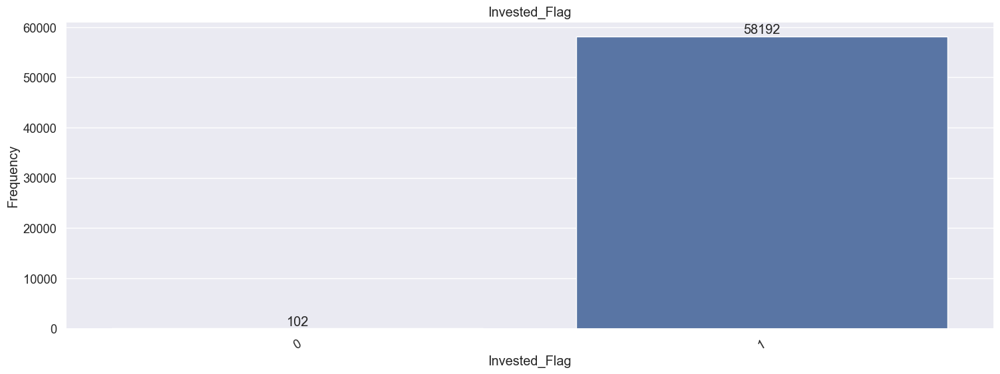

In [189]:
bar_plot('Invested_Flag', train_df)

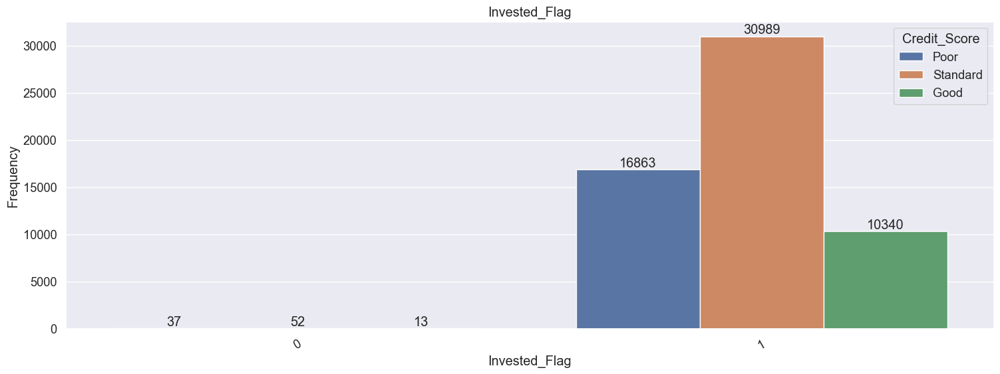

In [190]:
target_bar_plot('Invested_Flag', train_df)

In [191]:
# Drop Amount_invested_monthly from all splits
train_df = train_df.drop('Amount_invested_monthly', axis=1)
val_df = val_df.drop('Amount_invested_monthly', axis=1)
test_df = test_df.drop('Amount_invested_monthly', axis=1)

## Payment_Behaviour

In [192]:
train_df.Payment_Behaviour.unique()

array(['Low_spent_Small_value_payments',
       'High_spent_Medium_value_payments',
       'Low_spent_Medium_value_payments',
       'Low_spent_Large_value_payments',
       'High_spent_Large_value_payments', '!@9#%8',
       'High_spent_Small_value_payments'], dtype=object)

Payment_Behaviour
Low_spent_Small_value_payments      0.257008
High_spent_Medium_value_payments    0.176227
Low_spent_Medium_value_payments     0.137733
High_spent_Large_value_payments     0.136086
High_spent_Small_value_payments     0.113494
Low_spent_Large_value_payments      0.103355
!@9#%8                              0.076097
Name: proportion, dtype: float64


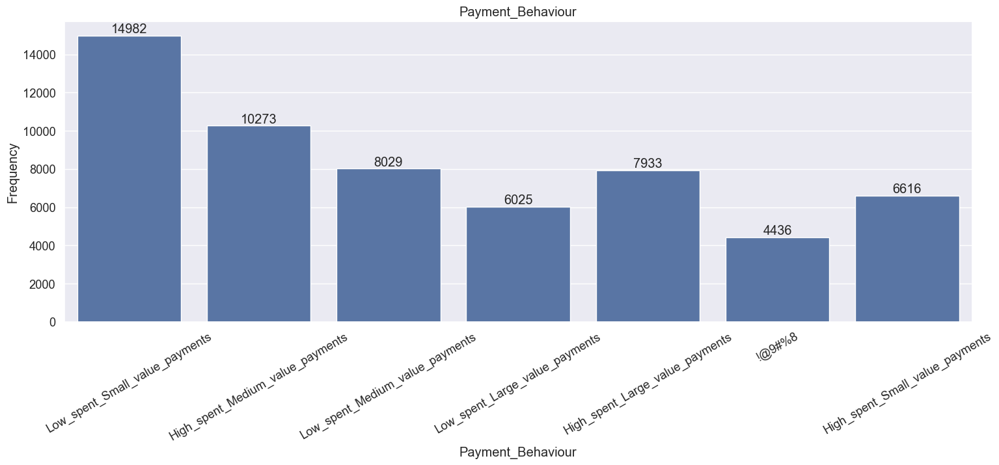

In [193]:
bar_plot('Payment_Behaviour', train_df)

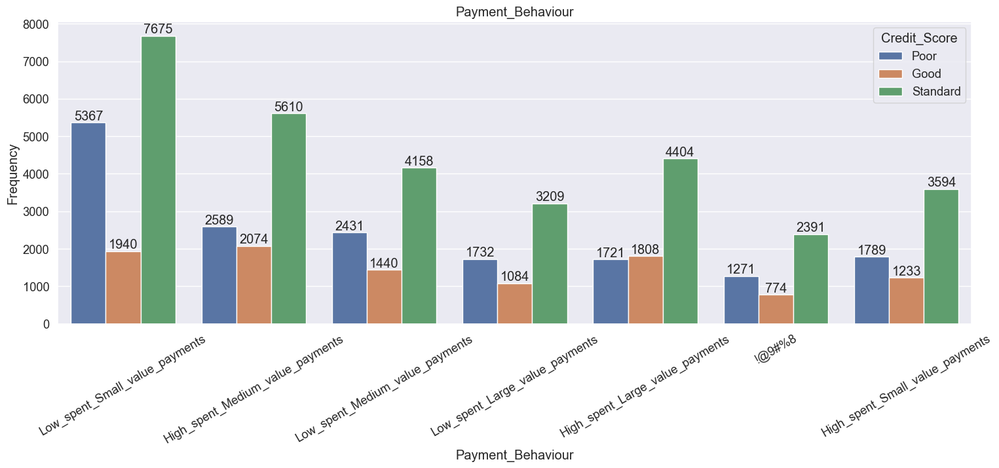

In [194]:
target_bar_plot('Payment_Behaviour', train_df)

## Monthly_Balance

In [195]:
train_df[train_df.Monthly_Balance == '__-333333333333333333333333333__']

,Month,Age,Occupation,Monthly_Inhand_Salary,Num_of_Loan,Delay_from_due_date,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Payment_Behaviour,Monthly_Balance,Credit_Score,Annual_Income_log,Num_Bank_Accounts_Bin,Num_Credit_Card_Bin,Interest_Rate_log,has_payday_loan,has_credit_builder_loan,has_not_specified,has_home_equity_loan,has_student_loan,has_mortgage_loan,has_personal_loan,has_debt_consolidation_loan,has_auto_loan,Num_of_Delayed_Payment_log,Num_Credit_Inquiries_log,Total_EMI_per_month_log,has_EMI,Investor_10000,Amount_invested_monthly_log,Invested_Flag
29158,July,55,Lawyer,2572.410833,2,10,4.21,Good,860.97,40.634250,233.0,No,High_spent_Small_value_payments,__-333333333333333333333333333__,Standard,10.333643,1_account,6_cards,2.564949,1,0,0,1,0,0,0,0,0,1.386294,2.302585,3.800595,1,False,4.382924,1
38622,July,21,Doctor,1471.968333,1,4,10.36,Good,847.03,28.541848,212.0,NM,Low_spent_Small_value_payments,__-333333333333333333333333333__,Standard,9.626984,4_accounts,5_cards,1.386294,0,1,0,0,0,0,0,0,0,1.609438,2.079442,2.391585,1,False,4.866579,1
26177,February,45,Engineer,2551.359167,2,15,7.81,Good,917.00,38.198076,381.0,No,Low_spent_Large_value_payments,__-333333333333333333333333333__,Good,10.299889,3_accounts,4_cards,1.945910,0,0,0,0,1,0,0,0,0,0.000000,1.386294,3.569433,1,False,5.296373,1
5545,February,17,Developer,3660.866667,7,10,17.86,Standard,113.98,34.826541,138.0,Yes,Low_spent_Medium_value_payments,__-333333333333333333333333333__,Standard,10.623457,3_accounts,4_cards,1.945910,0,0,1,1,1,1,1,0,1,2.890372,2.397895,4.987328,1,False,5.308975,1


In [196]:
# Create Negative_Monthly_Balance flag for all splits
train_df['Negative_Monthly_Balance'] = train_df.Monthly_Balance == '__-333333333333333333333333333__'
val_df['Negative_Monthly_Balance'] = val_df.Monthly_Balance == '__-333333333333333333333333333__'
test_df['Negative_Monthly_Balance'] = test_df.Monthly_Balance == '__-333333333333333333333333333__'

In [197]:
# Replace __-333333333333333333333333333__ with NaN for all splits
train_df.Monthly_Balance = train_df.Monthly_Balance.replace('__-333333333333333333333333333__', np.nan)
val_df.Monthly_Balance = val_df.Monthly_Balance.replace('__-333333333333333333333333333__', np.nan)
test_df.Monthly_Balance = test_df.Monthly_Balance.replace('__-333333333333333333333333333__', np.nan)

In [198]:
# Apply astype to all splits
train_df.Monthly_Balance = train_df.Monthly_Balance.astype('float')
val_df.Monthly_Balance = val_df.Monthly_Balance.astype('float')
test_df.Monthly_Balance = test_df.Monthly_Balance.astype('float')

In [199]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 58294 entries, 89385 to 51461
Data columns (total 36 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   Month                        58294 non-null  object  
 1   Age                          58294 non-null  int64   
 2   Occupation                   58294 non-null  object  
 3   Monthly_Inhand_Salary        58294 non-null  float64 
 4   Num_of_Loan                  58294 non-null  int64   
 5   Delay_from_due_date          58294 non-null  int64   
 6   Changed_Credit_Limit         58294 non-null  float64 
 7   Credit_Mix                   58294 non-null  object  
 8   Outstanding_Debt             58294 non-null  float64 
 9   Credit_Utilization_Ratio     58294 non-null  float64 
 10  Credit_History_Age           58294 non-null  float64 
 11  Payment_of_Min_Amount        58294 non-null  object  
 12  Payment_Behaviour            58294 non-null  object  
 13  Mo

In [200]:
# Calculate global median on train set only
global_median = train_df['Monthly_Balance'].median()

# Apply median to train, val, and test sets
train_df['Monthly_Balance'].fillna(global_median, inplace=True)
val_df['Monthly_Balance'].fillna(global_median, inplace=True)
test_df['Monthly_Balance'].fillna(global_median, inplace=True)

# Update df for EDA (combine all sets)
df = pd.concat([train_df, val_df, test_df], ignore_index=True)

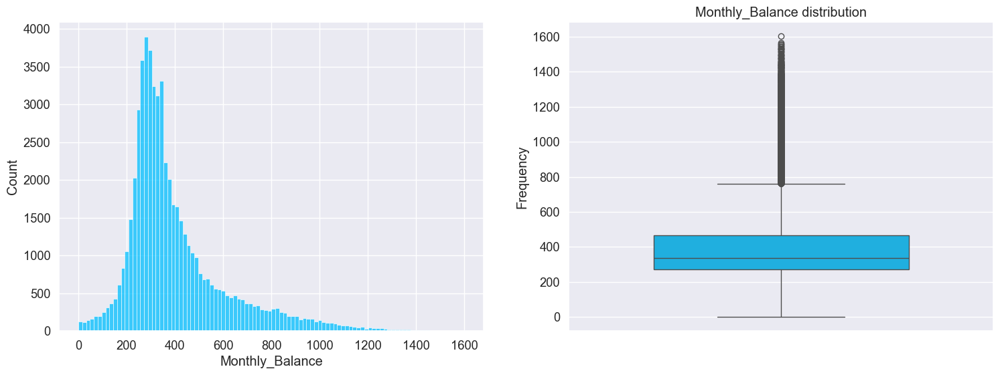

In [201]:
plot_hist('Monthly_Balance', train_df)

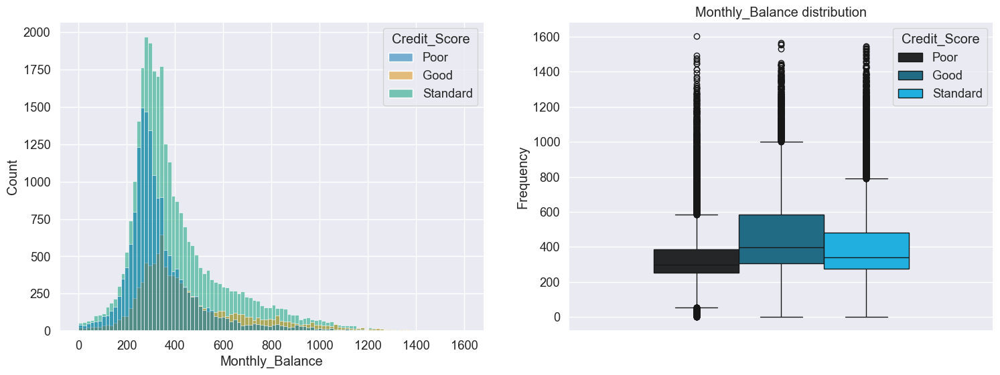

In [202]:
target_hist('Monthly_Balance', train_df)

## Credit_Score

Credit_Score
Standard    0.53249
Poor        0.28991
Good        0.17760
Name: proportion, dtype: float64


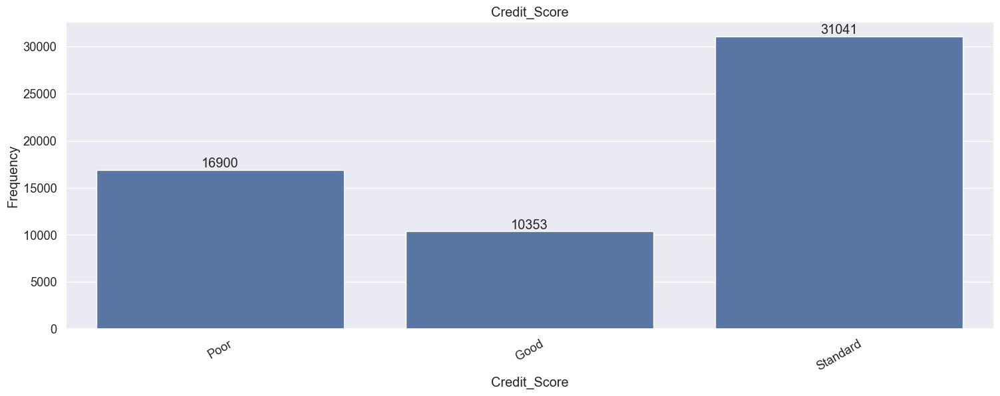

In [203]:
bar_plot("Credit_Score", train_df)

In [204]:
train_df.columns

Index(['Month', 'Age', 'Occupation', 'Monthly_Inhand_Salary', 'Num_of_Loan',
       'Delay_from_due_date', 'Changed_Credit_Limit', 'Credit_Mix',
       'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score', 'Annual_Income_log', 'Num_Bank_Accounts_Bin',
       'Num_Credit_Card_Bin', 'Interest_Rate_log', 'has_payday_loan',
       'has_credit_builder_loan', 'has_not_specified', 'has_home_equity_loan',
       'has_student_loan', 'has_mortgage_loan', 'has_personal_loan',
       'has_debt_consolidation_loan', 'has_auto_loan',
       'Num_of_Delayed_Payment_log', 'Num_Credit_Inquiries_log',
       'Total_EMI_per_month_log', 'has_EMI', 'Investor_10000',
       'Amount_invested_monthly_log', 'Invested_Flag',
       'Negative_Monthly_Balance'],
      dtype='object')

## Advanced Visualizations


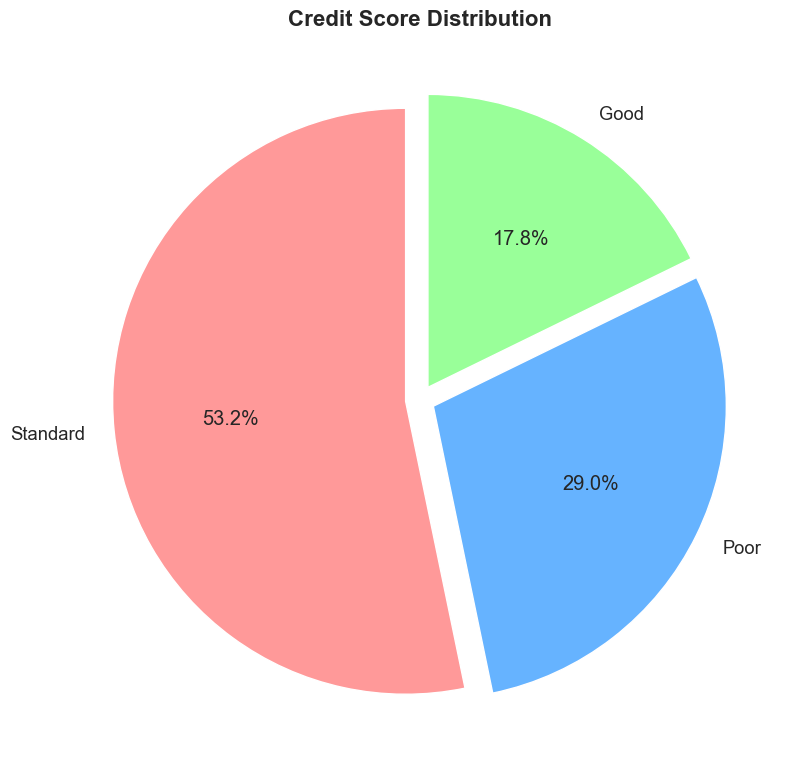

In [205]:
# Pie Chart: Credit Score Distribution
fig, ax = plt.subplots(figsize=(10, 8))
credit_counts = train_df['Credit_Score'].value_counts()
colors = ['#ff9999', '#66b3ff', '#99ff99']
ax.pie(credit_counts.values, labels=credit_counts.index, autopct='%1.1f%%', 
       startangle=90, colors=colors, explode=(0.05, 0.05, 0.05))
ax.set_title('Credit Score Distribution', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


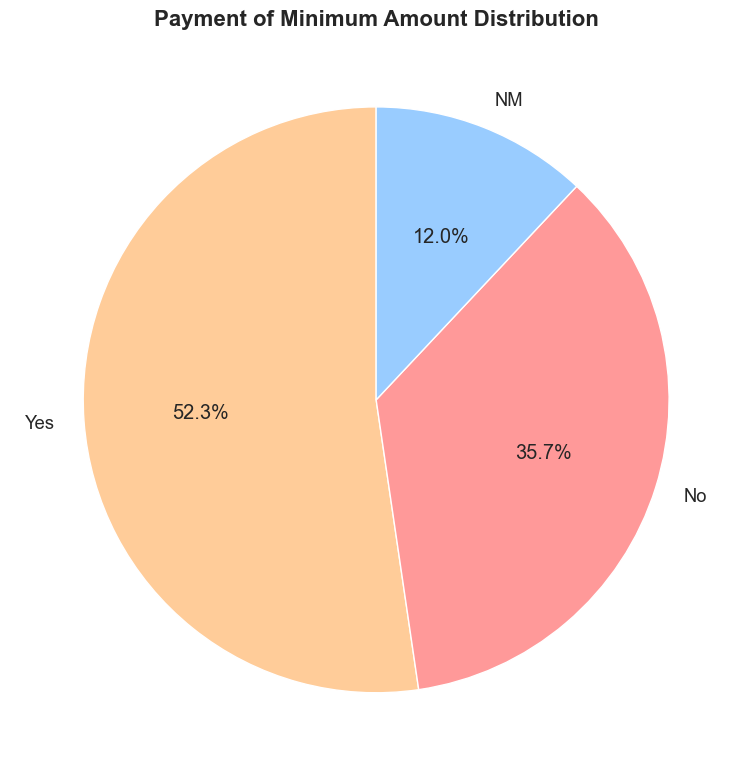

In [206]:
# Pie Chart: Payment of Minimum Amount
fig, ax = plt.subplots(figsize=(10, 8))
payment_counts = train_df['Payment_of_Min_Amount'].value_counts()
colors = ['#ffcc99', '#ff9999', '#99ccff']
ax.pie(payment_counts.values, labels=payment_counts.index, autopct='%1.1f%%',
       startangle=90, colors=colors)
ax.set_title('Payment of Minimum Amount Distribution', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


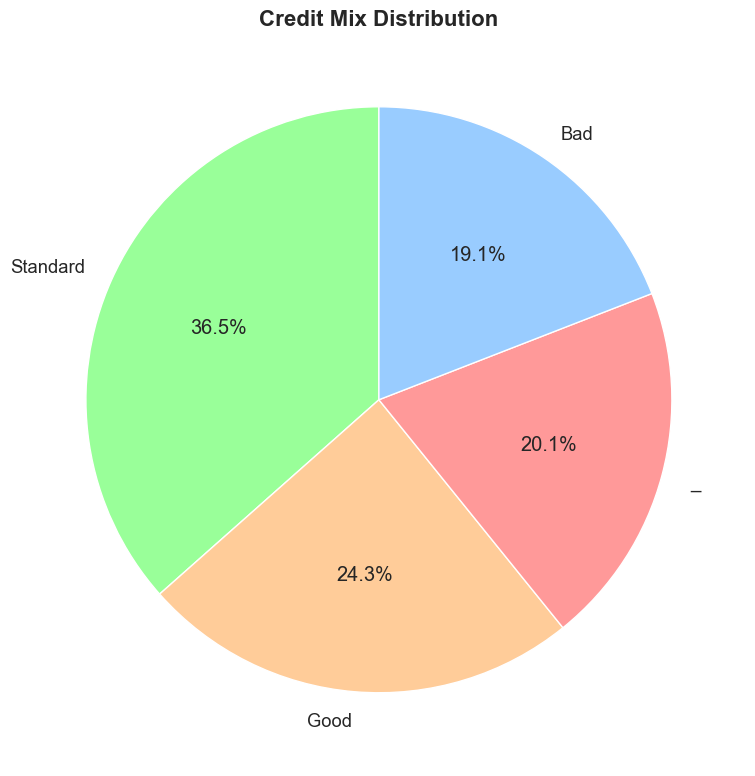

In [207]:
# Pie Chart: Credit Mix
fig, ax = plt.subplots(figsize=(10, 8))
credit_mix_counts = train_df['Credit_Mix'].value_counts()
colors = ['#99ff99', '#ffcc99', '#ff9999', '#99ccff']
ax.pie(credit_mix_counts.values, labels=credit_mix_counts.index, autopct='%1.1f%%',
       startangle=90, colors=colors[:len(credit_mix_counts)])
ax.set_title('Credit Mix Distribution', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


### Violin Plots


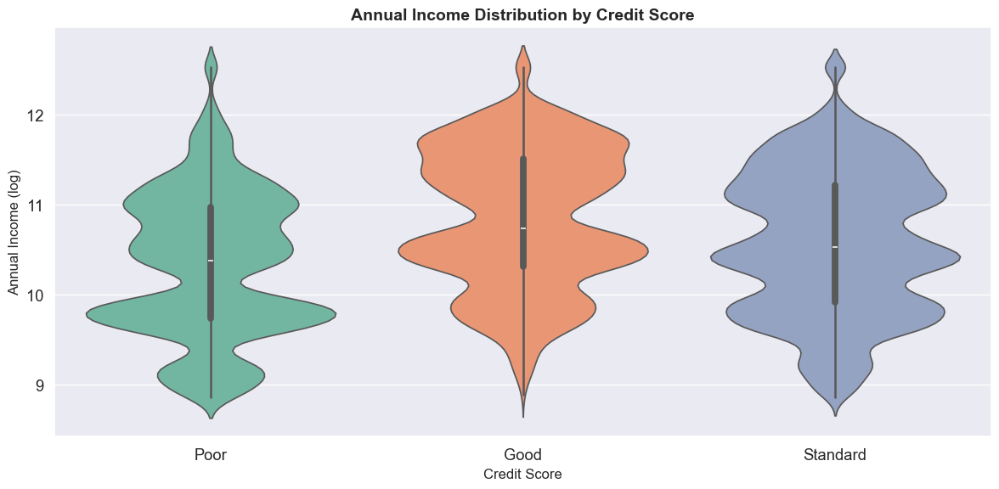

In [208]:
# Violin Plot: Annual Income by Credit Score
fig, ax = plt.subplots(figsize=(12, 6))
sns.violinplot(data=train_df, x='Credit_Score', y='Annual_Income_log', 
               palette='Set2', inner='box')
ax.set_title('Annual Income Distribution by Credit Score', fontsize=14, fontweight='bold')
ax.set_xlabel('Credit Score', fontsize=12)
ax.set_ylabel('Annual Income (log)', fontsize=12)
plt.tight_layout()
plt.show()


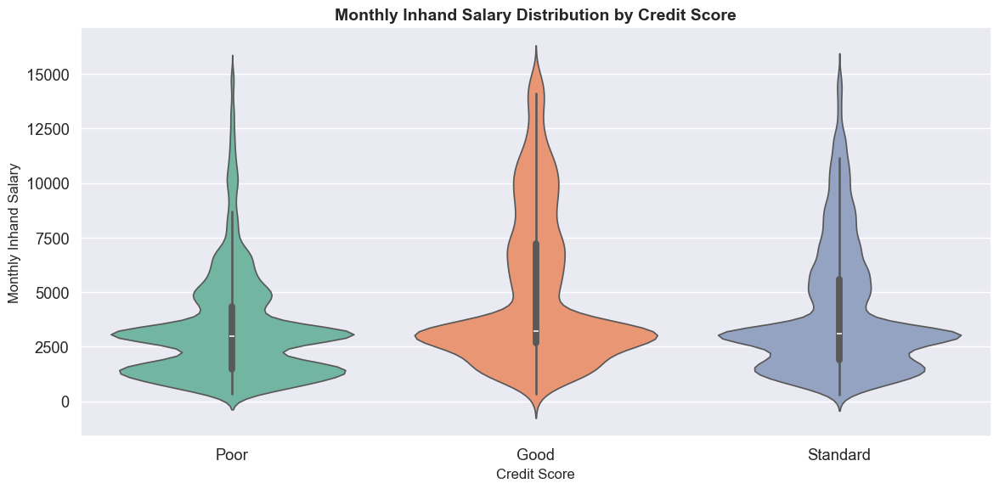

In [209]:
# Violin Plot: Monthly Inhand Salary by Credit Score
fig, ax = plt.subplots(figsize=(12, 6))
sns.violinplot(data=train_df, x='Credit_Score', y='Monthly_Inhand_Salary', 
               palette='Set2', inner='box')
ax.set_title('Monthly Inhand Salary Distribution by Credit Score', fontsize=14, fontweight='bold')
ax.set_xlabel('Credit Score', fontsize=12)
ax.set_ylabel('Monthly Inhand Salary', fontsize=12)
plt.tight_layout()
plt.show()


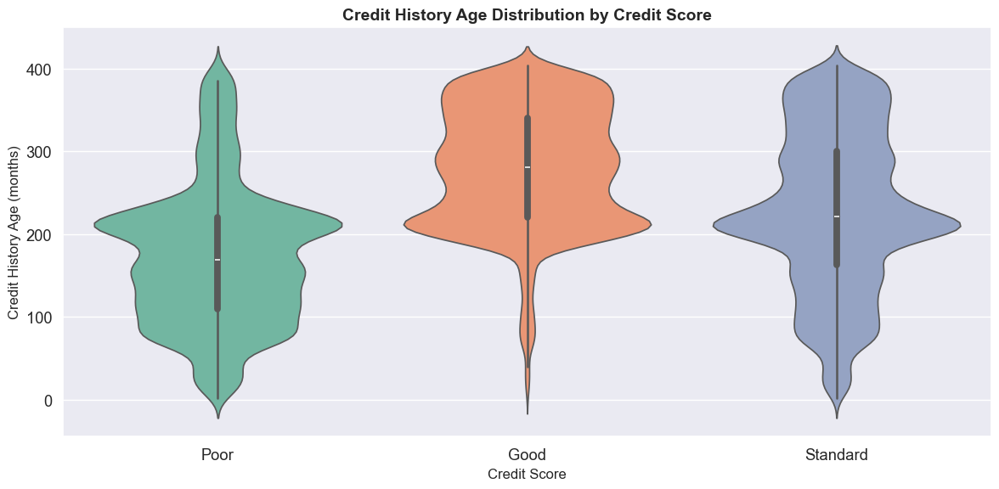

In [210]:
# Violin Plot: Credit History Age by Credit Score
fig, ax = plt.subplots(figsize=(12, 6))
sns.violinplot(data=train_df, x='Credit_Score', y='Credit_History_Age', 
               palette='Set2', inner='box')
ax.set_title('Credit History Age Distribution by Credit Score', fontsize=14, fontweight='bold')
ax.set_xlabel('Credit Score', fontsize=12)
ax.set_ylabel('Credit History Age (months)', fontsize=12)
plt.tight_layout()
plt.show()


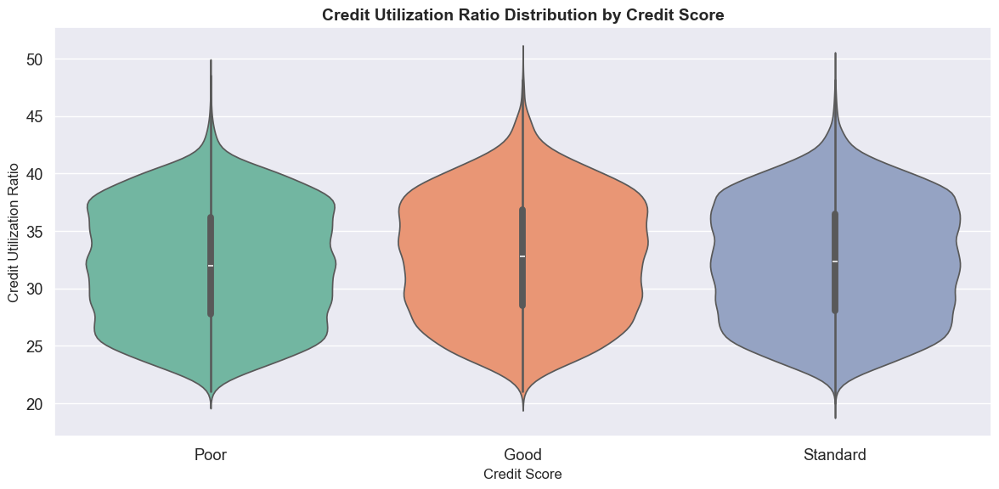

In [211]:
# Violin Plot: Credit Utilization Ratio by Credit Score
fig, ax = plt.subplots(figsize=(12, 6))
sns.violinplot(data=train_df, x='Credit_Score', y='Credit_Utilization_Ratio', 
               palette='Set2', inner='box')
ax.set_title('Credit Utilization Ratio Distribution by Credit Score', fontsize=14, fontweight='bold')
ax.set_xlabel('Credit Score', fontsize=12)
ax.set_ylabel('Credit Utilization Ratio', fontsize=12)
plt.tight_layout()
plt.show()


### Pairplot


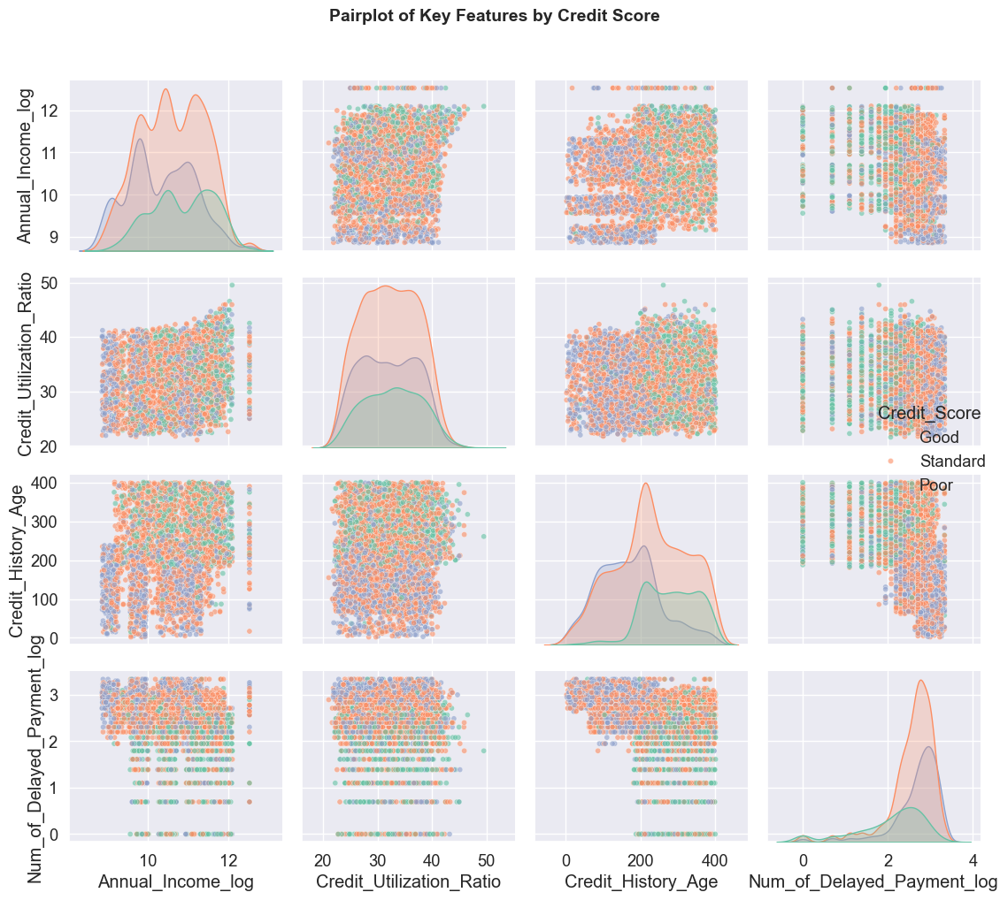

In [212]:
# Pairplot: Key Numerical Features
key_features = ['Annual_Income_log', 'Credit_Utilization_Ratio', 
                'Credit_History_Age', 'Num_of_Delayed_Payment_log', 'Credit_Score']

# Sample data for pairplot (to avoid long computation time)
sample_size = min(5000, len(train_df))
pairplot_df = train_df[key_features].sample(n=sample_size, random_state=42)

pairplot = sns.pairplot(pairplot_df, hue='Credit_Score', palette='Set2', 
                        diag_kind='kde', plot_kws={'alpha': 0.6, 's': 20})
pairplot.fig.suptitle('Pairplot of Key Features by Credit Score', y=1.02, fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


### Scatter Plots


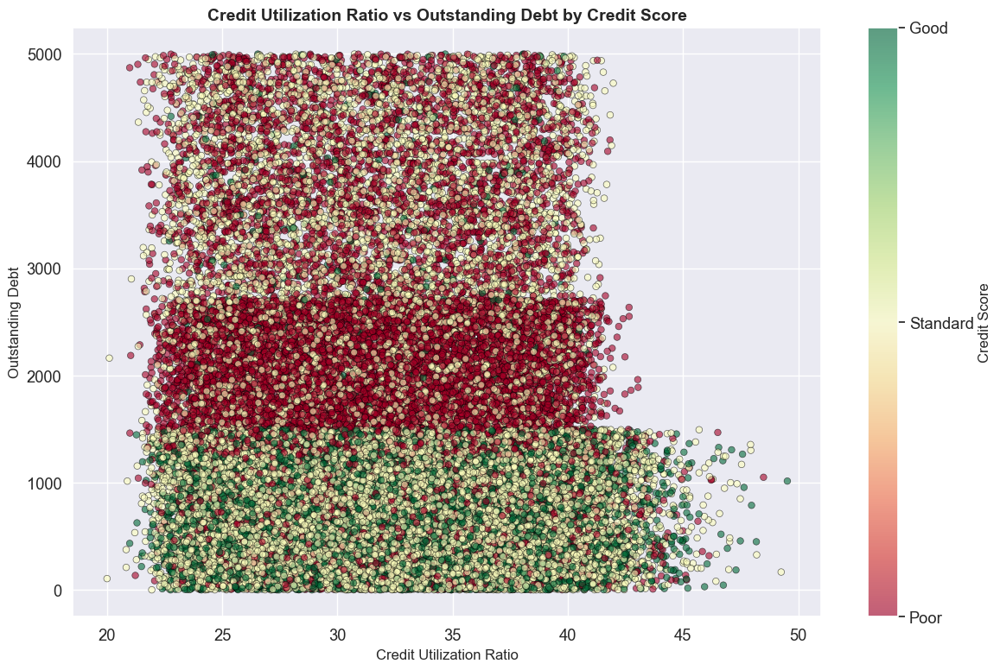

In [213]:
# Scatter Plot: Credit Utilization Ratio vs Outstanding Debt
fig, ax = plt.subplots(figsize=(12, 8))
scatter = ax.scatter(train_df['Credit_Utilization_Ratio'], train_df['Outstanding_Debt'], 
                     c=train_df['Credit_Score'].map({'Poor': 0, 'Standard': 1, 'Good': 2}),
                     cmap='RdYlGn', alpha=0.6, s=30, edgecolors='black', linewidth=0.5)
ax.set_xlabel('Credit Utilization Ratio', fontsize=12)
ax.set_ylabel('Outstanding Debt', fontsize=12)
ax.set_title('Credit Utilization Ratio vs Outstanding Debt by Credit Score', fontsize=14, fontweight='bold')
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Credit Score', fontsize=12)
cbar.set_ticks([0, 1, 2])
cbar.set_ticklabels(['Poor', 'Standard', 'Good'])
plt.tight_layout()
plt.show()


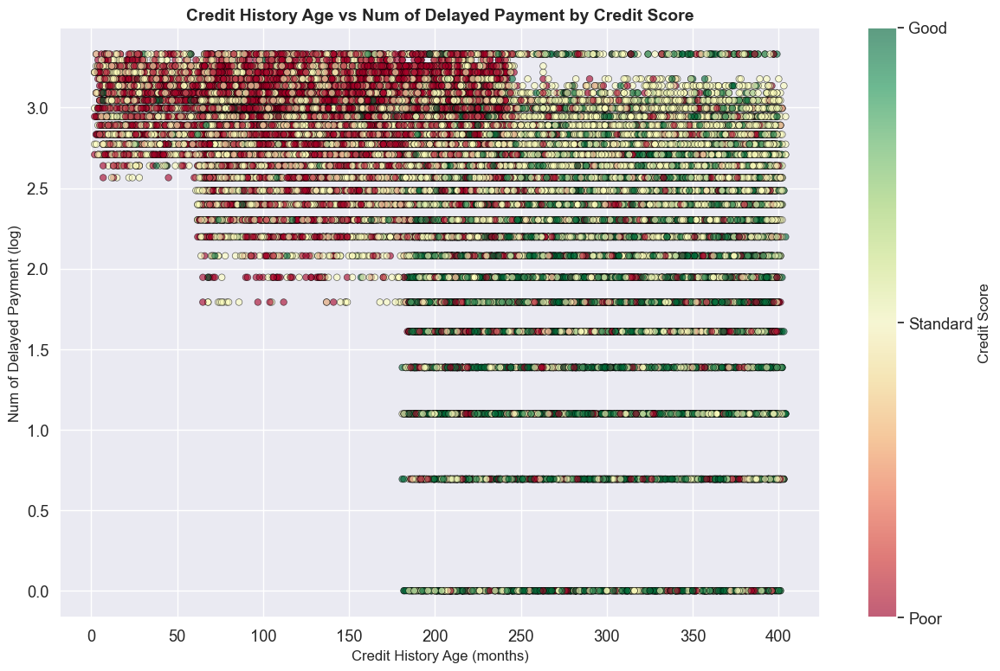

In [214]:
# Scatter Plot: Credit History Age vs Num of Delayed Payment
fig, ax = plt.subplots(figsize=(12, 8))
scatter = ax.scatter(train_df['Credit_History_Age'], train_df['Num_of_Delayed_Payment_log'], 
                     c=train_df['Credit_Score'].map({'Poor': 0, 'Standard': 1, 'Good': 2}),
                     cmap='RdYlGn', alpha=0.6, s=30, edgecolors='black', linewidth=0.5)
ax.set_xlabel('Credit History Age (months)', fontsize=12)
ax.set_ylabel('Num of Delayed Payment (log)', fontsize=12)
ax.set_title('Credit History Age vs Num of Delayed Payment by Credit Score', fontsize=14, fontweight='bold')
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Credit Score', fontsize=12)
cbar.set_ticks([0, 1, 2])
cbar.set_ticklabels(['Poor', 'Standard', 'Good'])
plt.tight_layout()
plt.show()


### Correlation Matrix


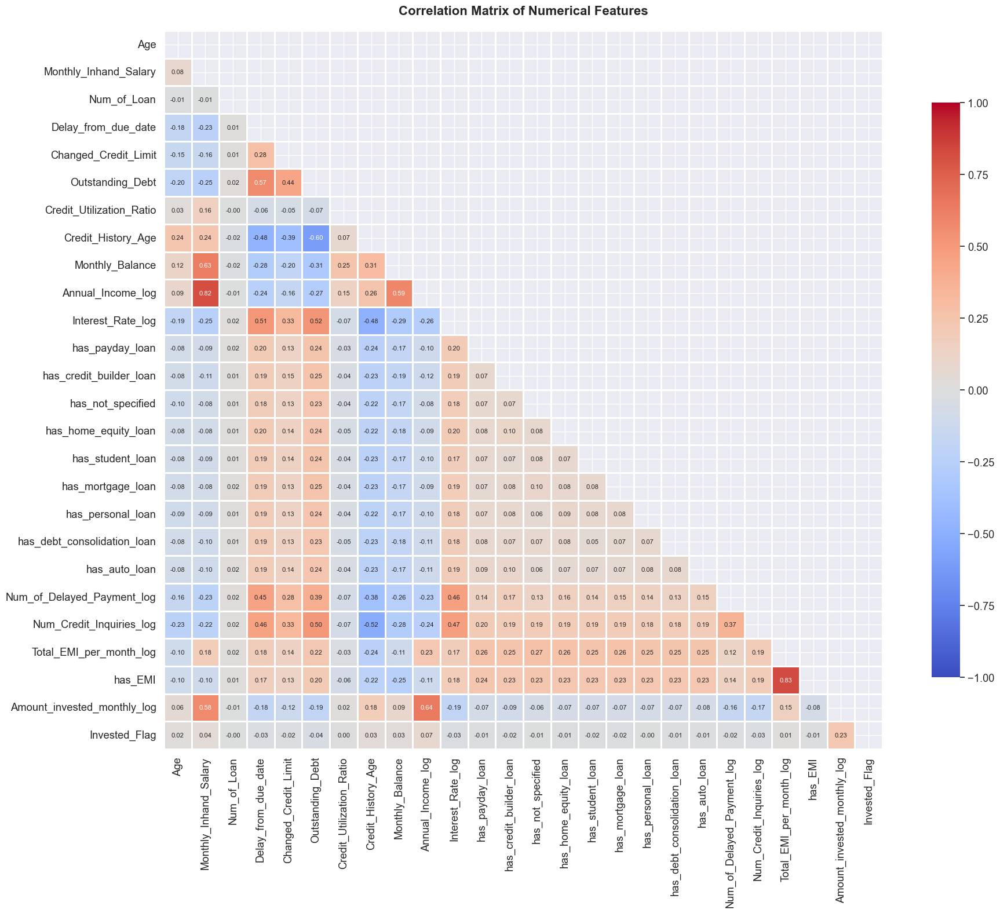

In [215]:
# Select numerical columns for correlation matrix
numerical_cols = train_df.select_dtypes(include=[np.number]).columns.tolist()
# Remove target if it's encoded as numbers
if 'Credit_Score' in numerical_cols:
    numerical_cols.remove('Credit_Score')

# Calculate correlation matrix
corr_matrix = train_df[numerical_cols].corr()

# Create heatmap
plt.figure(figsize=(20, 16))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))  # Mask upper triangle
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt='.2f', cmap='coolwarm', 
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8},
            vmin=-1, vmax=1, annot_kws={'size': 8})
plt.title('Correlation Matrix of Numerical Features', fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()


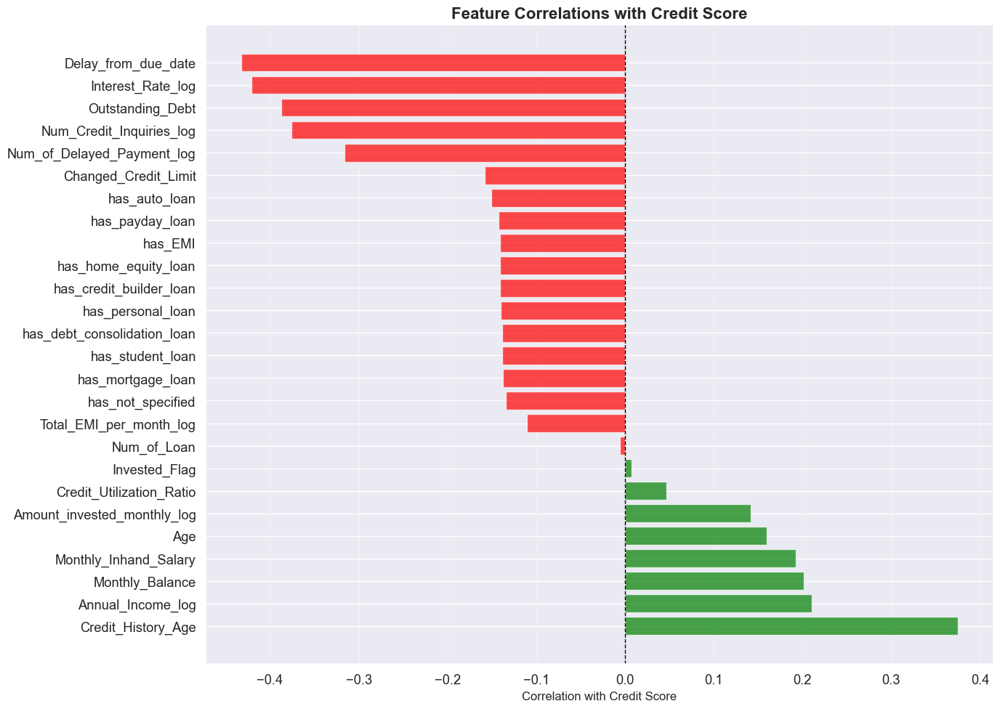

Top 10 features most correlated with Credit Score:
Credit_History_Age             0.374575
Annual_Income_log              0.210231
Monthly_Balance                0.201336
Monthly_Inhand_Salary          0.192693
Age                            0.159376
Amount_invested_monthly_log    0.141546
Credit_Utilization_Ratio       0.046688
Invested_Flag                  0.007634
Num_of_Loan                   -0.006106
Total_EMI_per_month_log       -0.110987
dtype: float64


In [216]:
# Correlation with Credit Score (if encoded)
# Encode Credit_Score for correlation
credit_score_encoded = train_df['Credit_Score'].map({'Poor': 0, 'Standard': 1, 'Good': 2})

# Calculate correlations with target
corr_with_target = train_df[numerical_cols].apply(lambda x: x.corr(credit_score_encoded))
corr_with_target = corr_with_target.sort_values(ascending=False)

# Create bar plot of correlations with target
plt.figure(figsize=(14, 10))
colors = ['red' if x < 0 else 'green' for x in corr_with_target.values]
plt.barh(range(len(corr_with_target)), corr_with_target.values, color=colors, alpha=0.7)
plt.yticks(range(len(corr_with_target)), corr_with_target.index)
plt.xlabel('Correlation with Credit Score', fontsize=12)
plt.title('Feature Correlations with Credit Score', fontsize=16, fontweight='bold')
plt.axvline(x=0, color='black', linestyle='--', linewidth=1)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

print("Top 10 features most correlated with Credit Score:")
print(corr_with_target.head(10))


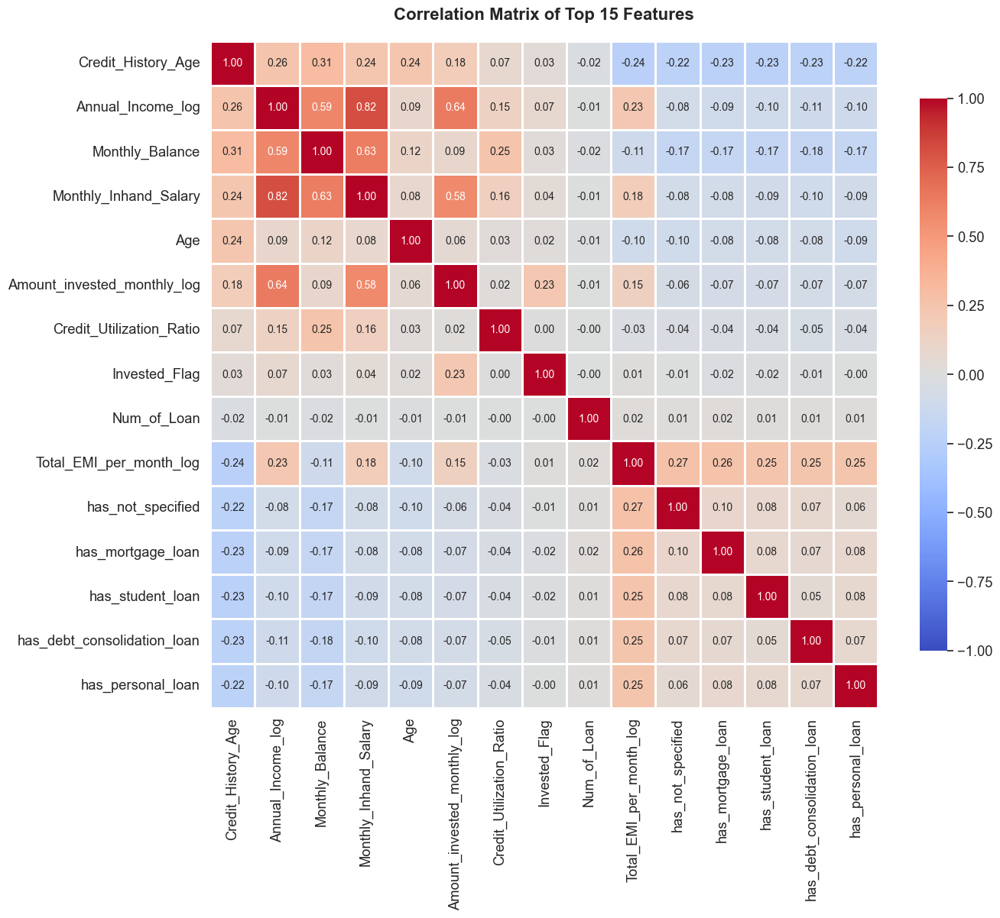

In [217]:
# Focused correlation heatmap for top features
top_features = corr_with_target.head(15).index.tolist()
top_corr = train_df[top_features].corr()

plt.figure(figsize=(14, 12))
sns.heatmap(top_corr, annot=True, fmt='.2f', cmap='coolwarm', 
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8},
            vmin=-1, vmax=1, annot_kws={'size': 10})
plt.title('Correlation Matrix of Top 15 Features', fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()


### Distribution Comparisons (KDE Plots)


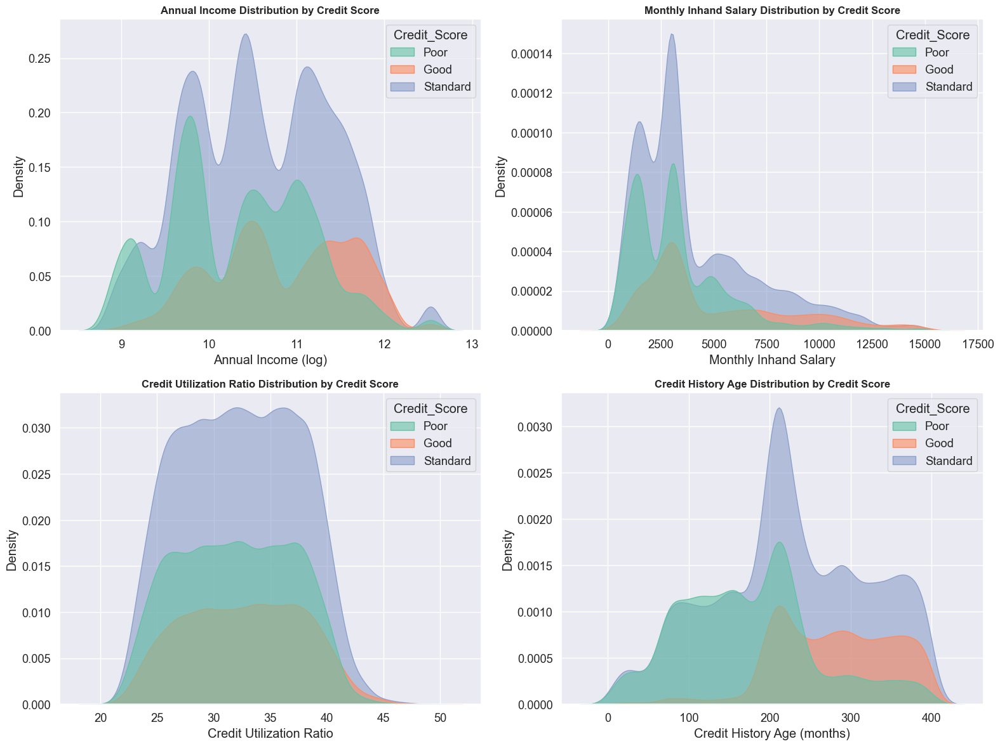

In [218]:
# KDE Plot: Distribution of Key Features by Credit Score
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Annual Income
sns.kdeplot(data=train_df, x='Annual_Income_log', hue='Credit_Score', 
           palette='Set2', ax=axes[0, 0], fill=True, alpha=0.6)
axes[0, 0].set_title('Annual Income Distribution by Credit Score', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Annual Income (log)')

# Monthly Inhand Salary
sns.kdeplot(data=train_df, x='Monthly_Inhand_Salary', hue='Credit_Score', 
           palette='Set2', ax=axes[0, 1], fill=True, alpha=0.6)
axes[0, 1].set_title('Monthly Inhand Salary Distribution by Credit Score', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Monthly Inhand Salary')

# Credit Utilization Ratio
sns.kdeplot(data=train_df, x='Credit_Utilization_Ratio', hue='Credit_Score', 
           palette='Set2', ax=axes[1, 0], fill=True, alpha=0.6)
axes[1, 0].set_title('Credit Utilization Ratio Distribution by Credit Score', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Credit Utilization Ratio')

# Credit History Age
sns.kdeplot(data=train_df, x='Credit_History_Age', hue='Credit_Score', 
           palette='Set2', ax=axes[1, 1], fill=True, alpha=0.6)
axes[1, 1].set_title('Credit History Age Distribution by Credit Score', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Credit History Age (months)')

plt.tight_layout()
plt.show()


### Feature Interaction Analysis


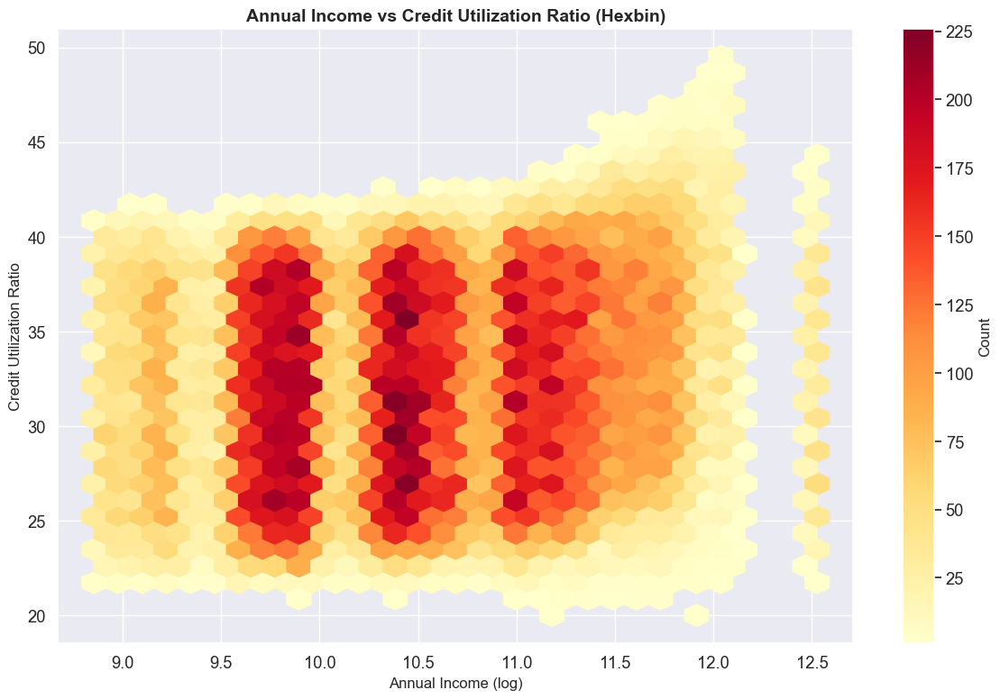

In [219]:
# Hexbin Plot: Annual Income vs Credit Utilization Ratio
fig, ax = plt.subplots(figsize=(12, 8))
hb = ax.hexbin(train_df['Annual_Income_log'], train_df['Credit_Utilization_Ratio'], 
               gridsize=30, cmap='YlOrRd', mincnt=1)
ax.set_xlabel('Annual Income (log)', fontsize=12)
ax.set_ylabel('Credit Utilization Ratio', fontsize=12)
ax.set_title('Annual Income vs Credit Utilization Ratio (Hexbin)', fontsize=14, fontweight='bold')
cb = plt.colorbar(hb, ax=ax)
cb.set_label('Count', fontsize=12)
plt.tight_layout()
plt.show()


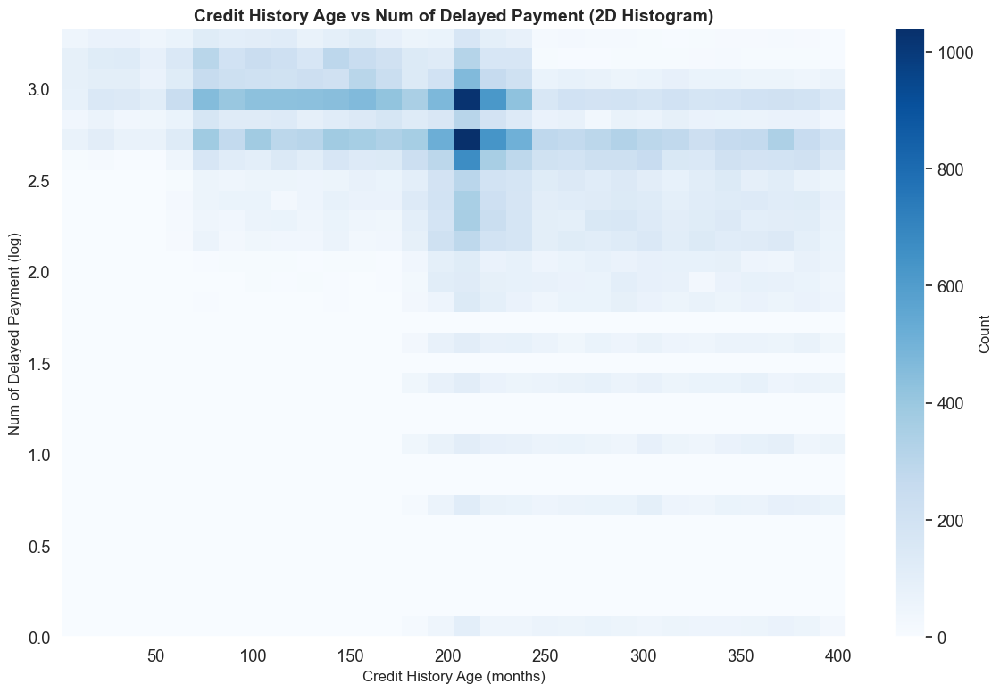

In [220]:
# 2D Histogram: Credit History Age vs Num of Delayed Payment
fig, ax = plt.subplots(figsize=(12, 8))
h = ax.hist2d(train_df['Credit_History_Age'], train_df['Num_of_Delayed_Payment_log'], 
             bins=30, cmap='Blues')
ax.set_xlabel('Credit History Age (months)', fontsize=12)
ax.set_ylabel('Num of Delayed Payment (log)', fontsize=12)
ax.set_title('Credit History Age vs Num of Delayed Payment (2D Histogram)', fontsize=14, fontweight='bold')
cb = plt.colorbar(h[3], ax=ax)
cb.set_label('Count', fontsize=12)
plt.tight_layout()
plt.show()


### Occupation Analysis


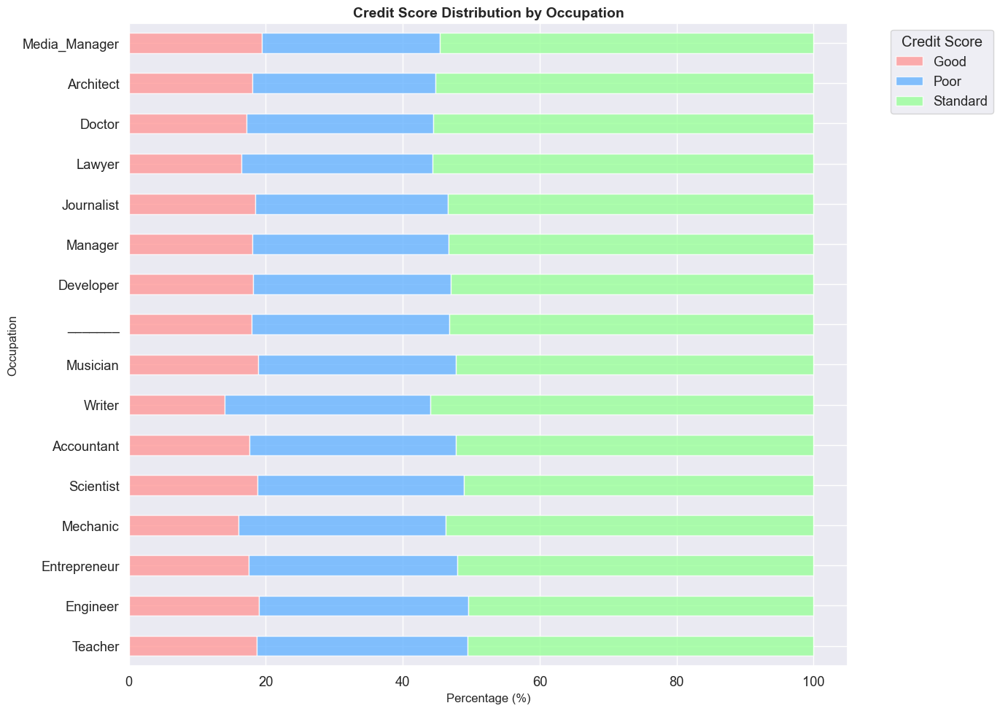

In [221]:
# Credit Score distribution by Occupation
occupation_credit = pd.crosstab(train_df['Occupation'], train_df['Credit_Score'], normalize='index') * 100

# Sort by Poor credit percentage
occupation_credit_sorted = occupation_credit.sort_values('Poor', ascending=False)

# Create horizontal stacked bar chart
fig, ax = plt.subplots(figsize=(14, 10))
occupation_credit_sorted.plot(kind='barh', stacked=True, ax=ax, 
                              color=['#ff9999', '#66b3ff', '#99ff99'], alpha=0.8)
ax.set_title('Credit Score Distribution by Occupation', fontsize=14, fontweight='bold')
ax.set_xlabel('Percentage (%)', fontsize=12)
ax.set_ylabel('Occupation', fontsize=12)
ax.legend(title='Credit Score', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### Feature Importance from Correlation


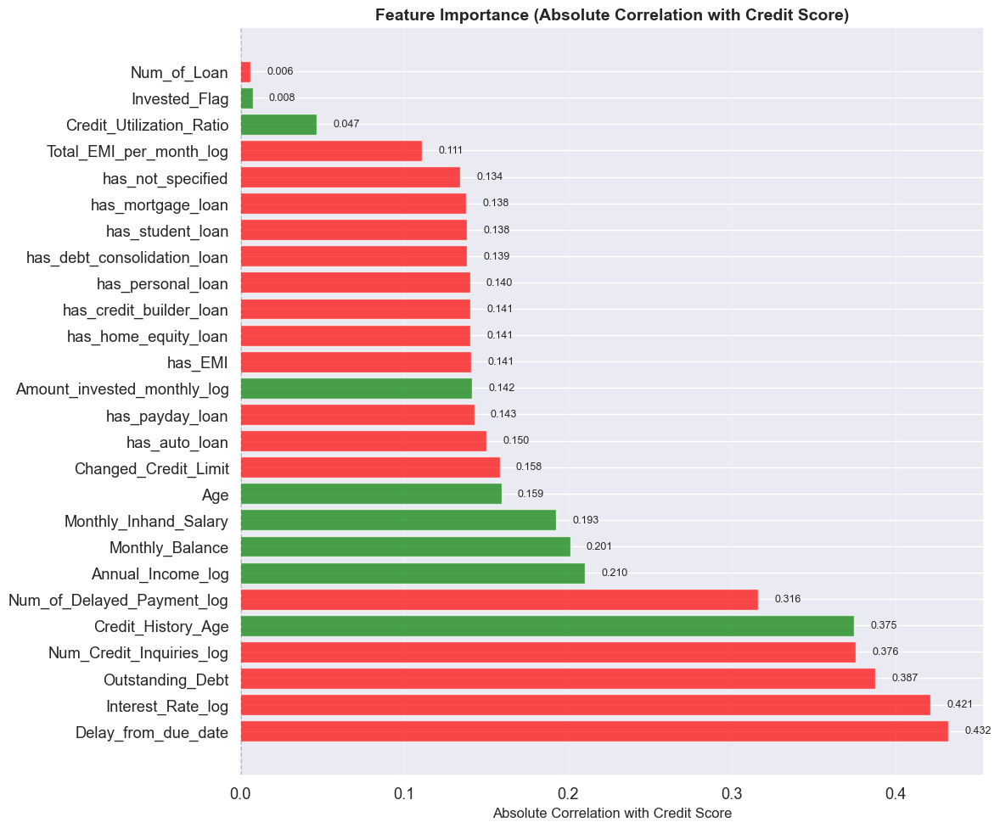


Top 15 Most Important Features:
Delay_from_due_date            0.432224
Interest_Rate_log              0.421331
Outstanding_Debt               0.387347
Num_Credit_Inquiries_log       0.375583
Credit_History_Age             0.374575
Num_of_Delayed_Payment_log     0.316026
Annual_Income_log              0.210231
Monthly_Balance                0.201336
Monthly_Inhand_Salary          0.192693
Age                            0.159376
Changed_Credit_Limit           0.158349
has_auto_loan                  0.150371
has_payday_loan                0.142741
Amount_invested_monthly_log    0.141546
has_EMI                        0.140954
dtype: float64


In [222]:
# Feature importance based on absolute correlation with Credit Score
feature_importance = corr_with_target.abs().sort_values(ascending=False)

# Create a more detailed feature importance plot
fig, ax = plt.subplots(figsize=(12, 10))
colors = ['red' if corr_with_target[feat] < 0 else 'green' for feat in feature_importance.index]
bars = ax.barh(range(len(feature_importance)), feature_importance.values, color=colors, alpha=0.7)
ax.set_yticks(range(len(feature_importance)))
ax.set_yticklabels(feature_importance.index)
ax.set_xlabel('Absolute Correlation with Credit Score', fontsize=12)
ax.set_title('Feature Importance (Absolute Correlation with Credit Score)', fontsize=14, fontweight='bold')
ax.axvline(x=0, color='black', linestyle='--', linewidth=1)
ax.grid(axis='x', alpha=0.3)

# Add value labels on bars
for i, (idx, val) in enumerate(feature_importance.items()):
    ax.text(val + 0.01, i, f'{val:.3f}', va='center', fontsize=9)

plt.tight_layout()
plt.show()

print("\nTop 15 Most Important Features:")
print(feature_importance.head(15))


### Summary Insights


In [223]:
# Key insights summary
print("=" * 80)
print("KEY INSIGHTS FROM ADVANCED ANALYSIS")
print("=" * 80)

print("\n1. CREDIT SCORE DISTRIBUTION:")
print(f"   - Standard: {train_df['Credit_Score'].value_counts(normalize=True)['Standard']*100:.2f}%")
print(f"   - Poor: {train_df['Credit_Score'].value_counts(normalize=True)['Poor']*100:.2f}%")
print(f"   - Good: {train_df['Credit_Score'].value_counts(normalize=True)['Good']*100:.2f}%")

print("\n2. TOP 5 FEATURES MOST CORRELATED WITH CREDIT SCORE:")
for i, (feat, corr) in enumerate(corr_with_target.head(5).items(), 1):
    print(f"   {i}. {feat}: {corr:.4f}")

print("\n3. OCCUPATION WITH BEST CREDIT SCORES:")
occ_means = train_df.groupby('Occupation')['Credit_Score'].apply(
    lambda x: (x == 'Good').sum() / len(x) * 100
).sort_values(ascending=False)
for occ, pct in occ_means.head(3).items():
    print(f"   - {occ}: {pct:.2f}% have Good credit score")

print("\n4. PAYMENT BEHAVIOUR WITH BEST CREDIT SCORES:")
payment_means = train_df.groupby('Payment_Behaviour')['Credit_Score'].apply(
    lambda x: (x == 'Good').sum() / len(x) * 100
).sort_values(ascending=False)
for payment, pct in payment_means.head(3).items():
    print(f"   - {payment}: {pct:.2f}% have Good credit score")

print("\n" + "=" * 80)


KEY INSIGHTS FROM ADVANCED ANALYSIS

1. CREDIT SCORE DISTRIBUTION:
   - Standard: 53.25%
   - Poor: 28.99%
   - Good: 17.76%

2. TOP 5 FEATURES MOST CORRELATED WITH CREDIT SCORE:
   1. Credit_History_Age: 0.3746
   2. Annual_Income_log: 0.2102
   3. Monthly_Balance: 0.2013
   4. Monthly_Inhand_Salary: 0.1927
   5. Age: 0.1594

3. OCCUPATION WITH BEST CREDIT SCORES:
   - Media_Manager: 19.45% have Good credit score
   - Engineer: 18.95% have Good credit score
   - Musician: 18.84% have Good credit score

4. PAYMENT BEHAVIOUR WITH BEST CREDIT SCORES:
   - High_spent_Large_value_payments: 22.79% have Good credit score
   - High_spent_Medium_value_payments: 20.19% have Good credit score
   - High_spent_Small_value_payments: 18.64% have Good credit score



# Feature Selection: Statistical Hypothesis Testing


In [224]:
from scipy.stats import chi2_contingency, f_oneway
from scipy import stats

def chi_2_test(df, target='Credit_Score', alpha_level=0.05):
    """
    Feature Selection: Statistical Hypothesis Testing
    
    This function performs Chi-Square tests for categorical columns and F-tests (ANOVA) for numerical columns
    to assess their relationship with the target variable. This helps in feature selection by identifying
    which features have statistically significant relationships with the target.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        DataFrame containing the data (should be training data only to avoid data leakage)
    target : str
        Name of the target variable column
    alpha_level : float
        Significance level (default: 0.05)
    
    Returns:
    --------
    results_df : pandas.DataFrame
        DataFrame containing test results with columns:
        - Column: feature name
        - Type: 'Categorical' or 'Numerical'
        - Test: 'Chi-Square' or 'F-Test'
        - Statistic: test statistic value
        - P-value: p-value of the test
        - Significant: True if p-value < alpha_level (feature is significant for prediction)
    """
    # Create a copy to avoid modifying original
    df_test = df.copy()
    
    # Separate target and features
    y = df_test[target]
    X = df_test.drop(columns=[target])
    
    # Select categorical and numerical columns
    categorical_cols = X.select_dtypes(include=['object', 'category']).columns.tolist()
    numerical_cols = X.select_dtypes(include=[np.number]).columns.tolist()
    
    # Initialize results storage
    results = []
    
    # Chi-Square tests for categorical columns
    for col in categorical_cols:
        try:
            # Create contingency table
            contingency_table = pd.crosstab(df_test[col], y)
            
            # Perform Chi-Square test
            chi2, p_value, dof, expected = chi2_contingency(contingency_table)
            
            results.append({
                'Column': col,
                'Type': 'Categorical',
                'Test': 'Chi-Square',
                'Statistic': chi2,
                'P-value': p_value,
                'Significant': p_value < alpha_level,
                'Degrees_of_Freedom': dof
            })
        except Exception as e:
            results.append({
                'Column': col,
                'Type': 'Categorical',
                'Test': 'Chi-Square',
                'Statistic': np.nan,
                'P-value': np.nan,
                'Significant': False,
                'Degrees_of_Freedom': np.nan,
                'Error': str(e)
            })
    
    # F-tests (ANOVA) for numerical columns
    for col in numerical_cols:
        try:
            # Group data by target variable
            groups = [df_test[df_test[target] == category][col].values 
                     for category in y.unique()]
            
            # Remove groups with insufficient data
            groups = [g for g in groups if len(g) > 0]
            
            if len(groups) >= 2:
                # Perform F-test (ANOVA)
                f_statistic, p_value = f_oneway(*groups)
                
                results.append({
                    'Column': col,
                    'Type': 'Numerical',
                    'Test': 'F-Test',
                    'Statistic': f_statistic,
                    'P-value': p_value,
                    'Significant': p_value < alpha_level
                })
            else:
                results.append({
                    'Column': col,
                    'Type': 'Numerical',
                    'Test': 'F-Test',
                    'Statistic': np.nan,
                    'P-value': np.nan,
                    'Significant': False,
                    'Error': 'Insufficient groups'
                })
        except Exception as e:
            results.append({
                'Column': col,
                'Type': 'Numerical',
                'Test': 'F-Test',
                'Statistic': np.nan,
                'P-value': np.nan,
                'Significant': False,
                'Error': str(e)
            })
    
    # Convert to DataFrame
    results_df = pd.DataFrame(results)
    
    return results_df

# Perform feature selection analysis using statistical hypothesis testing on training data
print("Feature Selection: Statistical Hypothesis Testing")
print("=" * 80)
print("Performing Chi-Square tests (categorical) and F-tests/ANOVA (numerical) on training data...")
print("=" * 80)
feature_selection_results = chi_2_test(train_df, target='Credit_Score', alpha_level=0.05)

# Display results
print("\nFeature Selection Results (Hypothesis Testing):")
print("=" * 80)
print(feature_selection_results.to_string(index=False))


Feature Selection: Statistical Hypothesis Testing
Performing Chi-Square tests (categorical) and F-tests/ANOVA (numerical) on training data...

Feature Selection Results (Hypothesis Testing):
                     Column        Type       Test    Statistic       P-value  Significant  Degrees_of_Freedom
                      Month Categorical Chi-Square   130.652270  5.052851e-21         True                14.0
                 Occupation Categorical Chi-Square   129.599198  2.415276e-14         True                30.0
                 Credit_Mix Categorical Chi-Square 18497.072539  0.000000e+00         True                 6.0
      Payment_of_Min_Amount Categorical Chi-Square 11296.650924  0.000000e+00         True                 4.0
          Payment_Behaviour Categorical Chi-Square   824.929833 7.443899e-169         True                12.0
      Num_Bank_Accounts_Bin Categorical Chi-Square 11951.687584  0.000000e+00         True                22.0
        Num_Credit_Card_Bin Cate

In [225]:
# Summary of significant features for feature selection
significant_features = feature_selection_results[feature_selection_results['Significant'] == True]
print(f"\nFeature Selection Summary:")
print(f"Significant Features (p-value < 0.05): {len(significant_features)} out of {len(feature_selection_results)}")
print("=" * 80)
print("\nSelected Categorical Features (Chi-Square Test - Statistically Significant):")
cat_sig = significant_features[significant_features['Type'] == 'Categorical']
print(f"Count: {len(cat_sig)}")
if len(cat_sig) > 0:
    print(cat_sig[['Column', 'Statistic', 'P-value']].to_string(index=False))

print("\nSelected Numerical Features (F-Test - Statistically Significant):")
num_sig = significant_features[significant_features['Type'] == 'Numerical']
print(f"Count: {len(num_sig)}")
if len(num_sig) > 0:
    print(num_sig[['Column', 'Statistic', 'P-value']].to_string(index=False))

# Create list of selected features
selected_features = significant_features['Column'].tolist()
print(f"\nTotal Selected Features for Modeling: {len(selected_features)}")
print("These features show statistically significant relationships with Credit_Score and are recommended for model training.")



Feature Selection Summary:
Significant Features (p-value < 0.05): 31 out of 33

Selected Categorical Features (Chi-Square Test - Statistically Significant):
Count: 7
               Column    Statistic       P-value
                Month   130.652270  5.052851e-21
           Occupation   129.599198  2.415276e-14
           Credit_Mix 18497.072539  0.000000e+00
Payment_of_Min_Amount 11296.650924  0.000000e+00
    Payment_Behaviour   824.929833 7.443899e-169
Num_Bank_Accounts_Bin 11951.687584  0.000000e+00
  Num_Credit_Card_Bin 13481.148249  0.000000e+00

Selected Numerical Features (F-Test - Statistically Significant):
Count: 24
                     Column   Statistic       P-value
                        Age  769.764225  0.000000e+00
      Monthly_Inhand_Salary 1130.212390  0.000000e+00
        Delay_from_due_date 6715.121378  0.000000e+00
       Changed_Credit_Limit 1354.246434  0.000000e+00
           Outstanding_Debt 5336.160072  0.000000e+00
   Credit_Utilization_Ratio   63.716576 

### Feature Selection Visualization


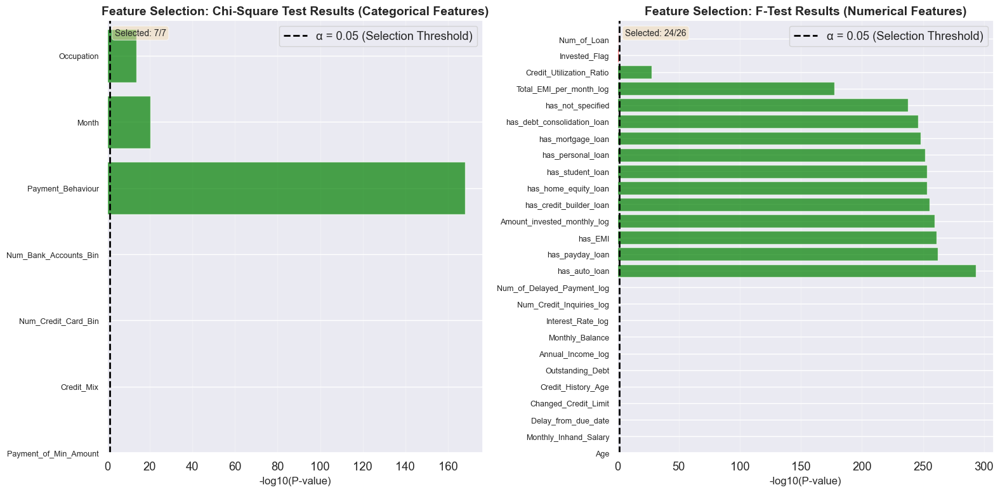

In [226]:
# P-value visualization for feature selection
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# P-values for categorical features
cat_results = feature_selection_results[feature_selection_results['Type'] == 'Categorical'].sort_values('P-value')
cat_results = cat_results[cat_results['P-value'].notna()]

if len(cat_results) > 0:
    colors_cat = ['green' if sig else 'red' for sig in cat_results['Significant']]
    axes[0].barh(range(len(cat_results)), -np.log10(cat_results['P-value']), color=colors_cat, alpha=0.7)
    axes[0].axvline(x=-np.log10(0.05), color='black', linestyle='--', linewidth=2, label='α = 0.05 (Selection Threshold)')
    axes[0].set_yticks(range(len(cat_results)))
    axes[0].set_yticklabels(cat_results['Column'], fontsize=9)
    axes[0].set_xlabel('-log10(P-value)', fontsize=12)
    axes[0].set_title('Feature Selection: Chi-Square Test Results (Categorical Features)', fontsize=14, fontweight='bold')
    axes[0].legend()
    axes[0].grid(axis='x', alpha=0.3)
    axes[0].text(0.02, 0.98, f'Selected: {sum(cat_results["Significant"])}/{len(cat_results)}', 
                transform=axes[0].transAxes, verticalalignment='top', 
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5), fontsize=10)

# P-values for numerical features
num_results = feature_selection_results[feature_selection_results['Type'] == 'Numerical'].sort_values('P-value')
num_results = num_results[num_results['P-value'].notna()]

if len(num_results) > 0:
    colors_num = ['green' if sig else 'red' for sig in num_results['Significant']]
    axes[1].barh(range(len(num_results)), -np.log10(num_results['P-value']), color=colors_num, alpha=0.7)
    axes[1].axvline(x=-np.log10(0.05), color='black', linestyle='--', linewidth=2, label='α = 0.05 (Selection Threshold)')
    axes[1].set_yticks(range(len(num_results)))
    axes[1].set_yticklabels(num_results['Column'], fontsize=9)
    axes[1].set_xlabel('-log10(P-value)', fontsize=12)
    axes[1].set_title('Feature Selection: F-Test Results (Numerical Features)', fontsize=14, fontweight='bold')
    axes[1].legend()
    axes[1].grid(axis='x', alpha=0.3)
    axes[1].text(0.02, 0.98, f'Selected: {sum(num_results["Significant"])}/{len(num_results)}', 
                transform=axes[1].transAxes, verticalalignment='top', 
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5), fontsize=10)

plt.tight_layout()
plt.show()


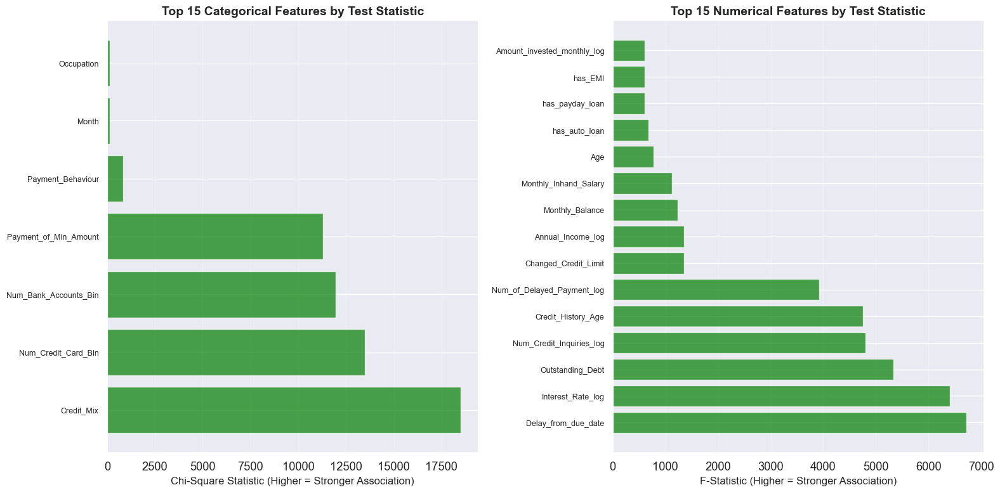

In [227]:
# Test statistics visualization for feature selection
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Chi-Square statistics
if len(cat_results) > 0:
    top_cat = cat_results.nlargest(15, 'Statistic')
    colors_cat = ['green' if sig else 'red' for sig in top_cat['Significant']]
    axes[0].barh(range(len(top_cat)), top_cat['Statistic'], color=colors_cat, alpha=0.7)
    axes[0].set_yticks(range(len(top_cat)))
    axes[0].set_yticklabels(top_cat['Column'], fontsize=9)
    axes[0].set_xlabel('Chi-Square Statistic (Higher = Stronger Association)', fontsize=12)
    axes[0].set_title('Top 15 Categorical Features by Test Statistic', fontsize=14, fontweight='bold')
    axes[0].grid(axis='x', alpha=0.3)

# F-statistics
if len(num_results) > 0:
    top_num = num_results.nlargest(15, 'Statistic')
    colors_num = ['green' if sig else 'red' for sig in top_num['Significant']]
    axes[1].barh(range(len(top_num)), top_num['Statistic'], color=colors_num, alpha=0.7)
    axes[1].set_yticks(range(len(top_num)))
    axes[1].set_yticklabels(top_num['Column'], fontsize=9)
    axes[1].set_xlabel('F-Statistic (Higher = Stronger Association)', fontsize=12)
    axes[1].set_title('Top 15 Numerical Features by Test Statistic', fontsize=14, fontweight='bold')
    axes[1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()


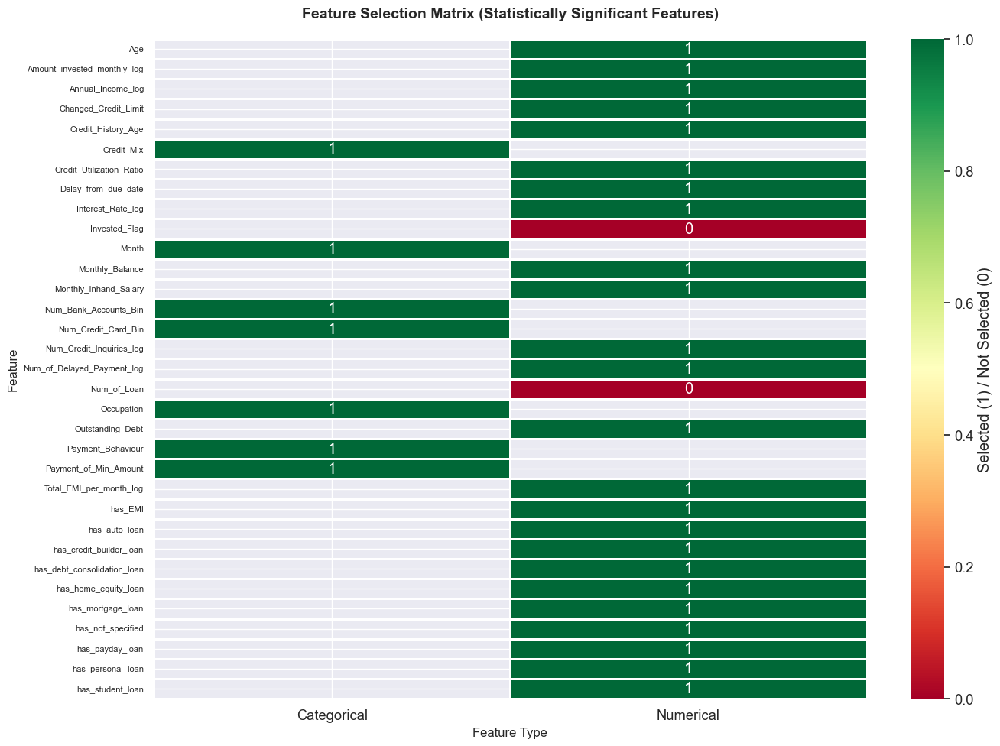

In [228]:
# Feature Selection Summary Heatmap
fig, ax = plt.subplots(figsize=(14, 10))

# Create significance matrix (True/False) for feature selection
sig_bool = feature_selection_results.pivot_table(
    values='Significant',
    index='Column',
    columns='Type',
    aggfunc='first'
)

# Plot heatmap
sns.heatmap(sig_bool.astype(float), annot=True, fmt='.0f', cmap='RdYlGn', 
           cbar_kws={'label': 'Selected (1) / Not Selected (0)'},
           linewidths=1, ax=ax)
ax.set_title('Feature Selection Matrix (Statistically Significant Features)', 
            fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('Feature Type', fontsize=12)
ax.set_ylabel('Feature', fontsize=12)
plt.xticks(rotation=0)
plt.yticks(rotation=0, fontsize=8)
plt.tight_layout()
plt.show()


### Feature Selection Interpretation & Recommendations


In [229]:
print("=" * 80)
print("FEATURE SELECTION: STATISTICAL HYPOTHESIS TESTING INTERPRETATION")
print("=" * 80)

print("\n1. CHI-SQUARE TEST (Categorical Features):")
print("   - Null Hypothesis (H0): The categorical feature is independent of Credit_Score")
print("   - Alternative Hypothesis (H1): The categorical feature is associated with Credit_Score")
print("   - If p-value < 0.05: Reject H0 → Feature is SELECTED (significant association)")
print("   - If p-value >= 0.05: Fail to reject H0 → Feature NOT SELECTED (no significant association)")

print("\n2. F-TEST / ANOVA (Numerical Features):")
print("   - Null Hypothesis (H0): All Credit_Score groups have equal means for the numerical feature")
print("   - Alternative Hypothesis (H1): At least one Credit_Score group has a different mean")
print("   - If p-value < 0.05: Reject H0 → Feature is SELECTED (means differ significantly)")
print("   - If p-value >= 0.05: Fail to reject H0 → Feature NOT SELECTED (no significant difference)")

print("\n3. FEATURE SELECTION RECOMMENDATIONS:")
print("   ✓ SELECTED features (p < 0.05): Strong candidates for predictive modeling")
print("   ✓ These features have statistical evidence of relationship with Credit_Score")
print("   ⚠ NOT SELECTED features (p >= 0.05): May still be useful in combination with other features")
print("   ⚠ Consider feature interactions and domain knowledge before excluding features")

print("\n4. FEATURE SELECTION SUMMARY:")
sig_count = len(significant_features)
total_count = len(feature_selection_results[feature_selection_results['P-value'].notna()])
print(f"   - SELECTED: {sig_count} out of {total_count} features (p < 0.05)")
print(f"   - Selection rate: {sig_count/total_count*100:.2f}%")
print(f"   - NOT SELECTED: {total_count - sig_count} features (p >= 0.05)")

print("\n" + "=" * 80)


FEATURE SELECTION: STATISTICAL HYPOTHESIS TESTING INTERPRETATION

1. CHI-SQUARE TEST (Categorical Features):
   - Null Hypothesis (H0): The categorical feature is independent of Credit_Score
   - Alternative Hypothesis (H1): The categorical feature is associated with Credit_Score
   - If p-value < 0.05: Reject H0 → Feature is SELECTED (significant association)
   - If p-value >= 0.05: Fail to reject H0 → Feature NOT SELECTED (no significant association)

2. F-TEST / ANOVA (Numerical Features):
   - Null Hypothesis (H0): All Credit_Score groups have equal means for the numerical feature
   - Alternative Hypothesis (H1): At least one Credit_Score group has a different mean
   - If p-value < 0.05: Reject H0 → Feature is SELECTED (means differ significantly)
   - If p-value >= 0.05: Fail to reject H0 → Feature NOT SELECTED (no significant difference)

3. FEATURE SELECTION RECOMMENDATIONS:
   ✓ SELECTED features (p < 0.05): Strong candidates for predictive modeling
   ✓ These features have 

In [230]:
# Export feature selection results to CSV for further analysis
feature_selection_results.to_csv('feature_selection_results.csv', index=False)
print("Feature selection results saved to 'feature_selection_results.csv'")

# Display top selected features
print("\n" + "=" * 80)
print("TOP 10 MOST SIGNIFICANT FEATURES FOR MODELING (Lowest P-values):")
print("=" * 80)
top_selected = feature_selection_results[feature_selection_results['P-value'].notna()].nsmallest(10, 'P-value')
print(top_selected[['Column', 'Type', 'Test', 'Statistic', 'P-value', 'Significant']].to_string(index=False))

# Create a list of selected feature names for easy use in modeling
selected_feature_names = significant_features['Column'].tolist()
print(f"\n" + "=" * 80)
print("SELECTED FEATURES LIST (for model training):")
print("=" * 80)
print(f"Total selected features: {len(selected_feature_names)}")
print("\nSelected Feature Names:")
print(selected_feature_names)
print("\n" + "=" * 80)

Feature selection results saved to 'feature_selection_results.csv'

TOP 10 MOST SIGNIFICANT FEATURES FOR MODELING (Lowest P-values):
               Column        Type       Test    Statistic  P-value  Significant
           Credit_Mix Categorical Chi-Square 18497.072539      0.0         True
Payment_of_Min_Amount Categorical Chi-Square 11296.650924      0.0         True
Num_Bank_Accounts_Bin Categorical Chi-Square 11951.687584      0.0         True
  Num_Credit_Card_Bin Categorical Chi-Square 13481.148249      0.0         True
                  Age   Numerical     F-Test   769.764225      0.0         True
Monthly_Inhand_Salary   Numerical     F-Test  1130.212390      0.0         True
  Delay_from_due_date   Numerical     F-Test  6715.121378      0.0         True
 Changed_Credit_Limit   Numerical     F-Test  1354.246434      0.0         True
     Outstanding_Debt   Numerical     F-Test  5336.160072      0.0         True
   Credit_History_Age   Numerical     F-Test  4758.306627      0.0 

In [231]:
# Remove Age_Group feature if it exists in any dataframe
if 'Age_Group' in train_df.columns:
    train_df = train_df.drop(columns=['Age_Group'])
    print("Age_Group removed from train_df")

if 'Age_Group' in val_df.columns:
    val_df = val_df.drop(columns=['Age_Group'])
    print("Age_Group removed from val_df")

if 'Age_Group' in test_df.columns:
    test_df = test_df.drop(columns=['Age_Group'])
    print("Age_Group removed from test_df")

print("Age_Group feature has been removed from all dataframes.")


Age_Group feature has been removed from all dataframes.


In [232]:
train_df.drop(columns=['Num_of_Loan', 'Invested_Flag'], inplace=True)
val_df.drop(columns=['Num_of_Loan', 'Invested_Flag'], inplace=True)
test_df.drop(columns=['Num_of_Loan', 'Invested_Flag'], inplace=True)

# Data Preparation: Encoding and Scaling

In [233]:
# Check current data types and structure
print("Data Preparation: Encoding and Scaling")
print("=" * 80)
print("\nCurrent Data Types:")
print(train_df.dtypes.value_counts())
print("\nCategorical columns:")
categorical_cols = train_df.select_dtypes(include=['object', 'category']).columns.tolist()
categorical_cols = [col for col in categorical_cols if col != target]
print(f"Total: {len(categorical_cols)}")
print(categorical_cols)

print("\nNumerical columns:")
numerical_cols = train_df.select_dtypes(include=[np.number]).columns.tolist()
print(f"Total: {len(numerical_cols)}")
print(numerical_cols)

print(f"\nTarget variable: {target}")
print(f"Target type: {train_df[target].dtype}")
print(f"Target unique values: {train_df[target].unique()}")


Data Preparation: Encoding and Scaling

Current Data Types:
int64       12
float64     12
object       6
bool         2
category     1
category     1
Name: count, dtype: int64

Categorical columns:
Total: 7
['Month', 'Occupation', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour', 'Num_Bank_Accounts_Bin', 'Num_Credit_Card_Bin']

Numerical columns:
Total: 24
['Age', 'Monthly_Inhand_Salary', 'Delay_from_due_date', 'Changed_Credit_Limit', 'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age', 'Monthly_Balance', 'Annual_Income_log', 'Interest_Rate_log', 'has_payday_loan', 'has_credit_builder_loan', 'has_not_specified', 'has_home_equity_loan', 'has_student_loan', 'has_mortgage_loan', 'has_personal_loan', 'has_debt_consolidation_loan', 'has_auto_loan', 'Num_of_Delayed_Payment_log', 'Num_Credit_Inquiries_log', 'Total_EMI_per_month_log', 'has_EMI', 'Amount_invested_monthly_log']

Target variable: Credit_Score
Target type: object
Target unique values: ['Poor' 'Good' 'Sta

### 1. Label Encoding for Target Variable


In [234]:
from sklearn.preprocessing import LabelEncoder

# Create label encoder for target variable
label_encoder = LabelEncoder()

# Fit and transform target variable for all splits
train_df_prepared = train_df.copy()
val_df_prepared = val_df.copy()
test_df_prepared = test_df.copy()

# Fit on training data only (to avoid data leakage)
train_df_prepared[f'{target}_encoded'] = label_encoder.fit_transform(train_df[target])
val_df_prepared[f'{target}_encoded'] = label_encoder.transform(val_df[target])
test_df_prepared[f'{target}_encoded'] = label_encoder.transform(test_df[target])

# Display mapping
print("Target Variable Encoding:")
print("=" * 80)
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
for label, encoded in sorted(label_mapping.items(), key=lambda x: x[1]):
    print(f"{label} -> {encoded}")

print(f"\nTraining set target distribution:")
print(train_df_prepared[f'{target}_encoded'].value_counts().sort_index())
print(f"\nValidation set target distribution:")
print(val_df_prepared[f'{target}_encoded'].value_counts().sort_index())
print(f"\nTest set target distribution:")
print(test_df_prepared[f'{target}_encoded'].value_counts().sort_index())


Target Variable Encoding:
Good -> 0
Poor -> 1
Standard -> 2

Training set target distribution:
Credit_Score_encoded
0    10353
1    16900
2    31041
Name: count, dtype: int64

Validation set target distribution:
Credit_Score_encoded
0     3483
1     5662
2    10353
Name: count, dtype: int64

Test set target distribution:
Credit_Score_encoded
0     3458
1     5644
2    10329
Name: count, dtype: int64


### 2. Encoding Categorical Features


In [235]:
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer

# Separate categorical and numerical features (excluding target)
X_train_features = train_df_prepared.drop(columns=[target, f'{target}_encoded'])
X_val_features = val_df_prepared.drop(columns=[target, f'{target}_encoded'])
X_test_features = test_df_prepared.drop(columns=[target, f'{target}_encoded'])

# Identify categorical and numerical columns
cat_features = X_train_features.select_dtypes(include=['object', 'category']).columns.tolist()
num_features = X_train_features.select_dtypes(include=[np.number]).columns.tolist()

print("Feature Encoding Strategy:")
print("=" * 80)
print(f"Categorical features ({len(cat_features)}): {cat_features}")
print(f"\nNumerical features ({len(num_features)}): {num_features}")

# Strategy: Use OneHotEncoder for categorical features with few unique values
# Use OrdinalEncoder for categorical features with many unique values
cat_features_onehot = []
cat_features_ordinal = []

for col in cat_features:
    n_unique = X_train_features[col].nunique()
    if n_unique <= 10:  # One-hot encode if <= 10 unique values
        cat_features_onehot.append(col)
    else:  # Ordinal encode if > 10 unique values
        cat_features_ordinal.append(col)

print(f"\nOne-Hot Encoding ({len(cat_features_onehot)} features): {cat_features_onehot}")
print(f"Ordinal Encoding ({len(cat_features_ordinal)} features): {cat_features_ordinal}")


Feature Encoding Strategy:
Categorical features (7): ['Month', 'Occupation', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour', 'Num_Bank_Accounts_Bin', 'Num_Credit_Card_Bin']

Numerical features (24): ['Age', 'Monthly_Inhand_Salary', 'Delay_from_due_date', 'Changed_Credit_Limit', 'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age', 'Monthly_Balance', 'Annual_Income_log', 'Interest_Rate_log', 'has_payday_loan', 'has_credit_builder_loan', 'has_not_specified', 'has_home_equity_loan', 'has_student_loan', 'has_mortgage_loan', 'has_personal_loan', 'has_debt_consolidation_loan', 'has_auto_loan', 'Num_of_Delayed_Payment_log', 'Num_Credit_Inquiries_log', 'Total_EMI_per_month_log', 'has_EMI', 'Amount_invested_monthly_log']

One-Hot Encoding (4 features): ['Month', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour']
Ordinal Encoding (3 features): ['Occupation', 'Num_Bank_Accounts_Bin', 'Num_Credit_Card_Bin']


In [236]:
# Create preprocessor pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore'), cat_features_onehot),
        ('ordinal', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), cat_features_ordinal),
        ('num', 'passthrough', num_features)  # Numerical features passed through (will be scaled later)
    ],
    remainder='drop'
)

# Fit preprocessor on training data only
print("Fitting preprocessor on training data...")
X_train_encoded = preprocessor.fit_transform(X_train_features)
X_val_encoded = preprocessor.transform(X_val_features)
X_test_encoded = preprocessor.transform(X_test_features)

# Get feature names after encoding
feature_names = []
if len(cat_features_onehot) > 0:
    onehot_feature_names = preprocessor.named_transformers_['onehot'].get_feature_names_out(cat_features_onehot)
    feature_names.extend(onehot_feature_names)
if len(cat_features_ordinal) > 0:
    feature_names.extend(cat_features_ordinal)
feature_names.extend(num_features)

print(f"\nEncoded feature shapes:")
print(f"Training: {X_train_encoded.shape}")
print(f"Validation: {X_val_encoded.shape}")
print(f"Test: {X_test_encoded.shape}")
print(f"\nTotal features after encoding: {len(feature_names)}")


Fitting preprocessor on training data...

Encoded feature shapes:
Training: (58294, 45)
Validation: (19498, 45)
Test: (19431, 45)

Total features after encoding: 45


### 3. Scaling Numerical Features


In [237]:
from sklearn.preprocessing import StandardScaler

# Find indices of numerical features in the encoded array
num_feature_indices = [feature_names.index(f) for f in num_features if f in feature_names]

# Create scaler and fit on training data only
scaler = StandardScaler()

# Scale numerical features
if len(num_feature_indices) > 0:
    X_train_scaled = X_train_encoded.copy()
    X_val_scaled = X_val_encoded.copy()
    X_test_scaled = X_test_encoded.copy()
    
    # Fit scaler on training data
    X_train_scaled[:, num_feature_indices] = scaler.fit_transform(X_train_encoded[:, num_feature_indices])
    
    # Transform validation and test data
    X_val_scaled[:, num_feature_indices] = scaler.transform(X_val_encoded[:, num_feature_indices])
    X_test_scaled[:, num_feature_indices] = scaler.transform(X_test_encoded[:, num_feature_indices])
    
    print("Scaling Applied:")
    print("=" * 80)
    print(f"Scaled {len(num_feature_indices)} numerical features")
    print(f"Scaled features: {num_features}")
    print(f"\nScaled data shapes:")
    print(f"Training: {X_train_scaled.shape}")
    print(f"Validation: {X_val_scaled.shape}")
    print(f"Test: {X_test_scaled.shape}")
else:
    X_train_scaled = X_train_encoded.copy()
    X_val_scaled = X_val_encoded.copy()
    X_test_scaled = X_test_encoded.copy()
    print("No numerical features to scale (all features are categorical)")


Scaling Applied:
Scaled 24 numerical features
Scaled features: ['Age', 'Monthly_Inhand_Salary', 'Delay_from_due_date', 'Changed_Credit_Limit', 'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age', 'Monthly_Balance', 'Annual_Income_log', 'Interest_Rate_log', 'has_payday_loan', 'has_credit_builder_loan', 'has_not_specified', 'has_home_equity_loan', 'has_student_loan', 'has_mortgage_loan', 'has_personal_loan', 'has_debt_consolidation_loan', 'has_auto_loan', 'Num_of_Delayed_Payment_log', 'Num_Credit_Inquiries_log', 'Total_EMI_per_month_log', 'has_EMI', 'Amount_invested_monthly_log']

Scaled data shapes:
Training: (58294, 45)
Validation: (19498, 45)
Test: (19431, 45)


### 4. Create Final Prepared Datasets


In [238]:
# Create final prepared datasets as DataFrames
X_train_final = pd.DataFrame(X_train_scaled, columns=feature_names, index=train_df_prepared.index)
X_val_final = pd.DataFrame(X_val_scaled, columns=feature_names, index=val_df_prepared.index)
X_test_final = pd.DataFrame(X_test_scaled, columns=feature_names, index=test_df_prepared.index)

# Target variables
y_train_final = train_df_prepared[f'{target}_encoded']
y_val_final = val_df_prepared[f'{target}_encoded']
y_test_final = test_df_prepared[f'{target}_encoded']

print("Final Prepared Datasets:")
print("=" * 80)
print(f"\nTraining set:")
print(f"  Features (X): {X_train_final.shape}")
print(f"  Target (y): {y_train_final.shape}")
print(f"  Target distribution:\n{y_train_final.value_counts().sort_index()}")

print(f"\nValidation set:")
print(f"  Features (X): {X_val_final.shape}")
print(f"  Target (y): {y_val_final.shape}")
print(f"  Target distribution:\n{y_val_final.value_counts().sort_index()}")

print(f"\nTest set:")
print(f"  Features (X): {X_test_final.shape}")
print(f"  Target (y): {y_test_final.shape}")
print(f"  Target distribution:\n{y_test_final.value_counts().sort_index()}")

print(f"\nFeature names ({len(feature_names)} total):")
print(feature_names[:10], "..." if len(feature_names) > 10 else "")


Final Prepared Datasets:

Training set:
  Features (X): (58294, 45)
  Target (y): (58294,)
  Target distribution:
Credit_Score_encoded
0    10353
1    16900
2    31041
Name: count, dtype: int64

Validation set:
  Features (X): (19498, 45)
  Target (y): (19498,)
  Target distribution:
Credit_Score_encoded
0     3483
1     5662
2    10353
Name: count, dtype: int64

Test set:
  Features (X): (19431, 45)
  Target (y): (19431,)
  Target distribution:
Credit_Score_encoded
0     3458
1     5644
2    10329
Name: count, dtype: int64

Feature names (45 total):
['Month_August', 'Month_February', 'Month_January', 'Month_July', 'Month_June', 'Month_March', 'Month_May', 'Credit_Mix_Good', 'Credit_Mix_Standard', 'Credit_Mix__'] ...


In [239]:
# Verify no missing values
print("\n" + "=" * 80)
print("Data Quality Check:")
print("=" * 80)
print(f"Missing values in X_train_final: {X_train_final.isnull().sum().sum()}")
print(f"Missing values in X_val_final: {X_val_final.isnull().sum().sum()}")
print(f"Missing values in X_test_final: {X_test_final.isnull().sum().sum()}")
print(f"Missing values in y_train_final: {y_train_final.isnull().sum()}")
print(f"Missing values in y_val_final: {y_val_final.isnull().sum()}")
print(f"Missing values in y_test_final: {y_test_final.isnull().sum()}")

# Check for infinite values
print(f"\nInfinite values in X_train_final: {np.isinf(X_train_final).sum().sum()}")
print(f"Infinite values in X_val_final: {np.isinf(X_val_final).sum().sum()}")
print(f"Infinite values in X_test_final: {np.isinf(X_test_final).sum().sum()}")



Data Quality Check:
Missing values in X_train_final: 0
Missing values in X_val_final: 0
Missing values in X_test_final: 0
Missing values in y_train_final: 0
Missing values in y_val_final: 0
Missing values in y_test_final: 0

Infinite values in X_train_final: 0
Infinite values in X_val_final: 0
Infinite values in X_test_final: 0


### Summary: Data Preparation Complete


In [240]:
print("=" * 80)
print("DATA PREPARATION SUMMARY")
print("=" * 80)

print("\n✓ Target Variable:")
print(f"  - Encoded: {target} -> {target}_encoded")
print(f"  - Mapping: {label_mapping}")

print(f"\n✓ Feature Encoding:")
print(f"  - One-Hot Encoded: {len(cat_features_onehot)} categorical features")
print(f"  - Ordinal Encoded: {len(cat_features_ordinal)} categorical features")
print(f"  - Numerical Features: {len(num_features)} features")

print(f"\n✓ Feature Scaling:")
print(f"  - Scaled: {len(num_feature_indices)} numerical features using StandardScaler")
print(f"  - Method: StandardScaler (mean=0, std=1)")

print(f"\n✓ Final Datasets Ready:")
print(f"  - X_train_final: {X_train_final.shape} (features)")
print(f"  - y_train_final: {y_train_final.shape} (target)")
print(f"  - X_val_final: {X_val_final.shape} (features)")
print(f"  - y_val_final: {y_val_final.shape} (target)")
print(f"  - X_test_final: {X_test_final.shape} (features)")
print(f"  - y_test_final: {y_test_final.shape} (target)")

print("\n" + "=" * 80)

DATA PREPARATION SUMMARY

✓ Target Variable:
  - Encoded: Credit_Score -> Credit_Score_encoded
  - Mapping: {'Good': np.int64(0), 'Poor': np.int64(1), 'Standard': np.int64(2)}

✓ Feature Encoding:
  - One-Hot Encoded: 4 categorical features
  - Ordinal Encoded: 3 categorical features
  - Numerical Features: 24 features

✓ Feature Scaling:
  - Scaled: 24 numerical features using StandardScaler
  - Method: StandardScaler (mean=0, std=1)

✓ Final Datasets Ready:
  - X_train_final: (58294, 45) (features)
  - y_train_final: (58294,) (target)
  - X_val_final: (19498, 45) (features)
  - y_val_final: (19498,) (target)
  - X_test_final: (19431, 45) (features)
  - y_test_final: (19431,) (target)



# Handling Class Imbalance

In [241]:
train_df.Credit_Score.value_counts(normalize=True)

Credit_Score
Standard    0.53249
Poor        0.28991
Good        0.17760
Name: proportion, dtype: float64

## Over/Under Sampling: Handling Class Imbalance


Original Training Data Class Distribution:

Count:
Credit_Score
Standard    31041
Poor        16900
Good        10353
Name: count, dtype: int64

Percentage:
Credit_Score
Standard    53.249048
Poor        28.990977
Good        17.759975
Name: proportion, dtype: float64


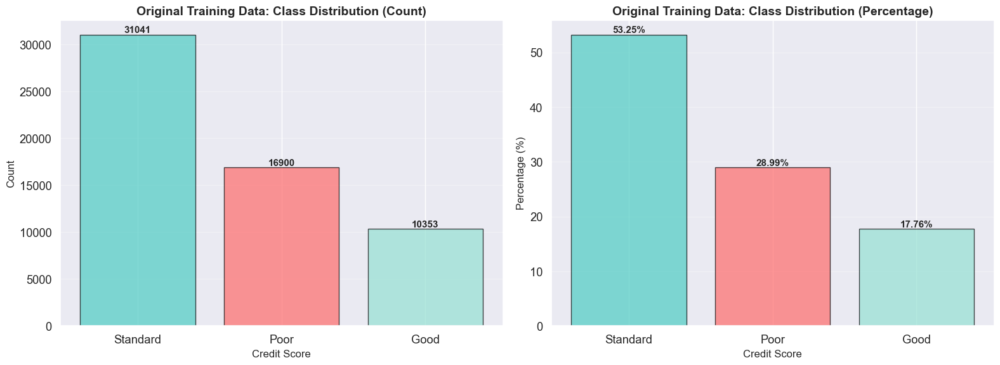


Class Imbalance Ratio:
Majority class: Standard (31041 samples)
Minority class: Good (10353 samples)
Imbalance ratio: 3.00:1


In [242]:
# Check current class distribution in training data
print("Original Training Data Class Distribution:")
print("=" * 80)
original_distribution = train_df[target].value_counts()
original_distribution_pct = train_df[target].value_counts(normalize=True) * 100

print("\nCount:")
print(original_distribution)
print("\nPercentage:")
print(original_distribution_pct)

# Visualize original distribution
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Count plot
axes[0].bar(original_distribution.index, original_distribution.values, 
           color=['#4ecdc4', '#ff6b6b', '#95e1d3'], alpha=0.7, edgecolor='black')
axes[0].set_xlabel('Credit Score', fontsize=12)
axes[0].set_ylabel('Count', fontsize=12)
axes[0].set_title('Original Training Data: Class Distribution (Count)', fontsize=14, fontweight='bold')
axes[0].grid(axis='y', alpha=0.3)
for i, (idx, val) in enumerate(original_distribution.items()):
    axes[0].text(i, val, str(val), ha='center', va='bottom', fontsize=11, fontweight='bold')

# Percentage plot
axes[1].bar(original_distribution_pct.index, original_distribution_pct.values, 
           color=['#4ecdc4', '#ff6b6b', '#95e1d3'], alpha=0.7, edgecolor='black')
axes[1].set_xlabel('Credit Score', fontsize=12)
axes[1].set_ylabel('Percentage (%)', fontsize=12)
axes[1].set_title('Original Training Data: Class Distribution (Percentage)', fontsize=14, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)
for i, (idx, val) in enumerate(original_distribution_pct.items()):
    axes[1].text(i, val, f'{val:.2f}%', ha='center', va='bottom', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.show()

print(f"\nClass Imbalance Ratio:")
max_class = original_distribution.max()
min_class = original_distribution.min()
print(f"Majority class: {original_distribution.idxmax()} ({max_class} samples)")
print(f"Minority class: {original_distribution.idxmin()} ({min_class} samples)")
print(f"Imbalance ratio: {max_class/min_class:.2f}:1")


### 3. Original Dataset

In [243]:
# Original dataset (no sampling applied)
# Use prepared datasets: X_train_final and y_train_final
X_train_original = X_train_final.copy()
y_train_original = y_train_final.copy()

print("Original Dataset:")
print("=" * 80)
print(f"Total samples: {len(X_train_original)}")
print(f"\nClass distribution:")
print(y_train_original.value_counts().sort_index())
print(f"\nClass distribution (%):")
print(y_train_original.value_counts(normalize=True).sort_index() * 100)


Original Dataset:
Total samples: 58294

Class distribution:
Credit_Score_encoded
0    10353
1    16900
2    31041
Name: count, dtype: int64

Class distribution (%):
Credit_Score_encoded
0    17.759975
1    28.990977
2    53.249048
Name: proportion, dtype: float64


### 2. Under-Sampled Dataset


In [244]:
from imblearn.under_sampling import RandomUnderSampler

# Use prepared datasets for under-sampling
# X_train_final and y_train_final are already encoded and scaled
print("Applying Random Under-Sampling...")
print("=" * 80)
undersampler = RandomUnderSampler(random_state=42, sampling_strategy='auto')
X_train_under, y_train_under = undersampler.fit_resample(X_train_final.values, y_train_final.values)

# Create under-sampled dataframes
X_train_under = pd.DataFrame(X_train_under, columns=X_train_final.columns, index=range(len(X_train_under)))
y_train_under = pd.Series(y_train_under, name=f'{target}_encoded')

print(f"\nUnder-Sampled Dataset:")
print(f"Total samples: {len(X_train_under)}")
print(f"\nClass distribution:")
print(y_train_under.value_counts().sort_index())
print(f"\nClass distribution (%):")
print(y_train_under.value_counts(normalize=True).sort_index() * 100)


Applying Random Under-Sampling...

Under-Sampled Dataset:
Total samples: 31059

Class distribution:
Credit_Score_encoded
0    10353
1    10353
2    10353
Name: count, dtype: int64

Class distribution (%):
Credit_Score_encoded
0    33.333333
1    33.333333
2    33.333333
Name: proportion, dtype: float64


### 3. Over-Sampled Dataset


In [245]:
from imblearn.over_sampling import RandomOverSampler

# Use prepared datasets for over-sampling
# X_train_final and y_train_final are already encoded and scaled
print("Applying Random Over-Sampling...")
print("=" * 80)
oversampler = RandomOverSampler(random_state=42, sampling_strategy='auto')
X_train_over, y_train_over = oversampler.fit_resample(X_train_final.values, y_train_final.values)

# Create over-sampled dataframes
X_train_over = pd.DataFrame(X_train_over, columns=X_train_final.columns, index=range(len(X_train_over)))
y_train_over = pd.Series(y_train_over, name=f'{target}_encoded')

print(f"\nOver-Sampled Dataset:")
print(f"Total samples: {len(X_train_over)}")
print(f"\nClass distribution:")
print(y_train_over.value_counts().sort_index())
print(f"\nClass distribution (%):")
print(y_train_over.value_counts(normalize=True).sort_index() * 100)


Applying Random Over-Sampling...

Over-Sampled Dataset:
Total samples: 93123

Class distribution:
Credit_Score_encoded
0    31041
1    31041
2    31041
Name: count, dtype: int64

Class distribution (%):
Credit_Score_encoded
0    33.333333
1    33.333333
2    33.333333
Name: proportion, dtype: float64


### 4. SMOTE Dataset


In [246]:
# Apply SMOTE (Synthetic Minority Over-sampling Technique)
# Use prepared datasets for SMOTE
# X_train_final and y_train_final are already encoded and scaled
print("Applying SMOTE...")
print("=" * 80)
smote = SMOTE(random_state=42, sampling_strategy='auto')
X_train_smote, y_train_smote = smote.fit_resample(X_train_final.values, y_train_final.values)

# Create SMOTE dataframes
X_train_smote = pd.DataFrame(X_train_smote, columns=X_train_final.columns, index=range(len(X_train_smote)))
y_train_smote = pd.Series(y_train_smote, name=f'{target}_encoded')

print(f"\nSMOTE Dataset:")
print(f"Total samples: {len(X_train_smote)}")
print(f"\nClass distribution:")
print(y_train_smote.value_counts().sort_index())
print(f"\nClass distribution (%):")
print(y_train_smote.value_counts(normalize=True).sort_index() * 100)


Applying SMOTE...

SMOTE Dataset:
Total samples: 93123

Class distribution:
Credit_Score_encoded
0    31041
1    31041
2    31041
Name: count, dtype: int64

Class distribution (%):
Credit_Score_encoded
0    33.333333
1    33.333333
2    33.333333
Name: proportion, dtype: float64


### Comparison of All Sampling Methods


In [247]:
# Create comparison dataframe
# Get unique class values from y_train_original (encoded values)
unique_classes = sorted(y_train_original.unique())
class_names = [label_encoder.inverse_transform([cls])[0] for cls in unique_classes]

comparison_data = {
    'Dataset': ['Original', 'Under-Sampled', 'Over-Sampled', 'SMOTE'],
    'Total Samples': [
        len(X_train_original),
        len(X_train_under),
        len(X_train_over),
        len(X_train_smote)
    ]
}

# Add class counts for each dataset
for i, class_name in enumerate(class_names):
    class_encoded = unique_classes[i]
    comparison_data[f'{class_name} Count'] = [
        len(y_train_original[y_train_original == class_encoded]),
        len(y_train_under[y_train_under == class_encoded]),
        len(y_train_over[y_train_over == class_encoded]),
        len(y_train_smote[y_train_smote == class_encoded])
    ]
    comparison_data[f'{class_name} %'] = [
        f"{len(y_train_original[y_train_original == class_encoded]) / len(y_train_original) * 100:.2f}%",
        f"{len(y_train_under[y_train_under == class_encoded]) / len(y_train_under) * 100:.2f}%",
        f"{len(y_train_over[y_train_over == class_encoded]) / len(y_train_over) * 100:.2f}%",
        f"{len(y_train_smote[y_train_smote == class_encoded]) / len(y_train_smote) * 100:.2f}%"
    ]

comparison_df = pd.DataFrame(comparison_data)
print("Comparison of All Sampling Methods:")
print("=" * 80)
print(comparison_df.to_string(index=False))


Comparison of All Sampling Methods:
      Dataset  Total Samples  Good Count Good %  Poor Count Poor %  Standard Count Standard %
     Original          58294       10353 17.76%       16900 28.99%           31041     53.25%
Under-Sampled          31059       10353 33.33%       10353 33.33%           10353     33.33%
 Over-Sampled          93123       31041 33.33%       31041 33.33%           31041     33.33%
        SMOTE          93123       31041 33.33%       31041 33.33%           31041     33.33%


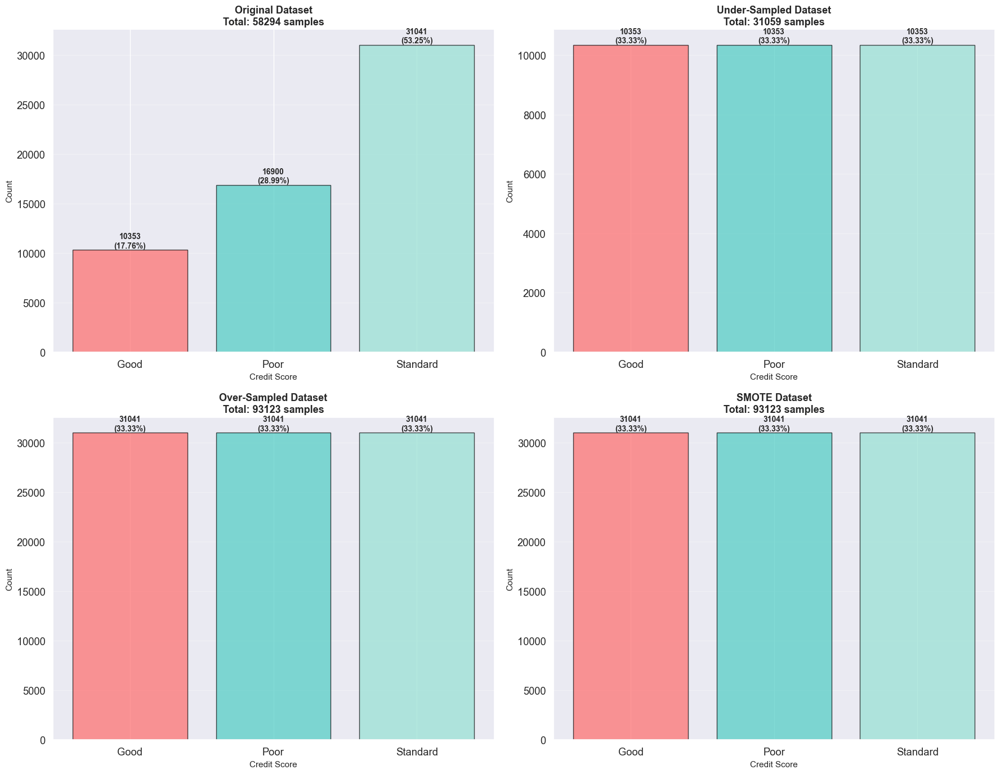

In [248]:
# Visualize comparison of all sampling methods
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

datasets_y = {
    'Original': y_train_original,
    'Under-Sampled': y_train_under,
    'Over-Sampled': y_train_over,
    'SMOTE': y_train_smote
}

datasets_X = {
    'Original': X_train_original,
    'Under-Sampled': X_train_under,
    'Over-Sampled': X_train_over,
    'SMOTE': X_train_smote
}

colors = ['#ff6b6b', '#4ecdc4', '#95e1d3']

for idx, (name, y_data) in enumerate(datasets_y.items()):
    row = idx // 2
    col = idx % 2
    ax = axes[row, col]
    
    dist = y_data.value_counts().sort_index()
    dist_pct = y_data.value_counts(normalize=True).sort_index() * 100
    
    # Map encoded values to class names for display
    class_labels = [label_encoder.inverse_transform([cls])[0] for cls in dist.index]
    
    # Bar plot
    bars = ax.bar(range(len(dist)), dist.values, color=colors[:len(dist)], alpha=0.7, edgecolor='black')
    ax.set_xlabel('Credit Score', fontsize=11)
    ax.set_ylabel('Count', fontsize=11)
    ax.set_title(f'{name} Dataset\nTotal: {len(datasets_X[name])} samples', fontsize=13, fontweight='bold')
    ax.set_xticks(range(len(dist)))
    ax.set_xticklabels(class_labels)
    ax.grid(axis='y', alpha=0.3)
    
    # Add count labels on bars
    for i, (idx_val, val) in enumerate(dist.items()):
        ax.text(i, val, f'{val}\n({dist_pct[idx_val]:.2f}%)', 
               ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()


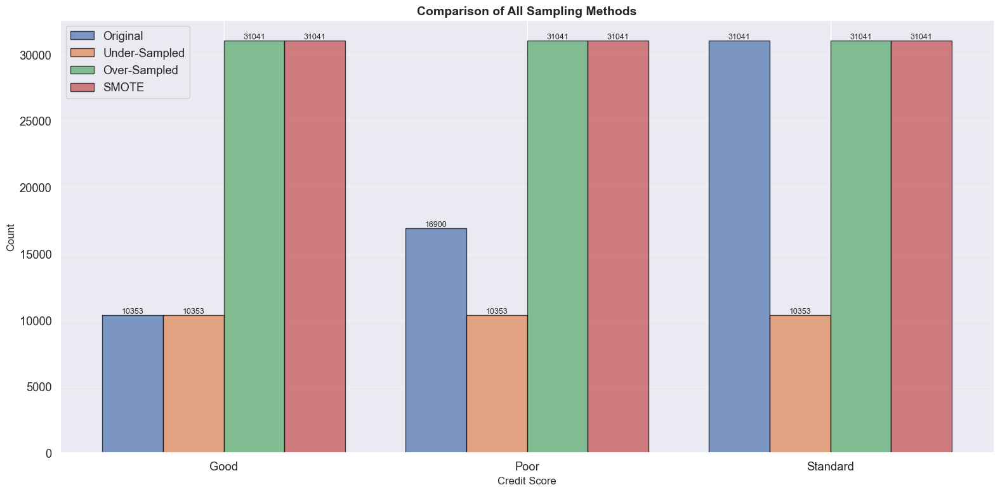

In [249]:
# Side-by-side comparison visualization
fig, ax = plt.subplots(figsize=(16, 8))

# Get unique classes and their labels
unique_classes = sorted(y_train_original.unique())
class_labels = [label_encoder.inverse_transform([cls])[0] for cls in unique_classes]

x = np.arange(len(unique_classes))
width = 0.2

datasets_list = [
    ('Original', y_train_original),
    ('Under-Sampled', y_train_under),
    ('Over-Sampled', y_train_over),
    ('SMOTE', y_train_smote)
]

for i, (name, y_data) in enumerate(datasets_list):
    counts = [len(y_data[y_data == cls]) for cls in unique_classes]
    offset = (i - 1.5) * width
    bars = ax.bar(x + offset, counts, width, label=name, alpha=0.7, edgecolor='black')
    
    # Add value labels
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{int(height)}',
               ha='center', va='bottom', fontsize=9)

ax.set_xlabel('Credit Score', fontsize=12)
ax.set_ylabel('Count', fontsize=12)
ax.set_title('Comparison of All Sampling Methods', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(class_labels)
ax.legend()
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


# Save datasets

In [250]:
import os

In [251]:
# Create directory for datasets if it doesn't exist
datasets_dir = 'datasets'
if not os.path.exists(datasets_dir):
    os.makedirs(datasets_dir)
    print(f"Created directory: {datasets_dir}")

# Save training datasets
print("Saving training datasets...")

# 1. Original dataset
X_train_original.to_csv(os.path.join(datasets_dir, 'X_train_original.csv'), index=False)
y_train_original.to_csv(os.path.join(datasets_dir, 'y_train_original.csv'), index=False)
print(f"✓ Original dataset saved: {len(X_train_original)} samples")

# 2. Under-sampled dataset
X_train_under.to_csv(os.path.join(datasets_dir, 'X_train_under.csv'), index=False)
y_train_under.to_csv(os.path.join(datasets_dir, 'y_train_under.csv'), index=False)
print(f"✓ Under-sampled dataset saved: {len(X_train_under)} samples")

# 3. Over-sampled dataset
X_train_over.to_csv(os.path.join(datasets_dir, 'X_train_over.csv'), index=False)
y_train_over.to_csv(os.path.join(datasets_dir, 'y_train_over.csv'), index=False)
print(f"✓ Over-sampled dataset saved: {len(X_train_over)} samples")

# 4. SMOTE dataset
X_train_smote.to_csv(os.path.join(datasets_dir, 'X_train_smote.csv'), index=False)
y_train_smote.to_csv(os.path.join(datasets_dir, 'y_train_smote.csv'), index=False)
print(f"✓ SMOTE dataset saved: {len(X_train_smote)} samples")

# Save test dataset
print("\nSaving test dataset...")
X_test_final.to_csv(os.path.join(datasets_dir, 'X_test.csv'), index=False)
y_test_final.to_csv(os.path.join(datasets_dir, 'y_test.csv'), index=False)
print(f"✓ Test dataset saved: {len(X_test_final)} samples")

# Save val dataset
print("\nSaving val dataset...")
X_val_final.to_csv(os.path.join(datasets_dir, 'X_val.csv'), index=False)
y_val_final.to_csv(os.path.join(datasets_dir, 'y_val.csv'), index=False)
print(f"✓ Val dataset saved: {len(X_val_final)} samples")

Saving training datasets...
✓ Original dataset saved: 58294 samples
✓ Under-sampled dataset saved: 31059 samples
✓ Over-sampled dataset saved: 93123 samples
✓ SMOTE dataset saved: 93123 samples

Saving test dataset...
✓ Test dataset saved: 19431 samples

Saving val dataset...
✓ Val dataset saved: 19498 samples
